<a href="https://colab.research.google.com/github/alpacaYiChun/ML/blob/master/gan_dun.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)
  
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Sun Feb 12 00:14:29 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P0    26W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from keras.layers.pooling.max_pooling2d import MaxPool2D
import tensorflow as tf
import tensorflow.keras as keras
from keras.datasets import mnist
from keras.layers import Dense, Conv2D, Conv2DTranspose, Reshape, LeakyReLU, BatchNormalization, Flatten, Activation, Input, Dropout
from keras.regularizers import L2
from keras.models import Model
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
latent_dim = 100
R = 28
C = 28
CH = 1
# filter, kernel, stride
configs = [[128, 4, 2], [128, 4, 2]]
disc_configs = [[64, 3, 2], [64, 3, 2]]

def decode(x):
  y = x
  fact = 1
  for config in configs:
    fact = fact * config[2]
  last_row = int(R / fact)
  last_col = int(C / fact)
  last_channel = configs[0][0]
  y = Dense(last_row * last_col * last_channel)(y)
  y = Reshape((last_row, last_col, last_channel))(y)
  for config in configs:
    y = Conv2DTranspose(config[0], config[1], config[2], padding='same')(y)
    y = LeakyReLU(alpha=0.2)(y)
    #y = BatchNormalization()(y)
    
  y = Conv2D(CH, (7, 7), padding='same', activation='sigmoid')(y)

  return y

def feature(x):
  y = x
  for config in disc_configs:
    y = Conv2D(config[0], config[1], config[2], padding='same')(y)
    #y = MaxPool2D((2, 2))(y)
    y = LeakyReLU(alpha=0.2)(y)
    y = Dropout(0.4)(y)
    #y = BatchNormalization()(y)

  y = Flatten()(y)
  return y



  

In [ ]:
def classifier_output(x):
  y = x
  y = Dense(10, activation='softmax')(y)
  return y

(x_train, y_train), (x_test, y_test) = mnist.load_data()

# learn to classify
classifier_input = Input((R, C, CH))
f = feature(classifier_input)
c_output = classifier_output(f)
classifier = Model(classifier_input, c_output)
print(classifier.summary())

classifier.compile(loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                   optimizer=keras.optimizers.Adam(learning_rate=0.005),
                   metrics=[keras.metrics.SparseCategoricalAccuracy()])
classifier.fit(x_train, y_train, validation_data=(x_test,y_test), epochs=10)

11490434/11490434 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 14, 14, 64)        640       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 14, 14, 64)        0         
                                                                 
 dropout (Dropout)           (None, 14, 14, 64)        0         
                                                                 
 flatten (Flatten)           (None, 12544)             0         
                                                                 
 dense (Dense)               (None, 10)                125450    
                                                              

/usr/local/lib/python3.8/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


1875/1875 [==============================] - 13s 3ms/step - loss: 9.2600 - sparse_categorical_accuracy: 0.8499 - val_loss: 8.6172 - val_sparse_categorical_accuracy: 0.9034
Epoch 2/10
1875/1875 [==============================] - 5s 2ms/step - loss: 12.7473 - sparse_categorical_accuracy: 0.8925 - val_loss: 11.6126 - val_sparse_categorical_accuracy: 0.9271
Epoch 3/10
1875/1875 [==============================] - 5s 2ms/step - loss: 14.0686 - sparse_categorical_accuracy: 0.9059 - val_loss: 11.9364 - val_sparse_categorical_accuracy: 0.9262
Epoch 4/10
1875/1875 [==============================] - 5s 2ms/step - loss: 15.1529 - sparse_categorical_accuracy: 0.9118 - val_loss: 13.1720 - val_sparse_categorical_accuracy: 0.9371
Epoch 5/10
1875/1875 [==============================] - 5s 2ms/step - loss: 16.6411 - sparse_categorical_accuracy: 0.9160 - val_loss: 9.4286 - val_sparse_categorical_accuracy: 0.9497
Epoch 6/10
1875/1875 [==============================] - 5s 2ms/step - loss: 16.7555 - sparse_

1/1 [==============================] - 0s 76ms/step
[7 5 0 3 8]


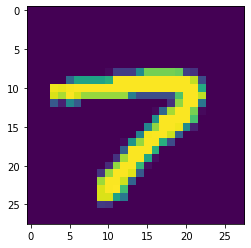

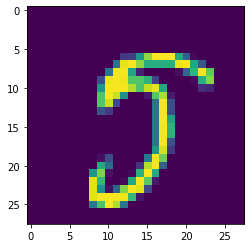

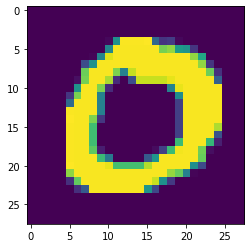

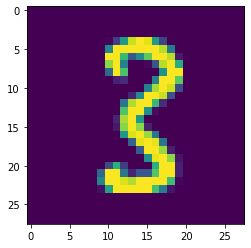

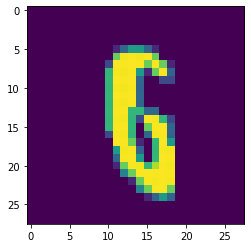

In [ ]:
# do some test
test_n = y_test.shape[0]
selected = np.random.randint(0, test_n, size=5)
to_show = x_test[selected]
perf = classifier.predict(to_show)
print(np.argmax(perf, axis=1))
for s in selected:
  plt.imshow(x_test[s])
  plt.show()

In [ ]:
from keras.optimizers.optimizer_experimental import optimizer
from os import name
from keras import regularizers

# create discriminator
def create_discriminator(input_shape):
  x = Input(input_shape)
  f = feature(x)
  disc_out = Dense(1, activation='sigmoid', name='disc_out')(f)
  return Model(x, disc_out, name='xiaodai')

def create_generator(disc_model):
  x = Input((latent_dim,))
  image = decode(x)
  score = disc_model(image)
  return Model(x, image), Model(x, score)

disc_model = create_discriminator((R,C,CH))
print(disc_model.summary())
gen_model, gen_dis_model = create_generator(disc_model)
print(gen_model.summary())
print(gen_dis_model.summary())

disc_model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(0.0002, beta_1=0.5), metrics=[keras.metrics.binary_crossentropy, keras.metrics.binary_accuracy])
gen_dis_model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(0.0002, beta_1=0.5))

Model: "xiaodai"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 14, 14, 64)        640       
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 14, 14, 64)        0         
                                                                 
 dropout_2 (Dropout)         (None, 14, 14, 64)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 7, 7, 64)          36928     
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 7, 7, 64)          0         
                                                                 
 dropout_3 (Dropout)         (None, 7, 7, 64)          0   

In [ ]:
from numpy.random import randn

def generate_latent_points(latent_dim, n_samples):
 # generate points in the latent space
 x_input = randn(latent_dim * n_samples)
 # reshape into a batch of inputs for the network
 x_input = x_input.reshape(n_samples, latent_dim)
 return x_input

(60000, 28, 28)
(60000,)
train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


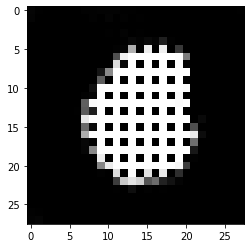

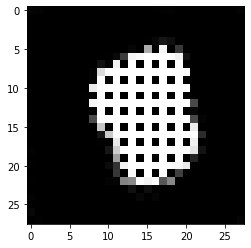

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


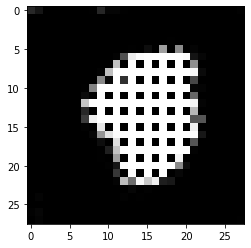

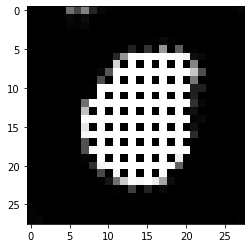

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


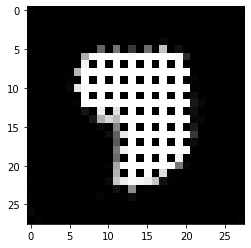

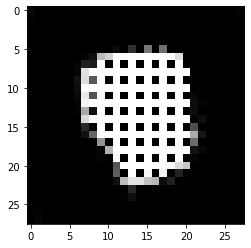

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


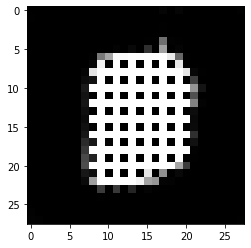

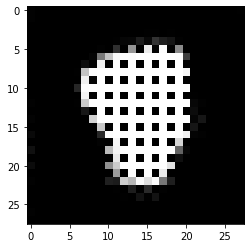

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


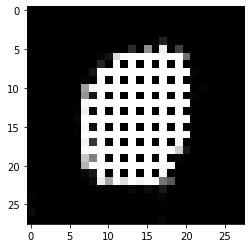

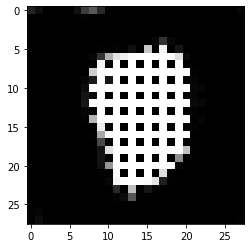

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


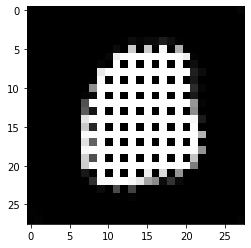

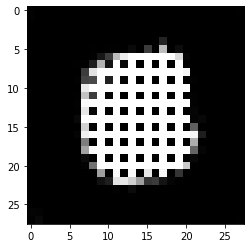

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


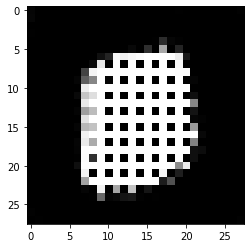

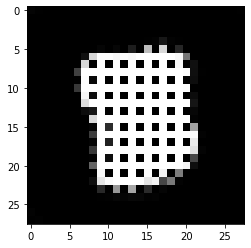

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


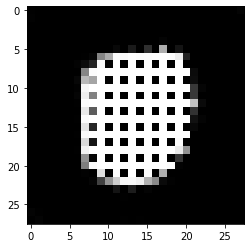

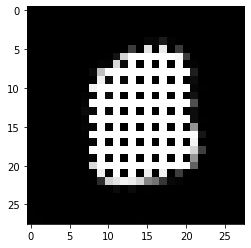

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


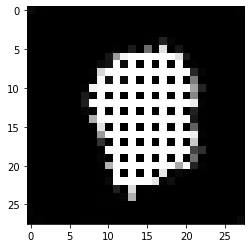

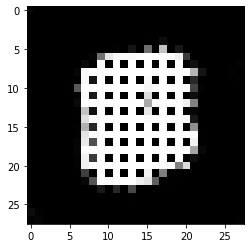

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


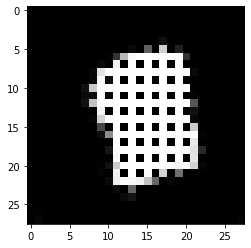

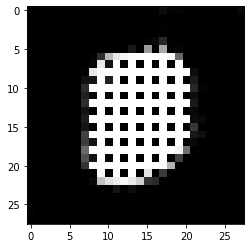

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


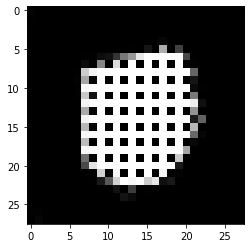

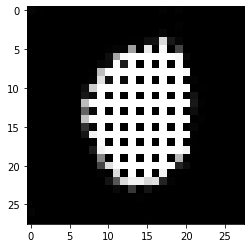

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


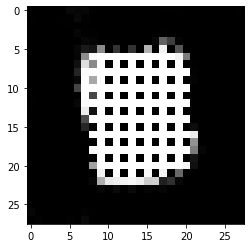

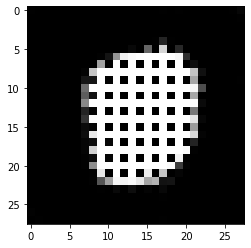

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


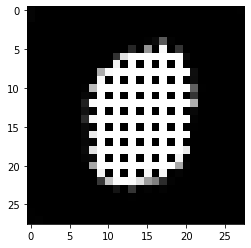

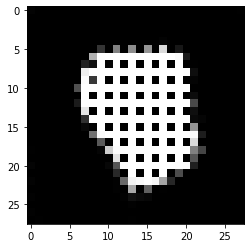

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


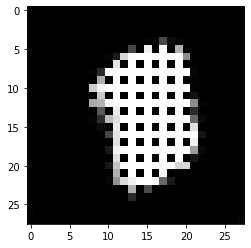

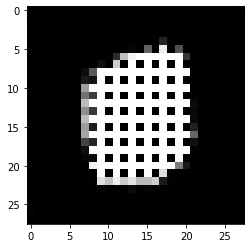

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


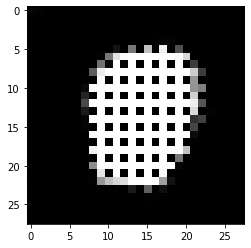

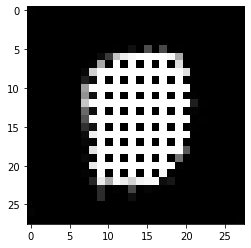

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


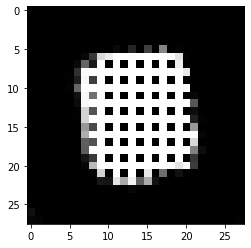

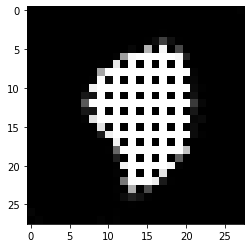

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


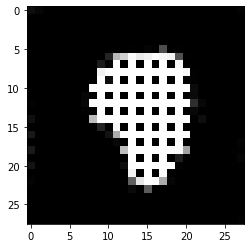

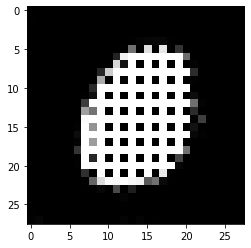

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


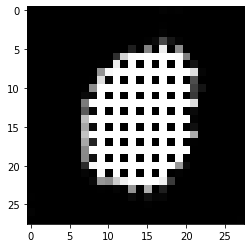

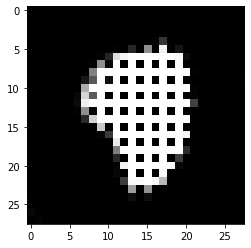

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


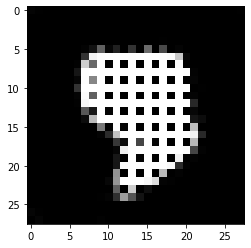

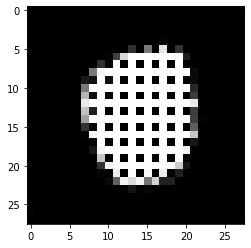

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


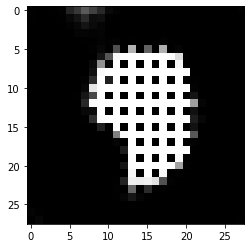

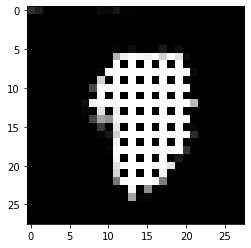

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


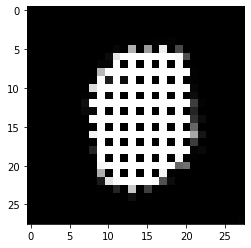

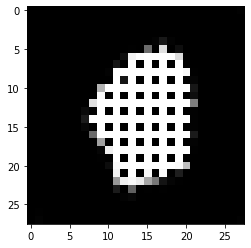

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


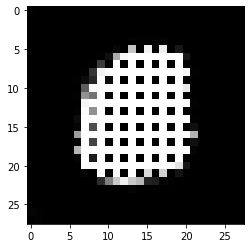

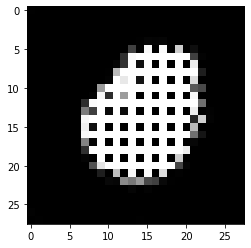

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


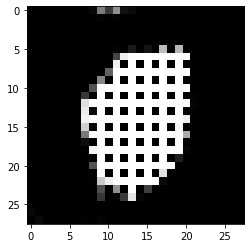

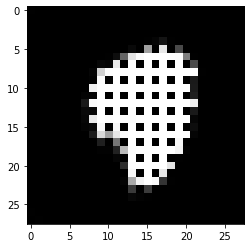

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


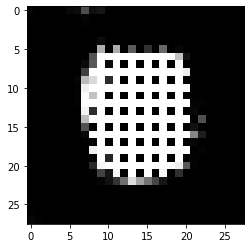

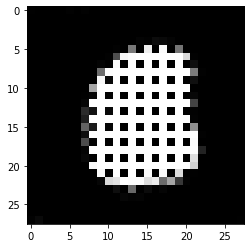

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


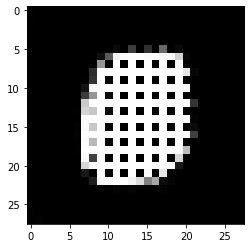

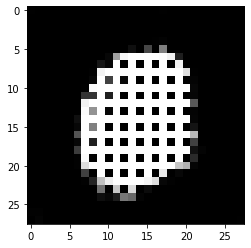

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


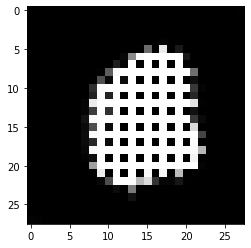

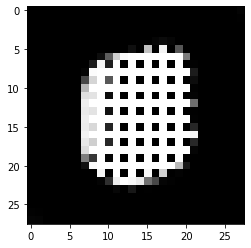

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


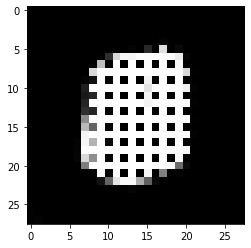

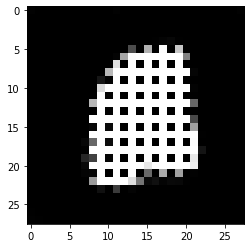

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


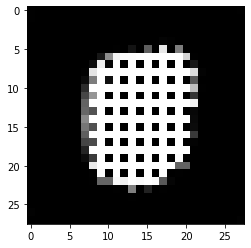

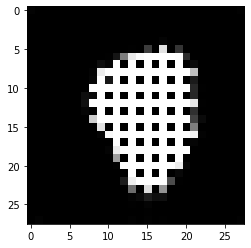

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


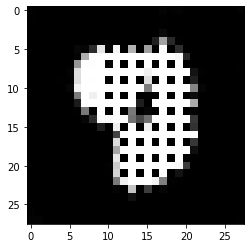

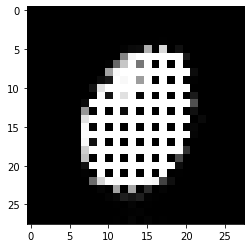

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


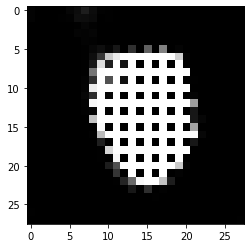

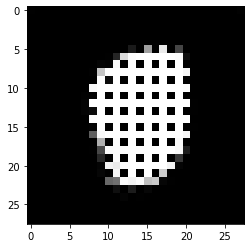

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


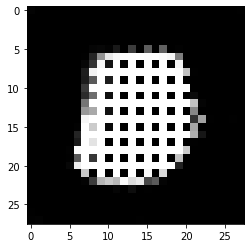

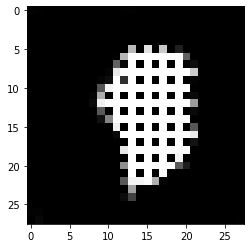

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


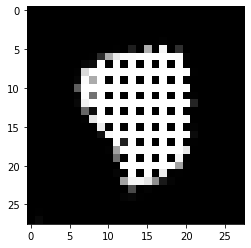

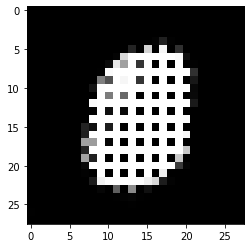

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


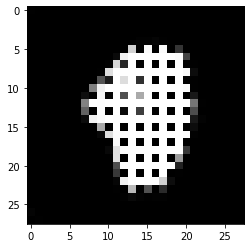

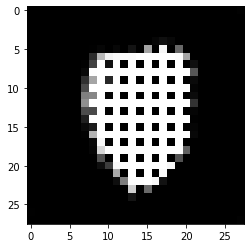

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


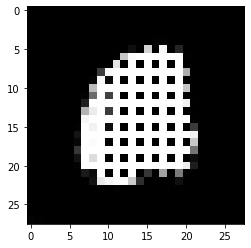

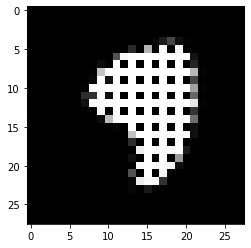

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


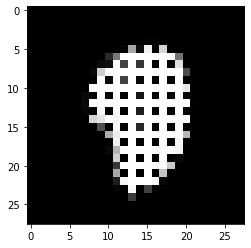

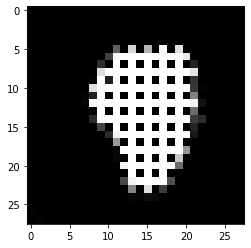

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


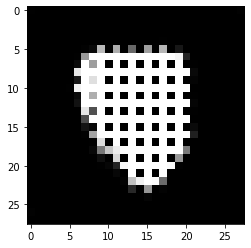

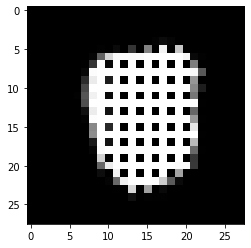

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


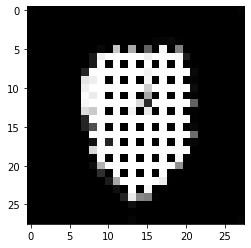

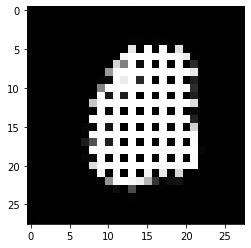

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


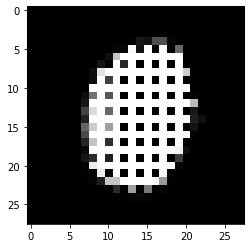

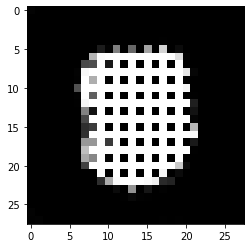

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


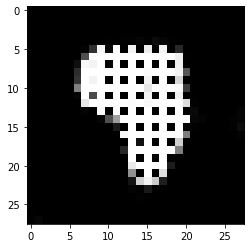

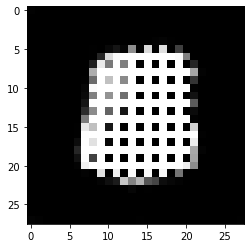

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


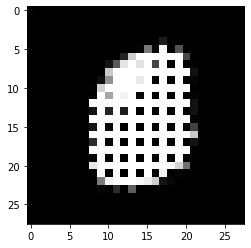

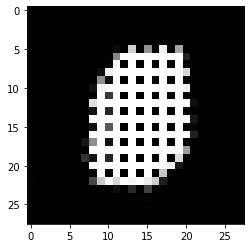

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


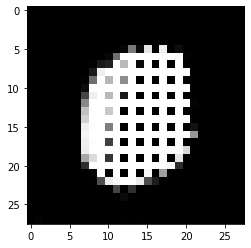

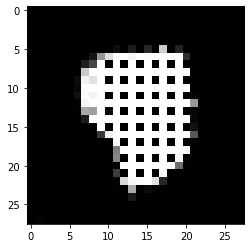

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


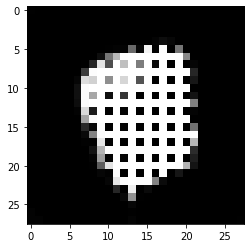

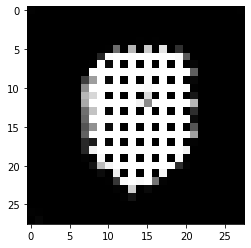

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


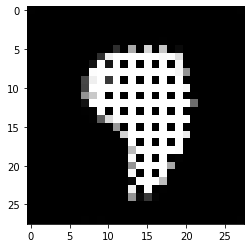

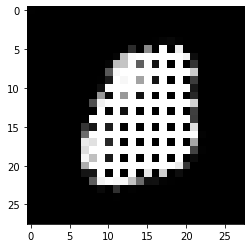

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


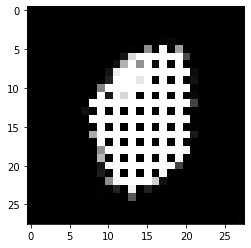

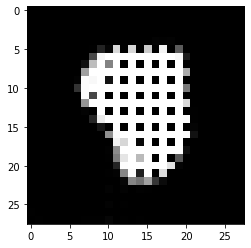

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


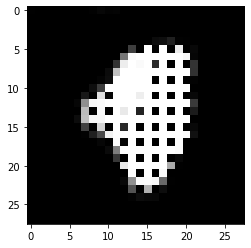

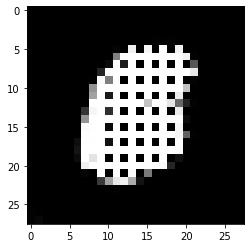

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


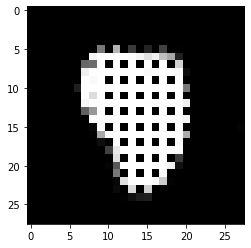

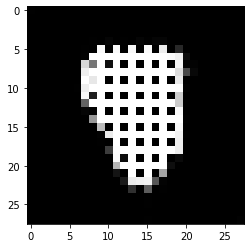

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


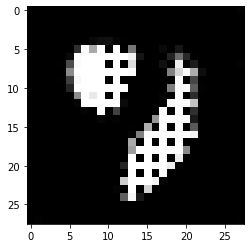

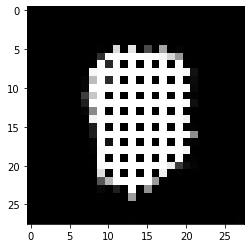

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


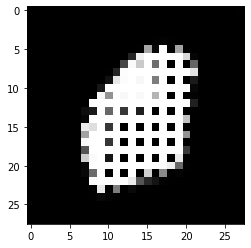

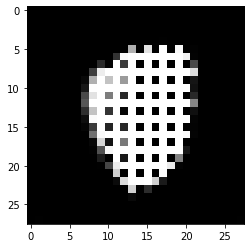

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


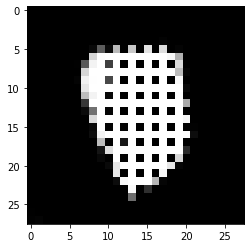

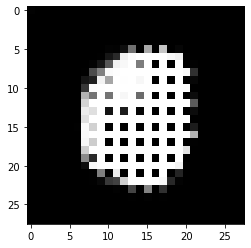

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


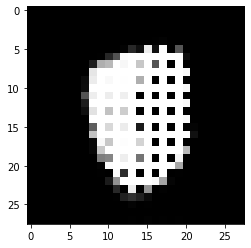

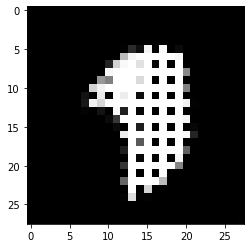

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


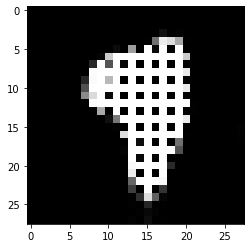

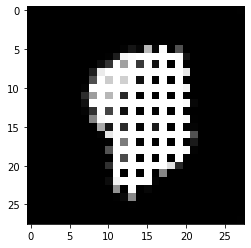

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


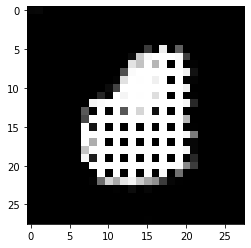

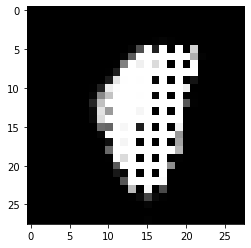

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


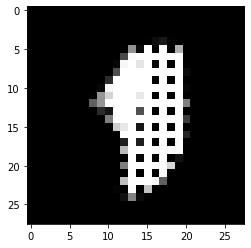

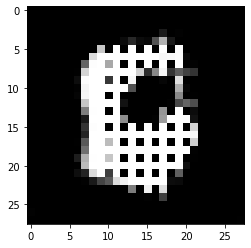

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


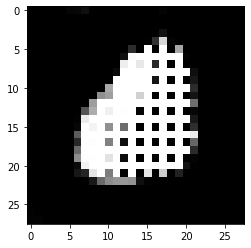

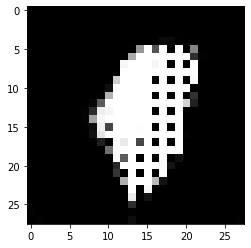

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


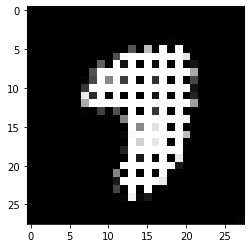

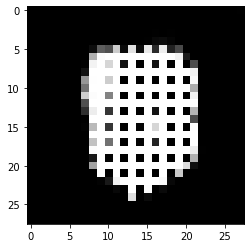

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


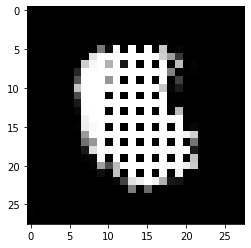

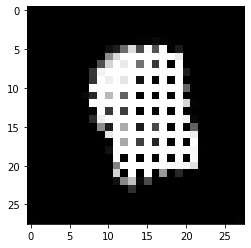

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


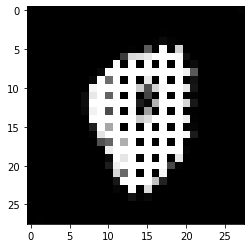

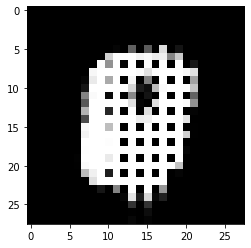

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


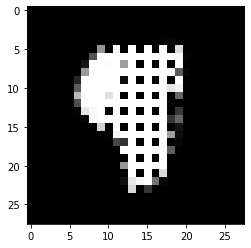

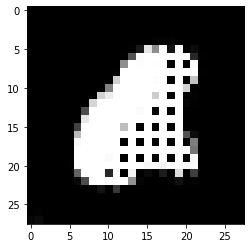

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


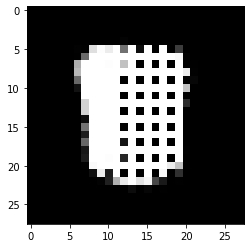

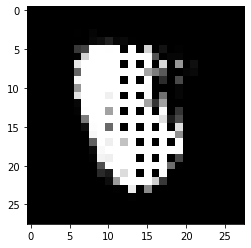

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


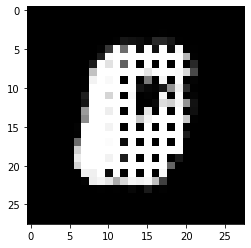

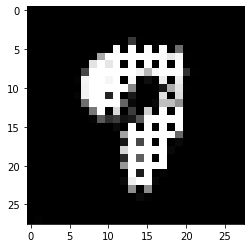

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


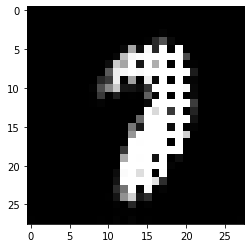

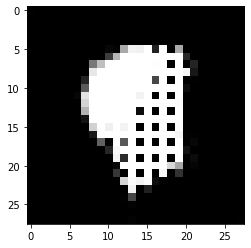

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


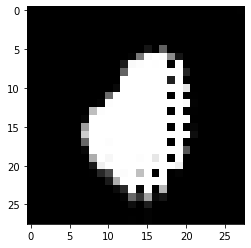

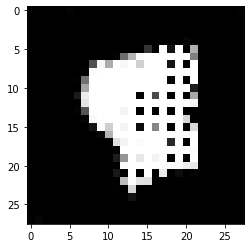

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


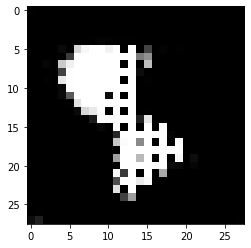

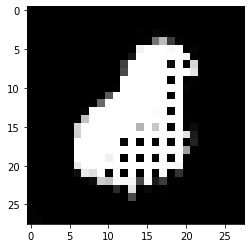

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


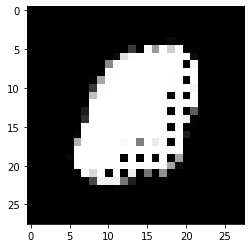

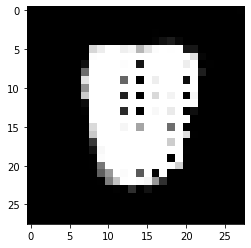

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


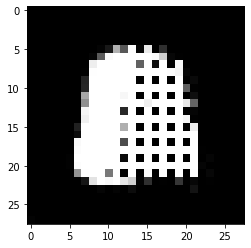

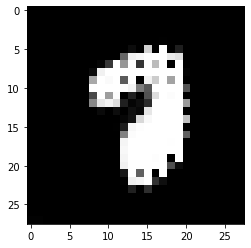

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


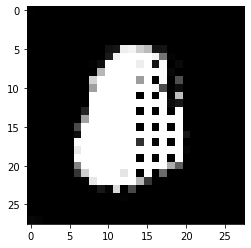

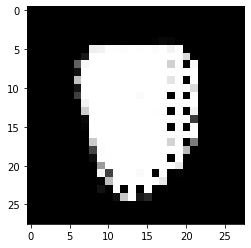

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


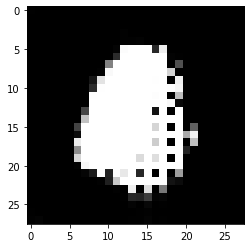

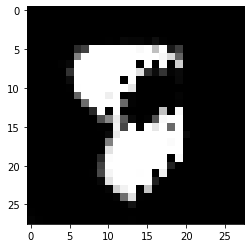

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


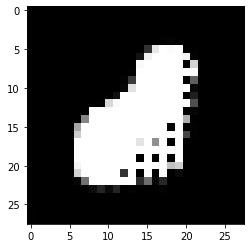

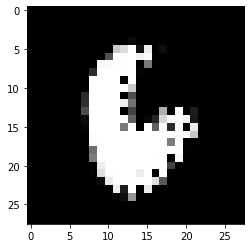

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


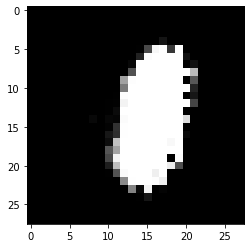

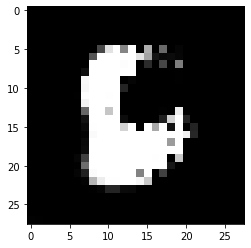

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


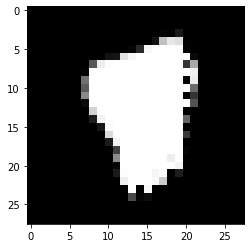

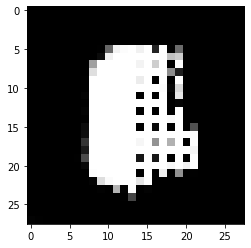

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


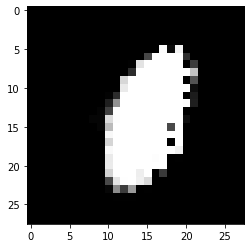

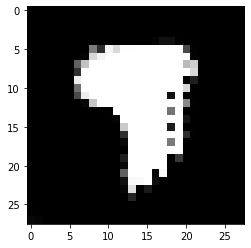

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


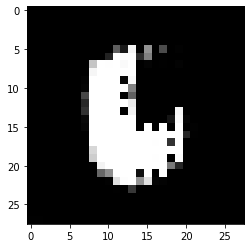

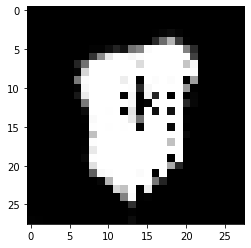

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


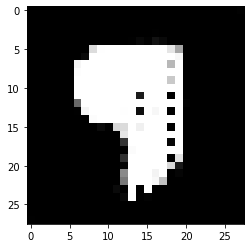

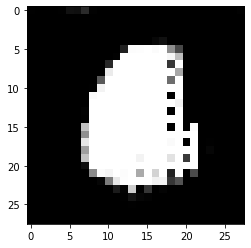

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


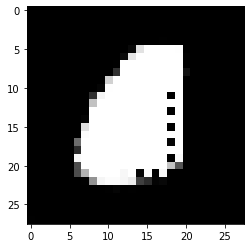

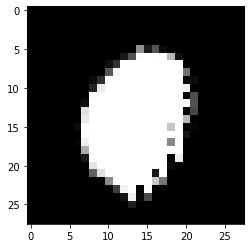

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


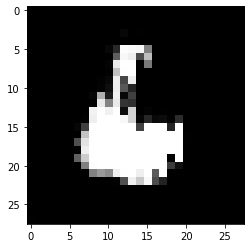

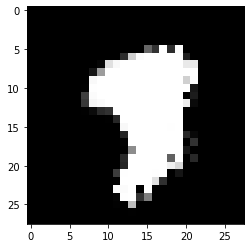

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


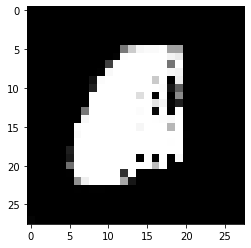

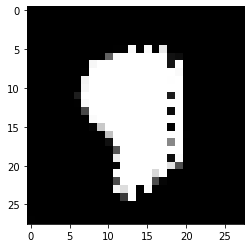

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


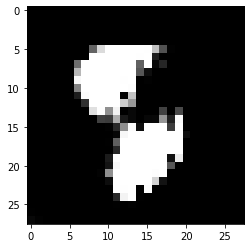

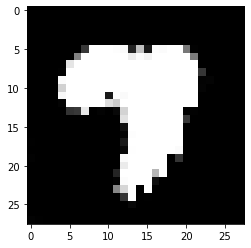

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


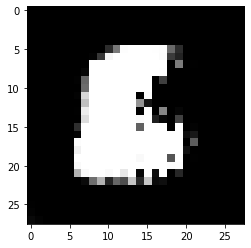

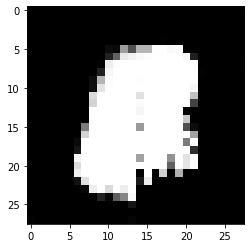

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


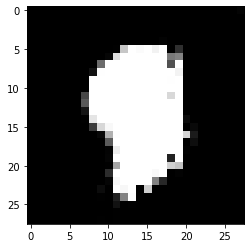

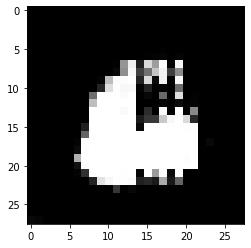

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


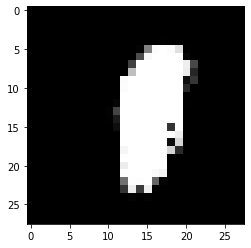

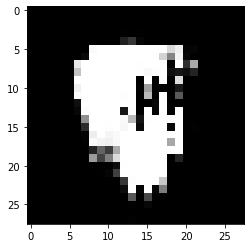

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


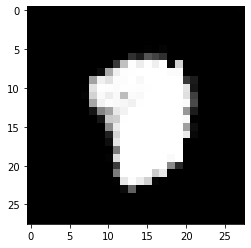

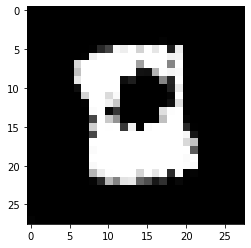

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


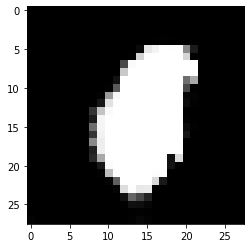

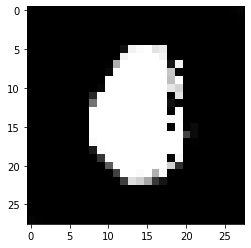

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


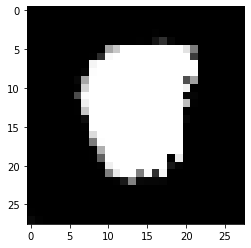

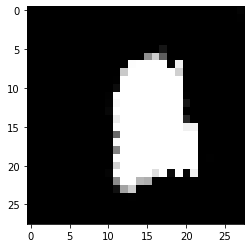

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


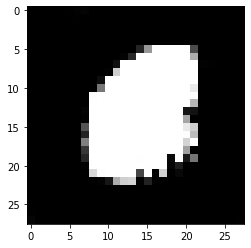

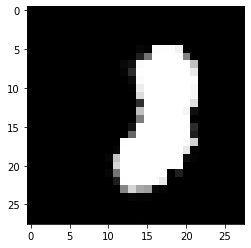

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


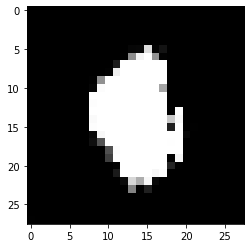

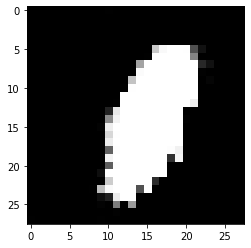

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


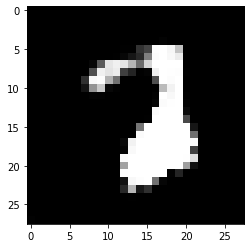

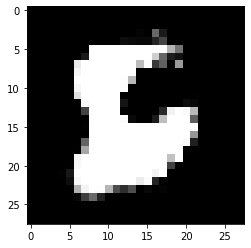

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


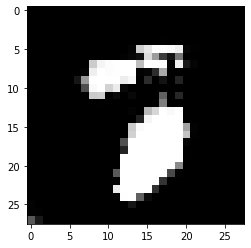

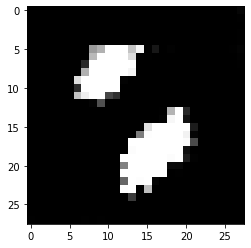

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


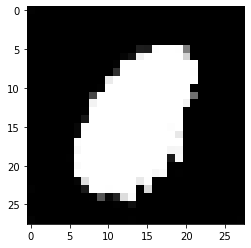

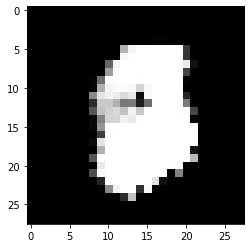

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


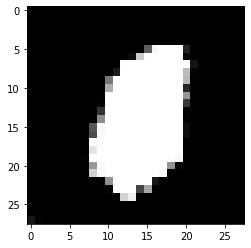

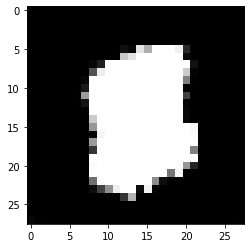

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


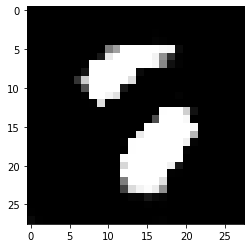

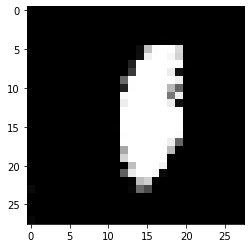

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


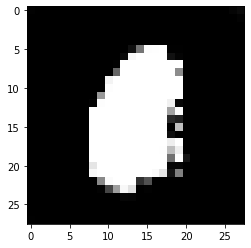

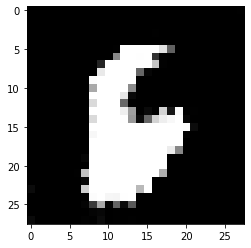

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


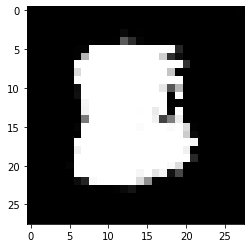

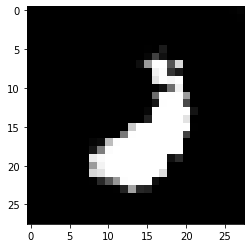

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


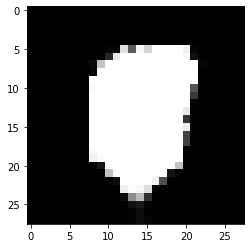

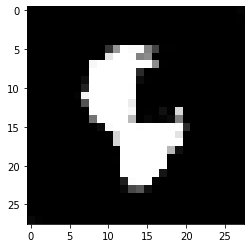

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


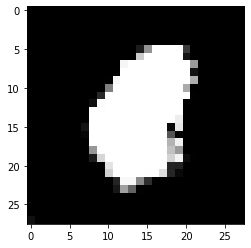

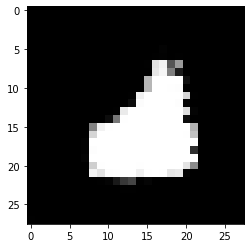

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


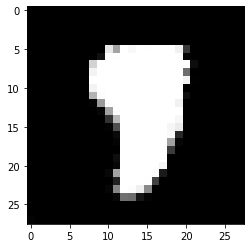

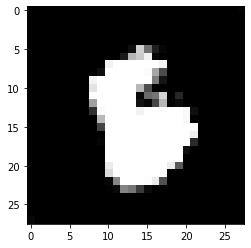

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


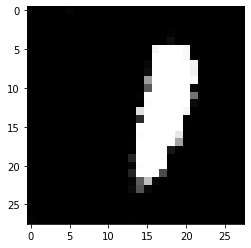

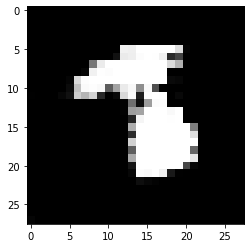

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


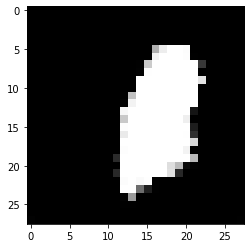

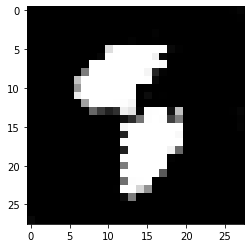

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


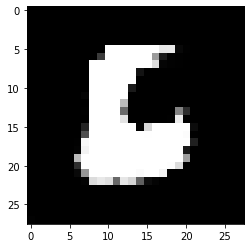

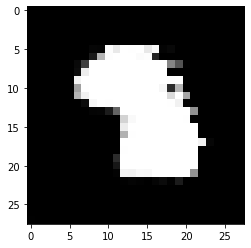

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


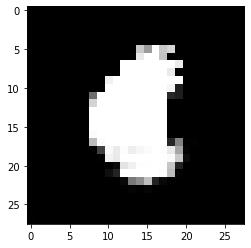

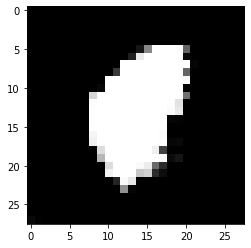

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


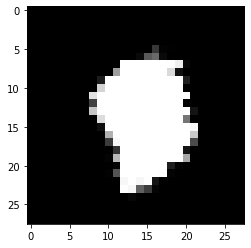

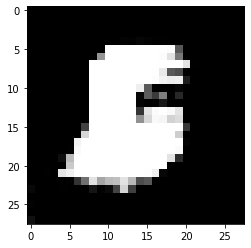

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


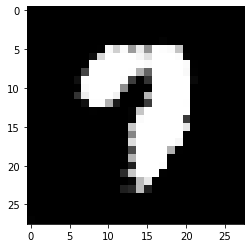

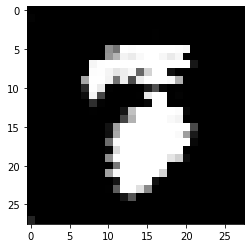

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


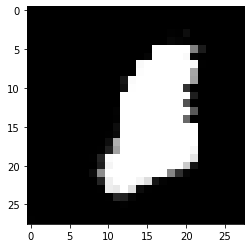

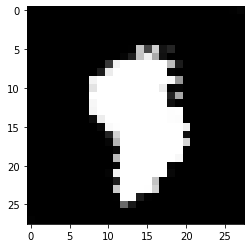

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


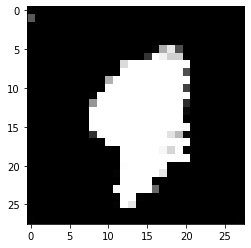

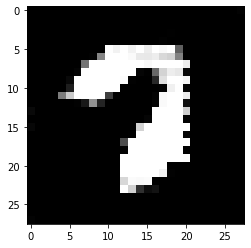

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


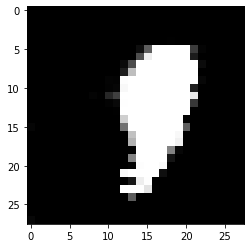

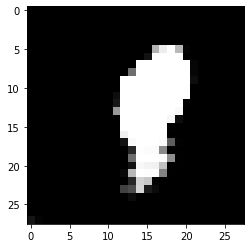

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


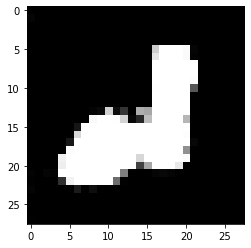

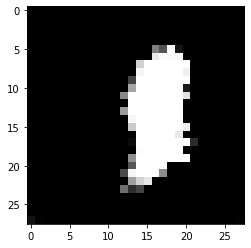

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


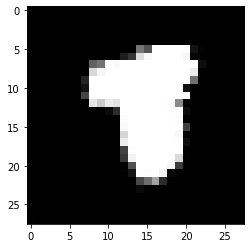

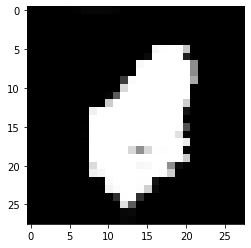

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


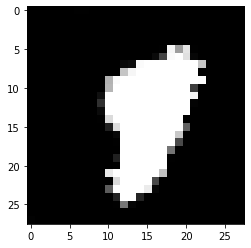

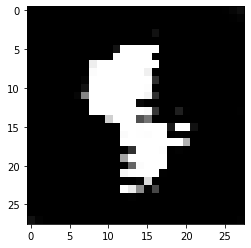

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


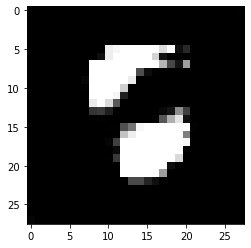

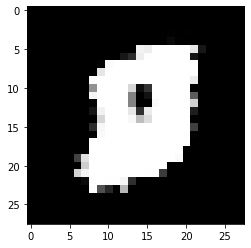

train discriminator:
True
True
4/4 [==============================] - 0s 6ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


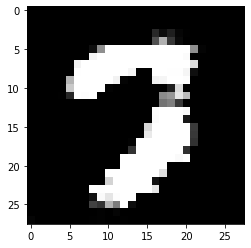

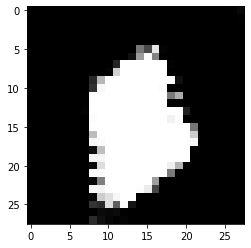

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


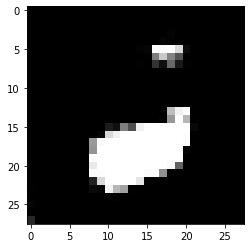

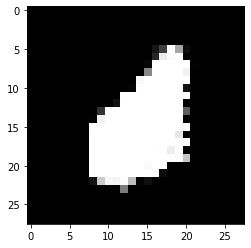

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


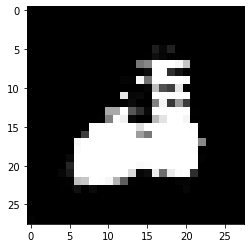

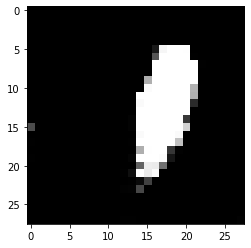

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


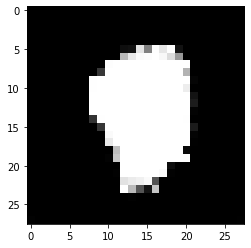

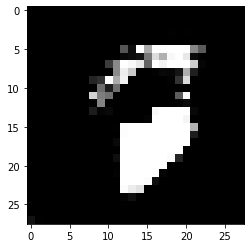

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


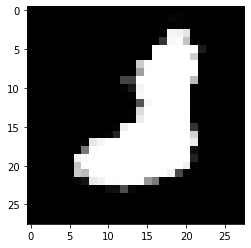

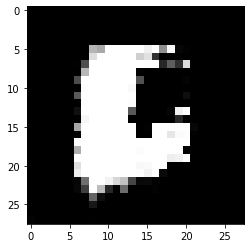

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


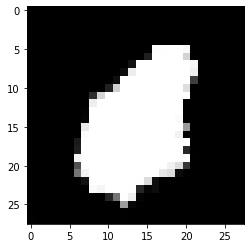

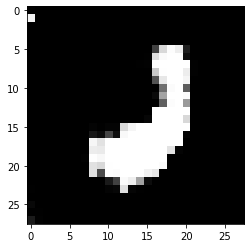

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


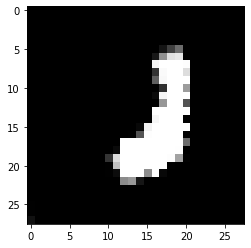

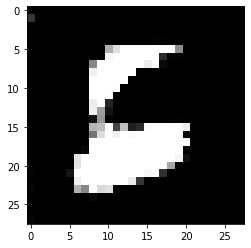

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


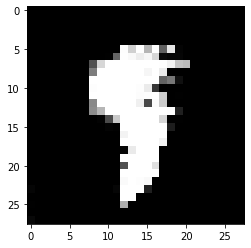

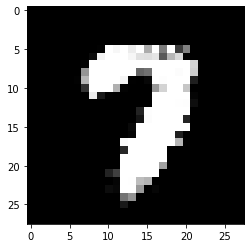

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


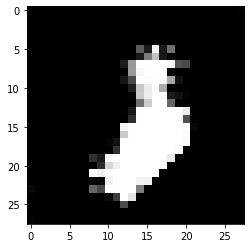

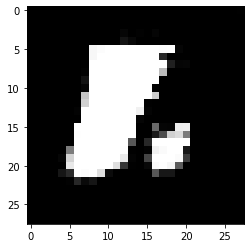

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


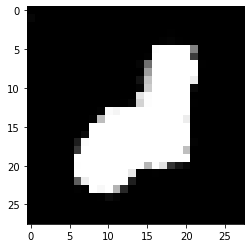

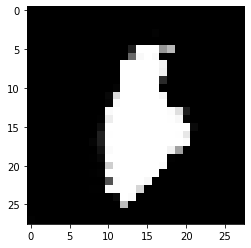

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


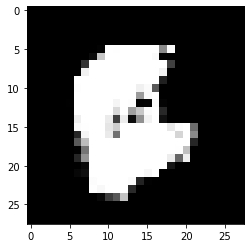

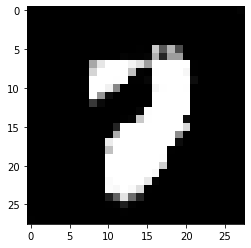

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


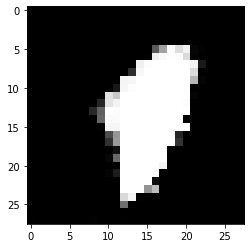

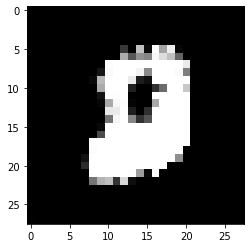

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


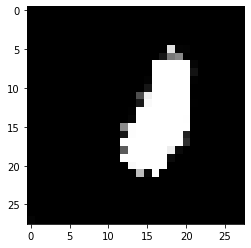

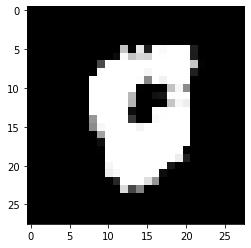

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


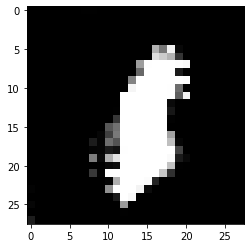

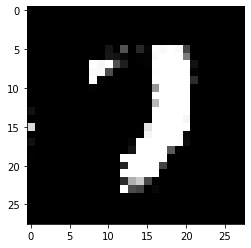

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


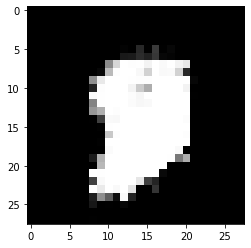

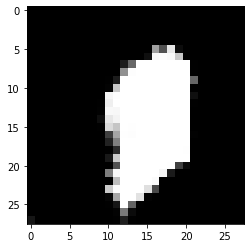

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


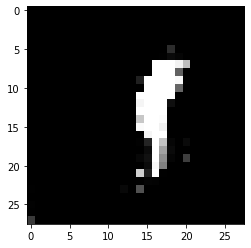

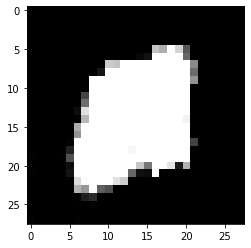

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


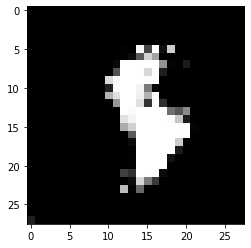

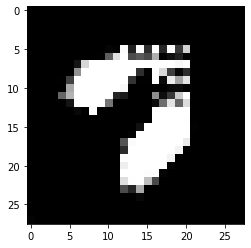

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


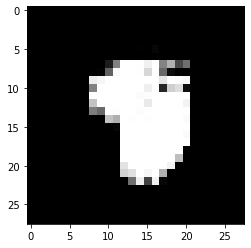

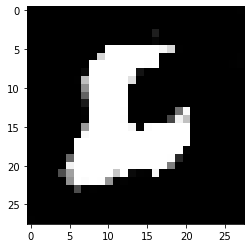

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


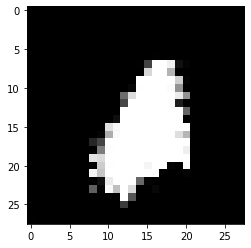

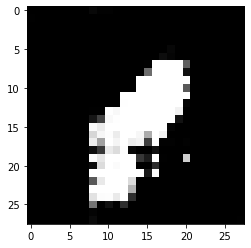

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


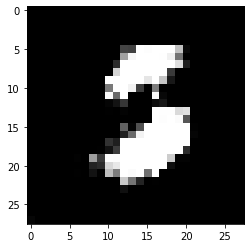

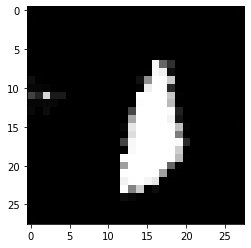

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


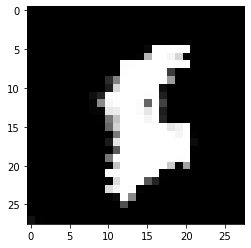

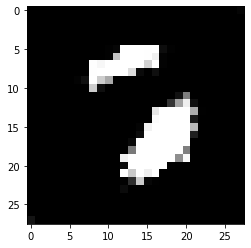

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


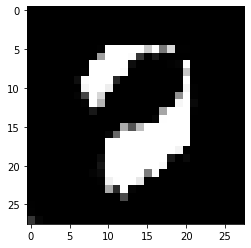

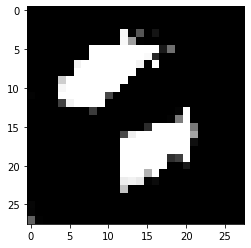

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


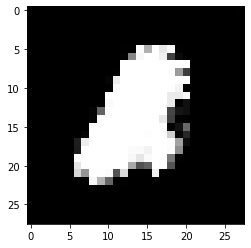

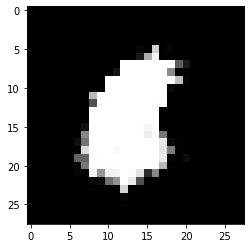

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


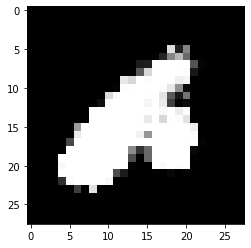

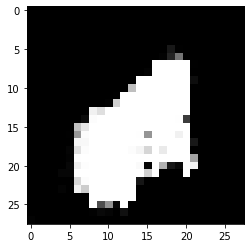

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


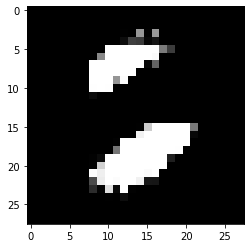

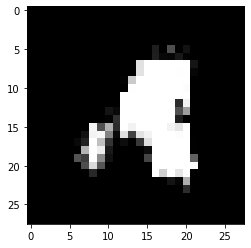

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


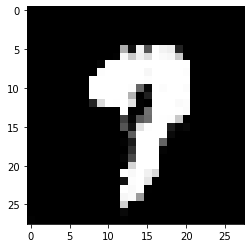

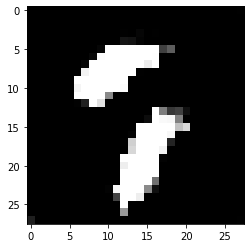

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 29ms/step


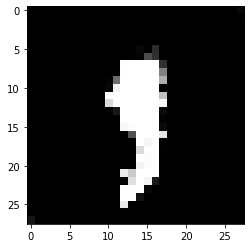

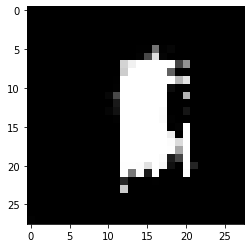

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


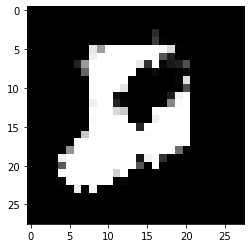

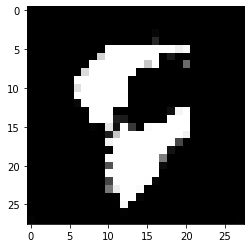

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


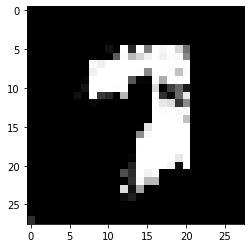

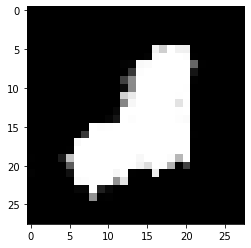

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


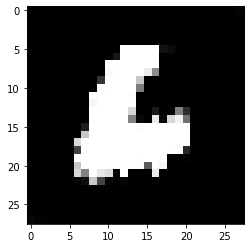

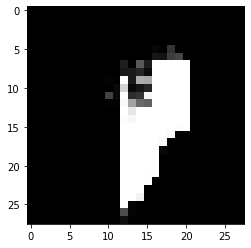

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


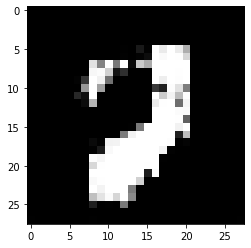

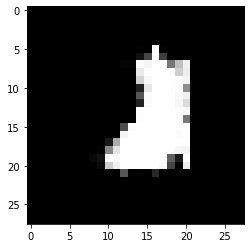

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


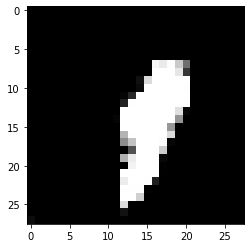

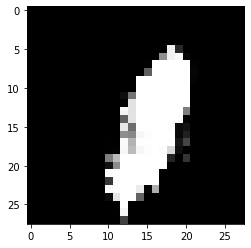

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


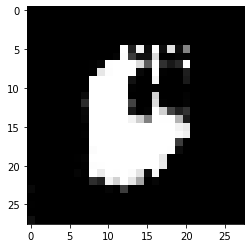

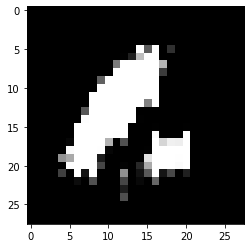

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


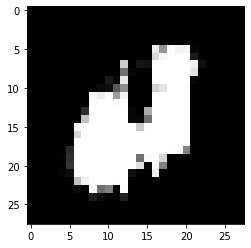

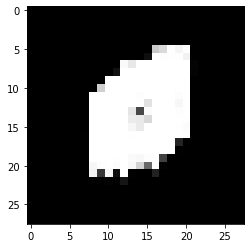

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


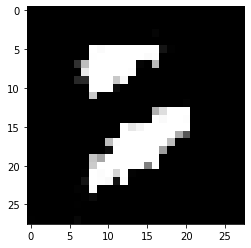

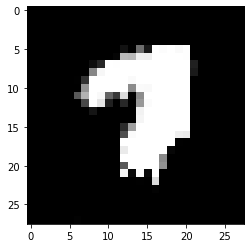

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


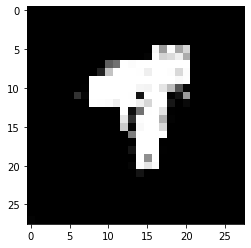

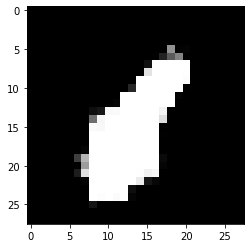

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


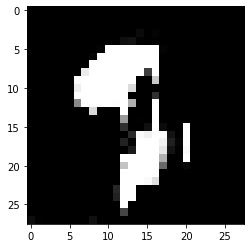

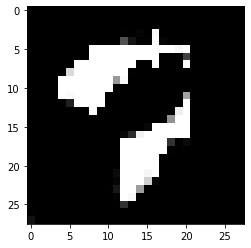

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


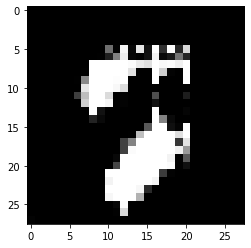

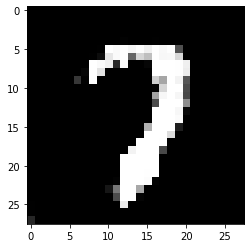

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


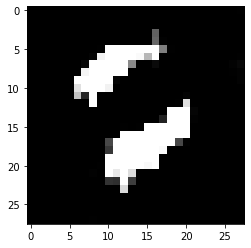

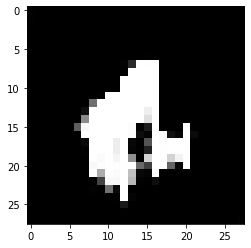

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


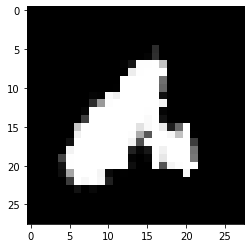

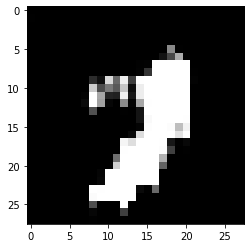

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


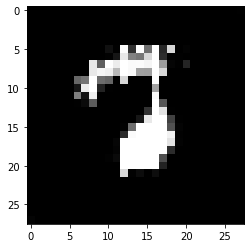

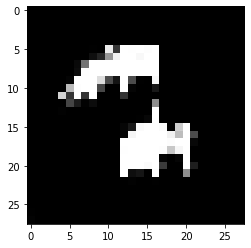

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


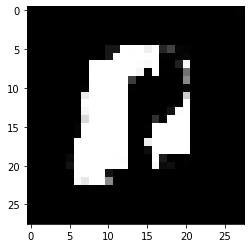

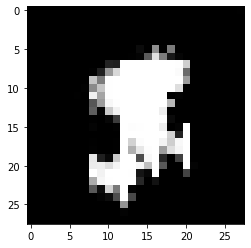

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


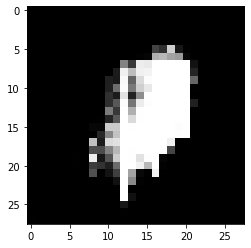

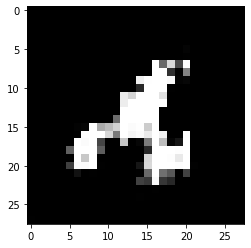

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


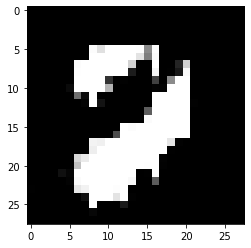

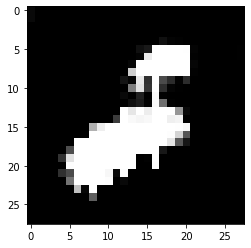

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


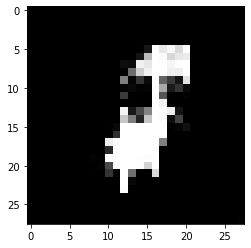

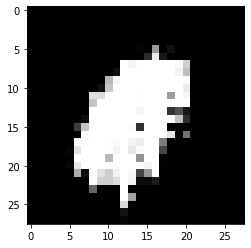

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


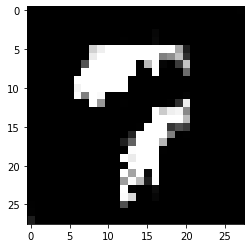

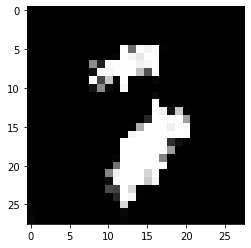

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


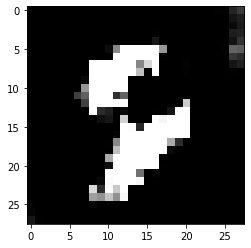

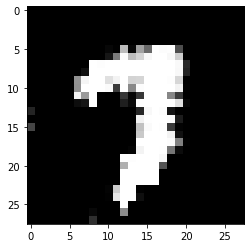

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


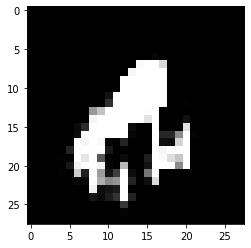

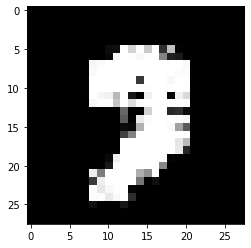

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


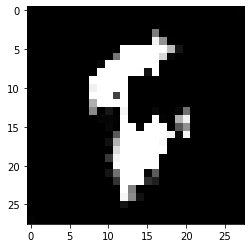

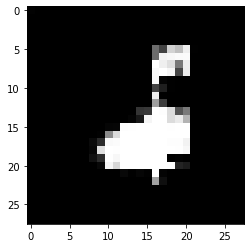

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


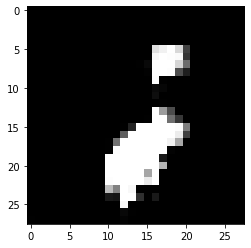

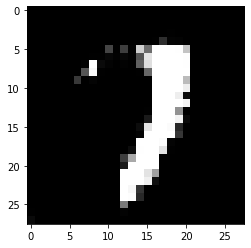

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


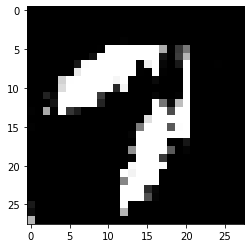

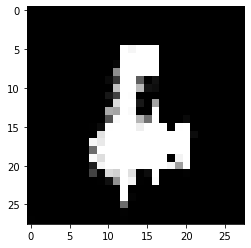

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


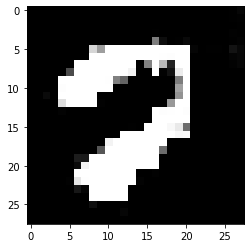

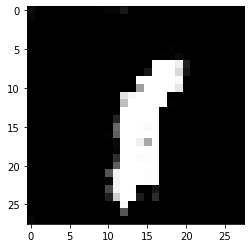

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


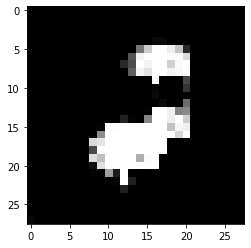

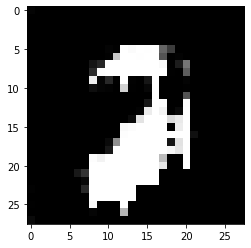

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


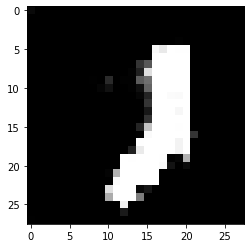

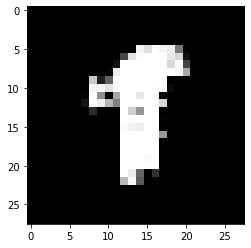

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


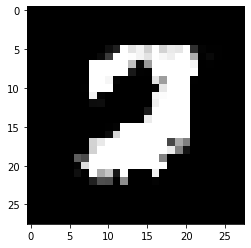

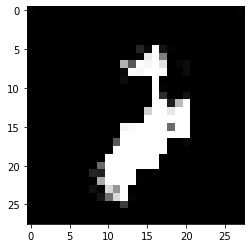

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


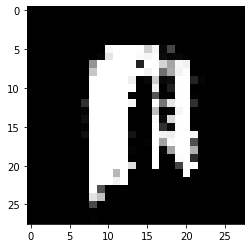

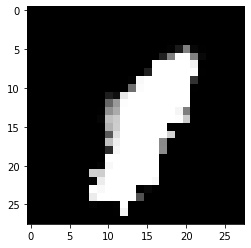

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


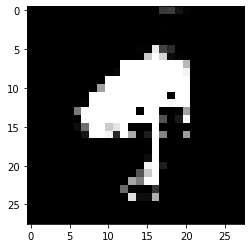

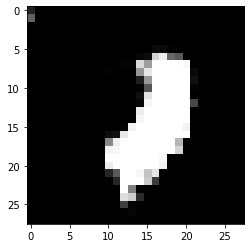

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


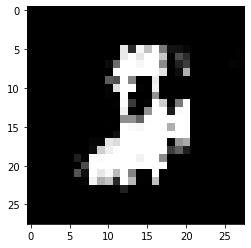

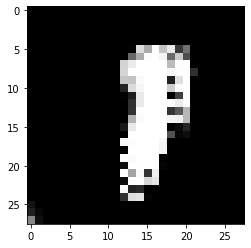

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


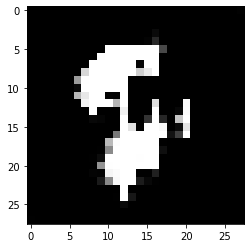

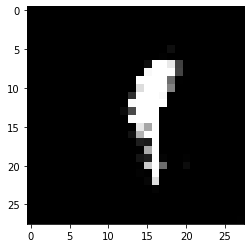

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


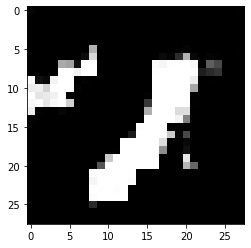

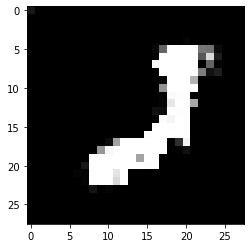

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


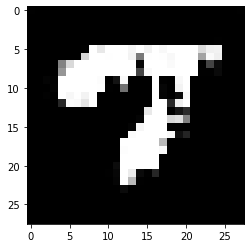

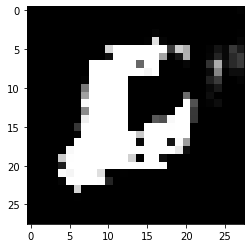

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


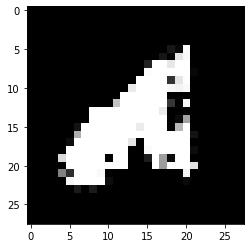

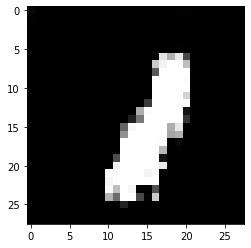

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


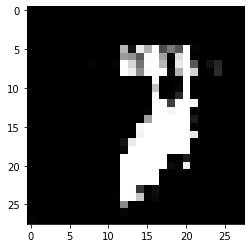

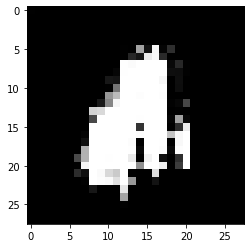

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


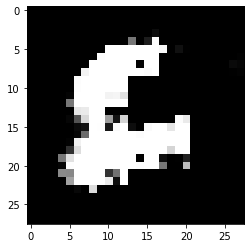

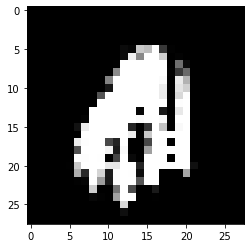

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


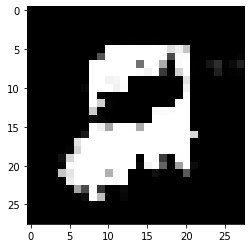

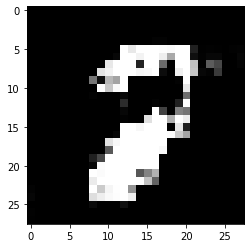

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


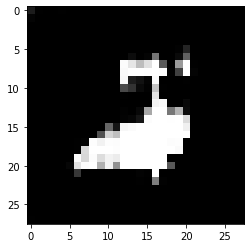

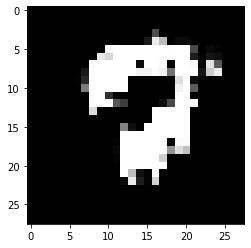

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


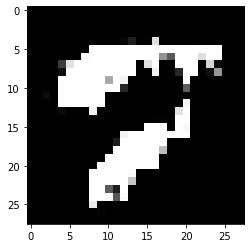

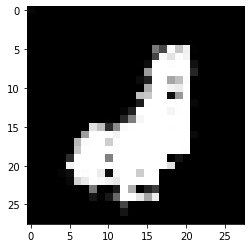

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


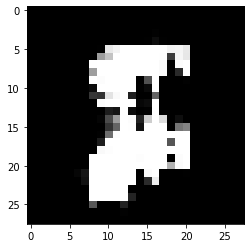

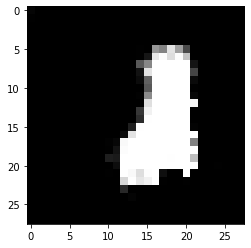

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


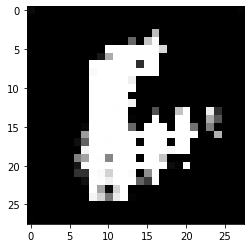

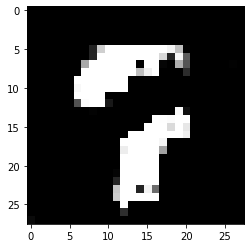

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


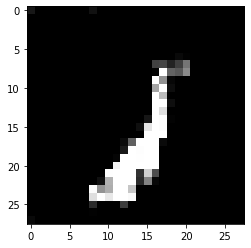

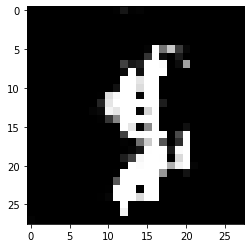

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


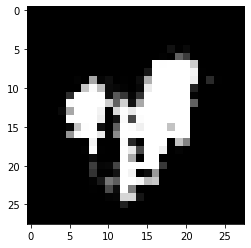

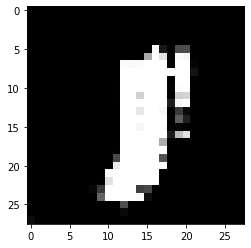

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


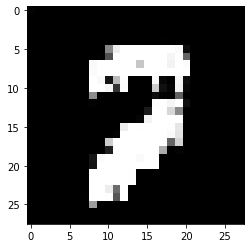

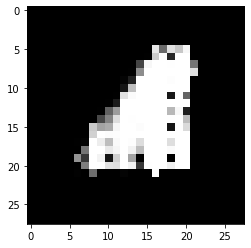

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


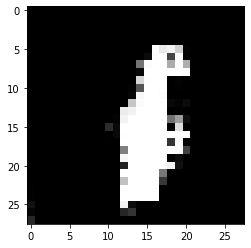

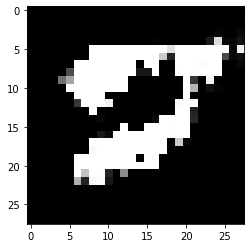

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


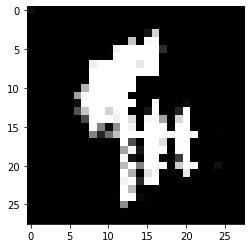

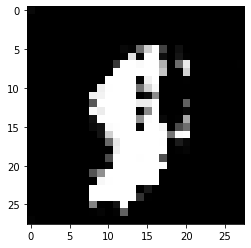

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


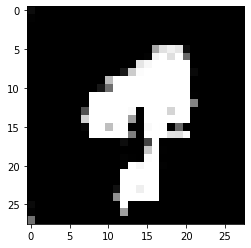

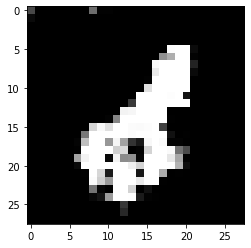

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


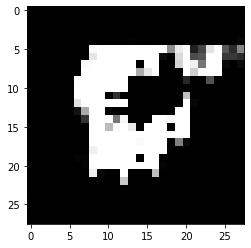

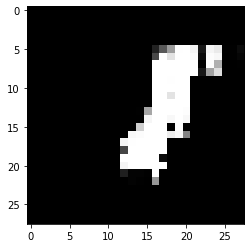

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


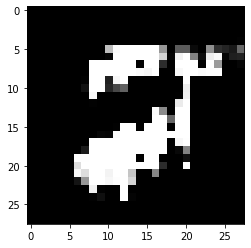

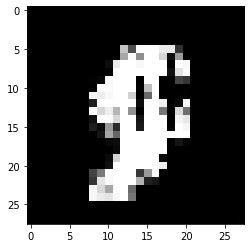

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


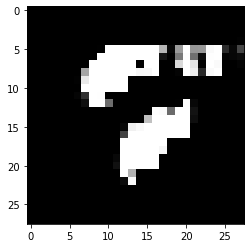

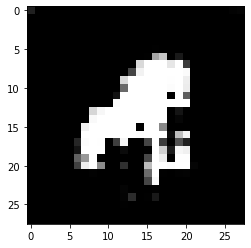

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


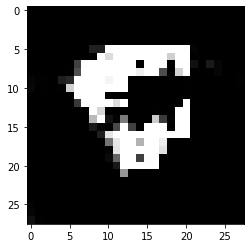

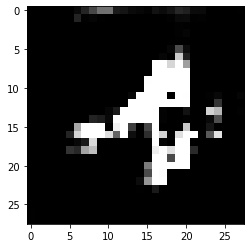

train discriminator:
True
True
4/4 [==============================] - 0s 6ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


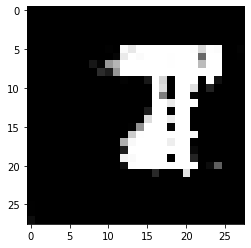

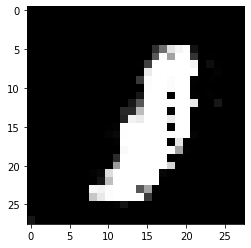

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


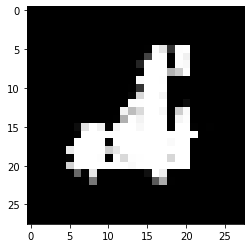

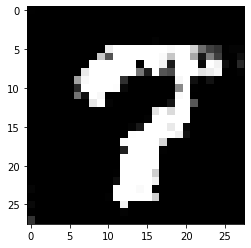

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


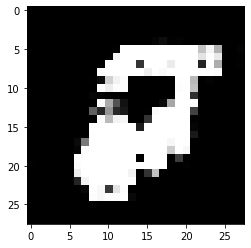

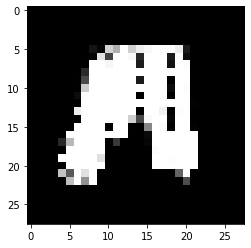

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


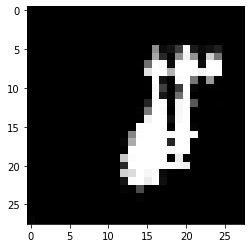

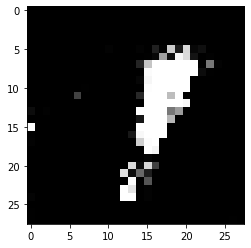

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


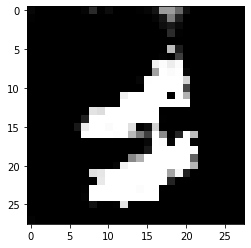

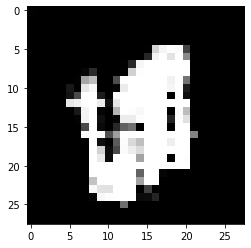

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


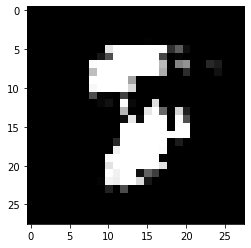

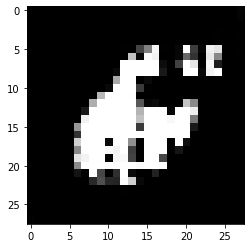

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


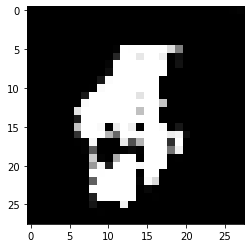

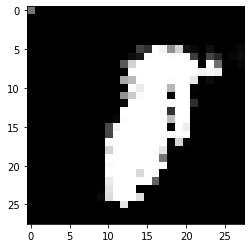

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


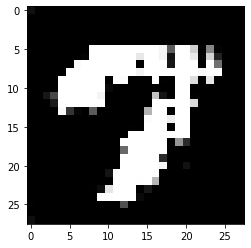

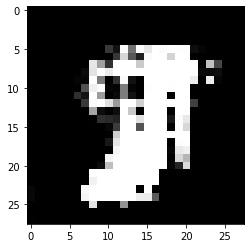

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


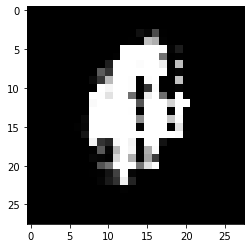

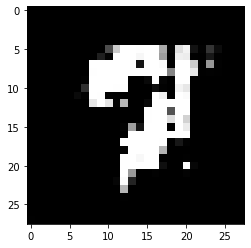

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


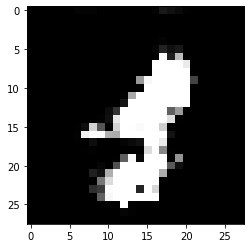

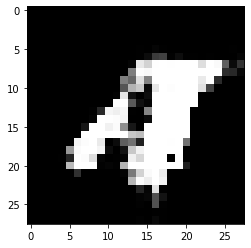

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


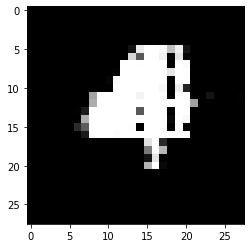

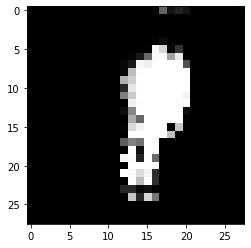

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


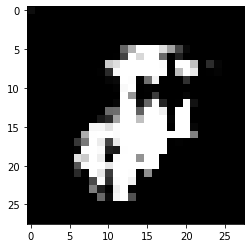

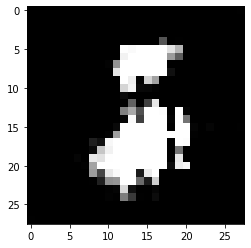

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


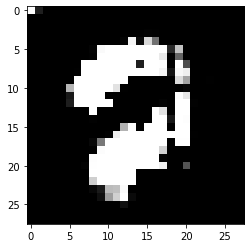

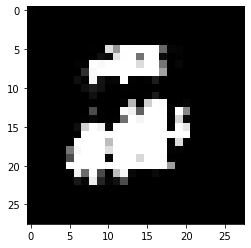

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


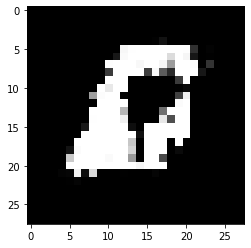

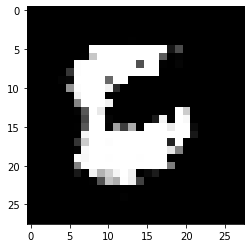

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


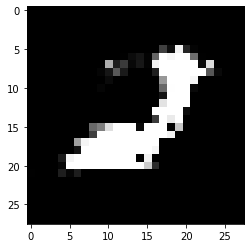

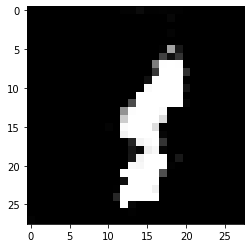

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


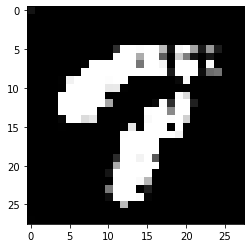

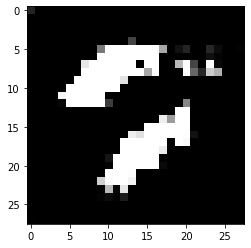

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


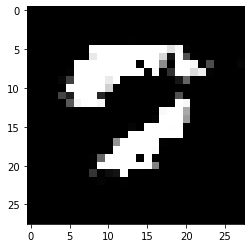

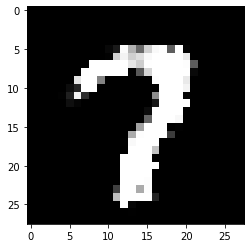

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


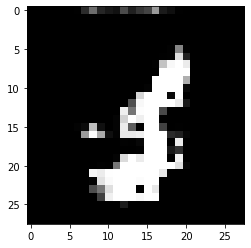

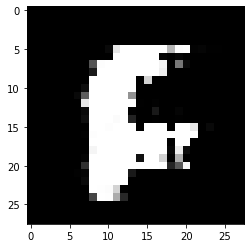

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


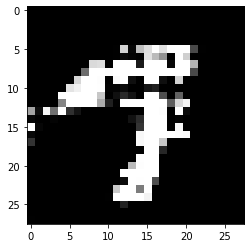

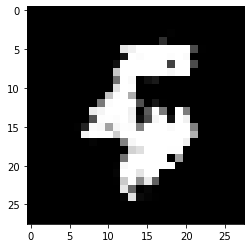

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


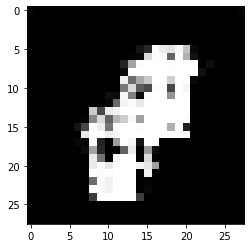

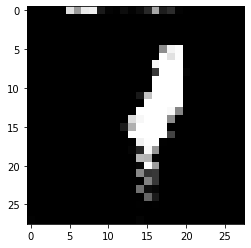

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


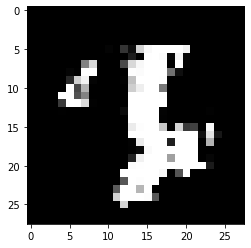

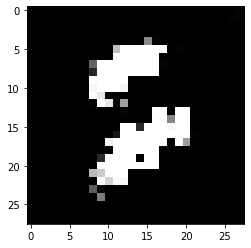

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


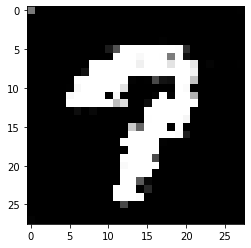

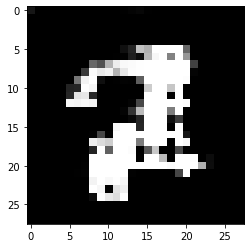

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


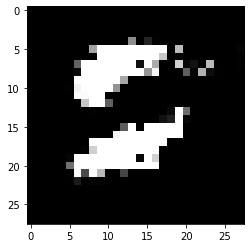

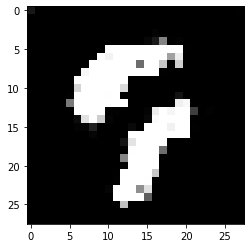

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 27ms/step


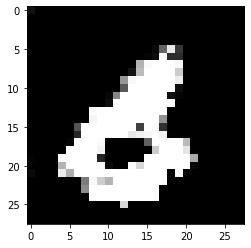

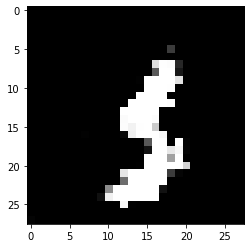

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


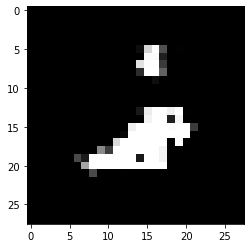

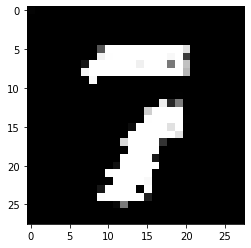

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 28ms/step


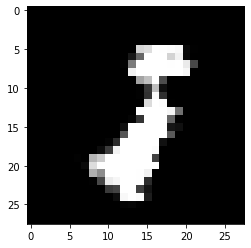

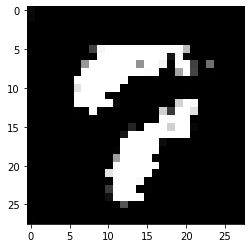

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


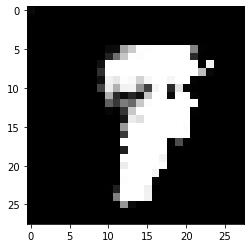

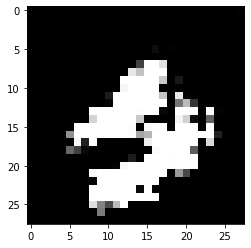

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


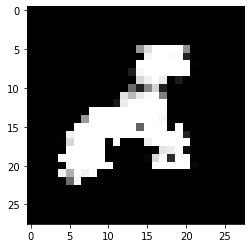

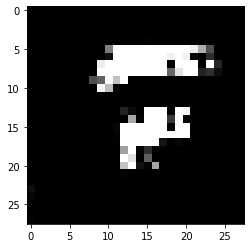

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


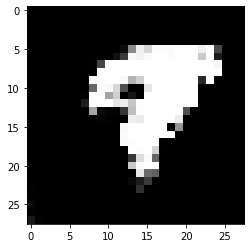

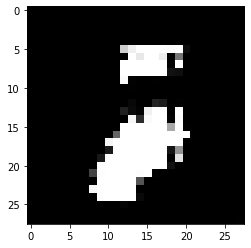

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


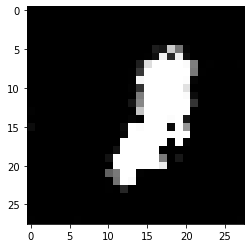

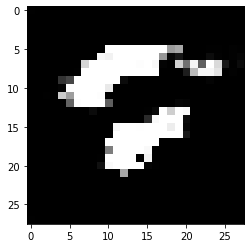

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


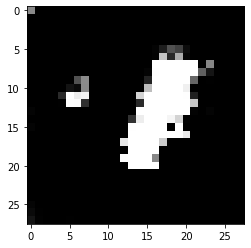

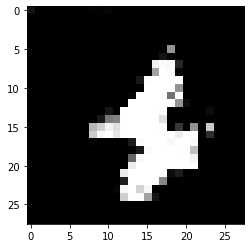

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


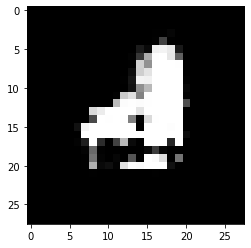

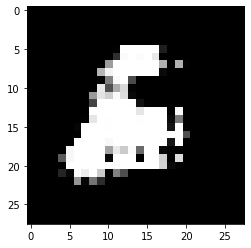

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


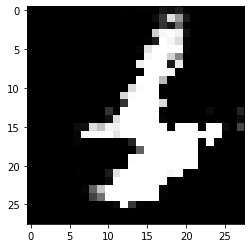

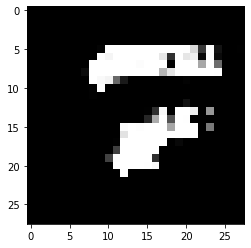

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


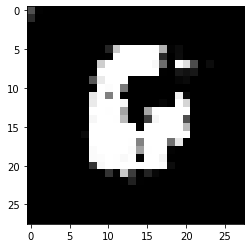

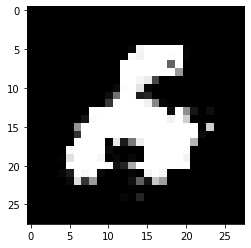

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


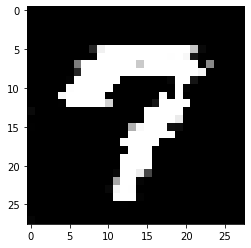

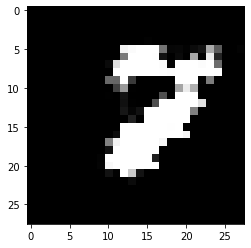

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


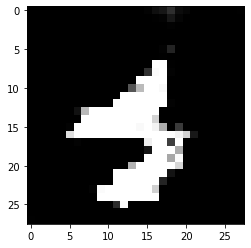

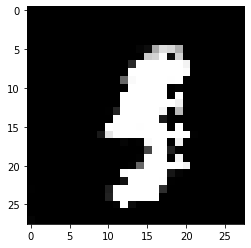

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


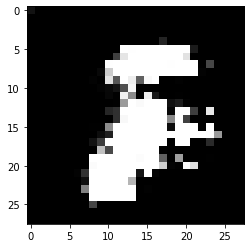

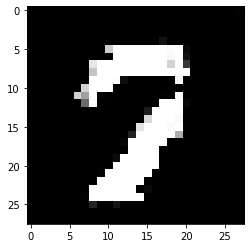

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


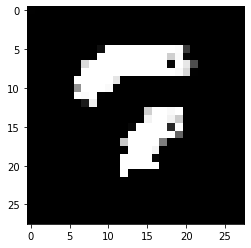

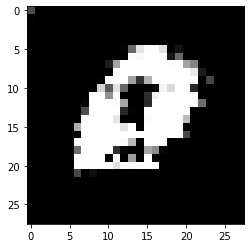

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


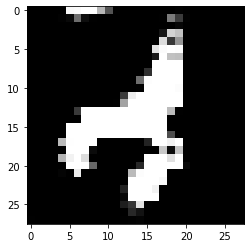

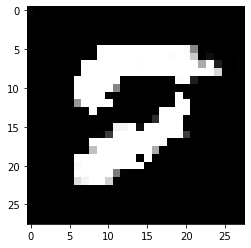

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


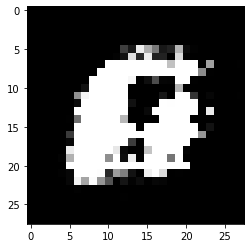

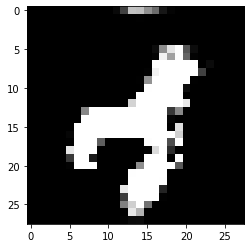

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


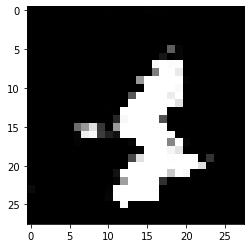

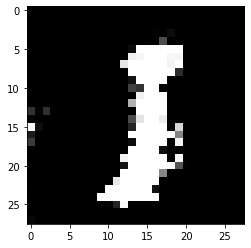

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


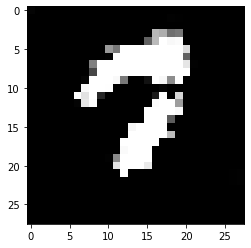

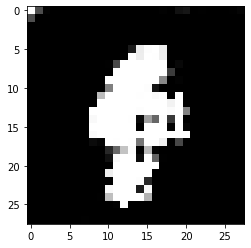

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


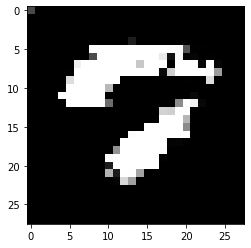

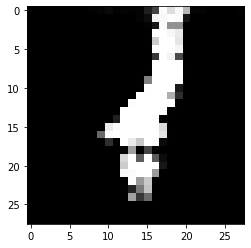

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


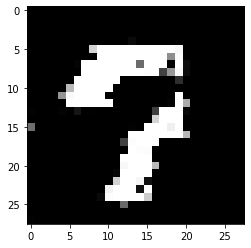

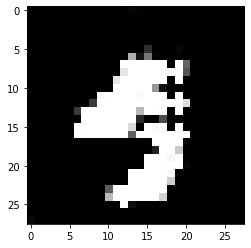

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


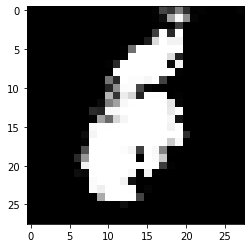

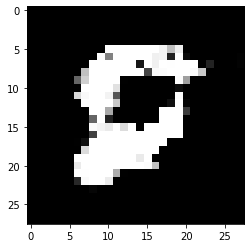

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


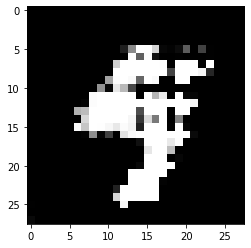

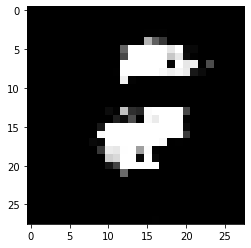

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


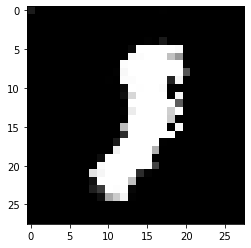

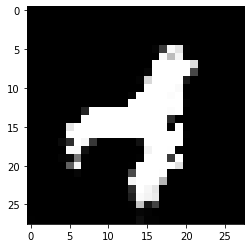

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


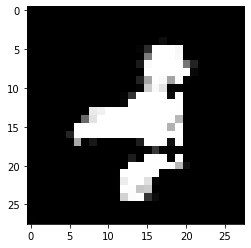

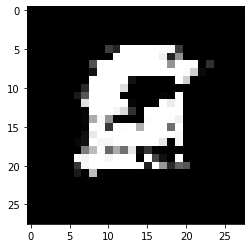

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 28ms/step


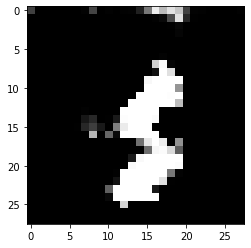

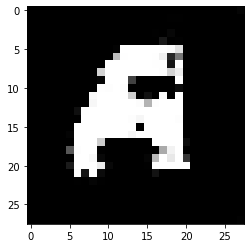

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


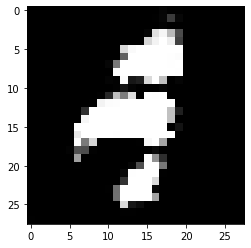

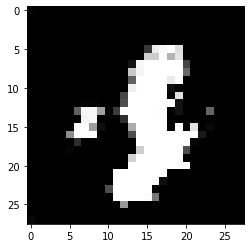

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


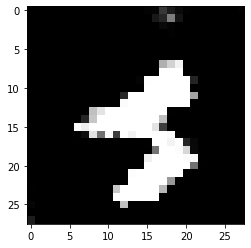

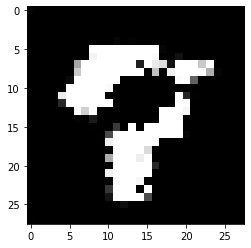

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


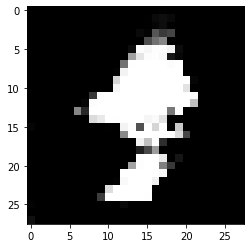

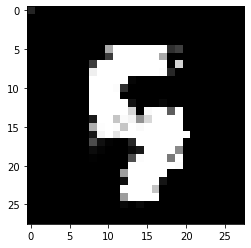

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


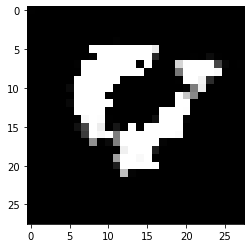

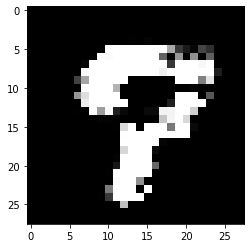

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


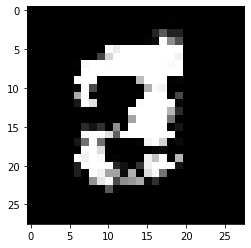

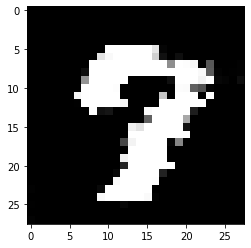

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


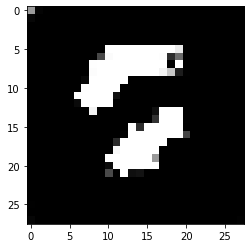

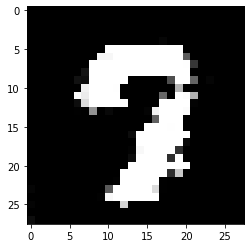

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


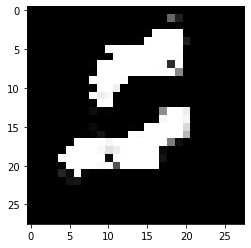

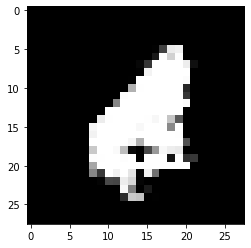

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


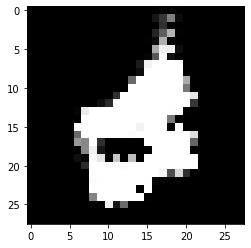

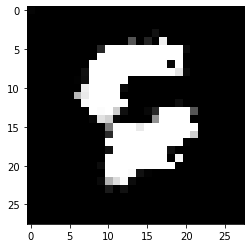

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


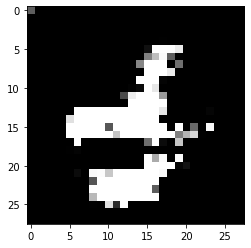

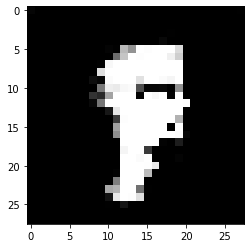

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


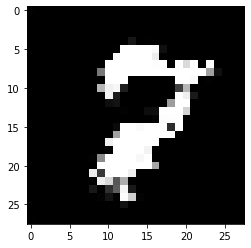

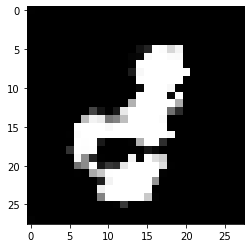

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


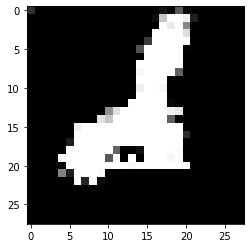

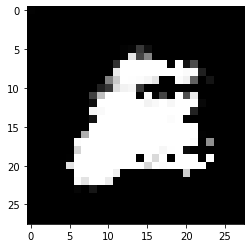

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


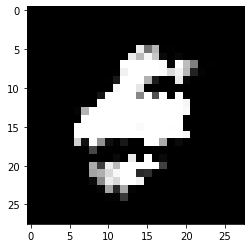

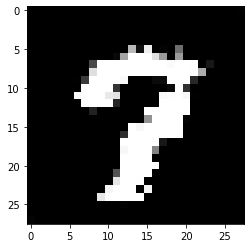

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


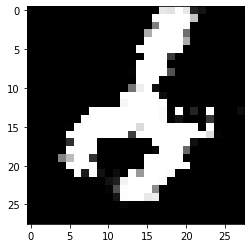

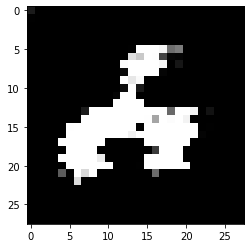

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


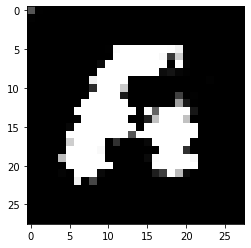

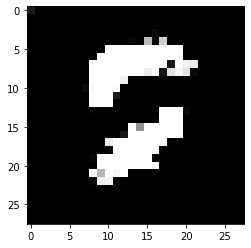

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


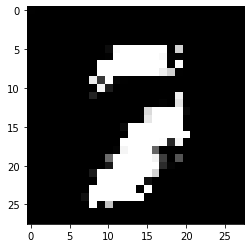

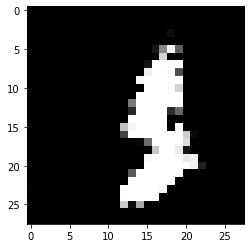

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


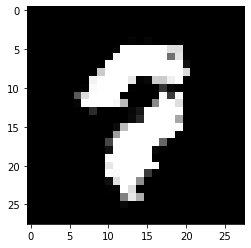

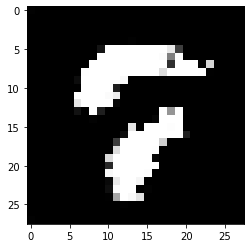

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


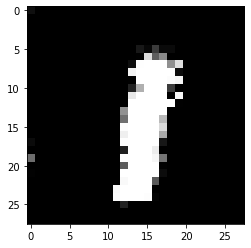

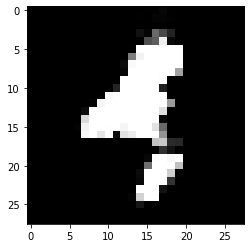

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


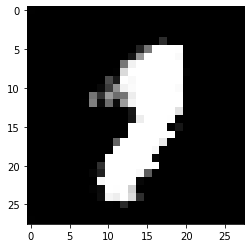

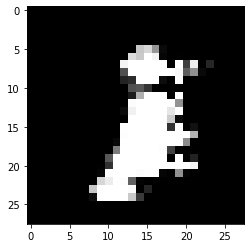

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


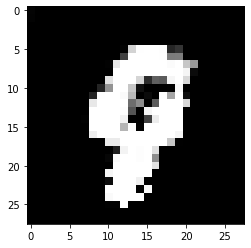

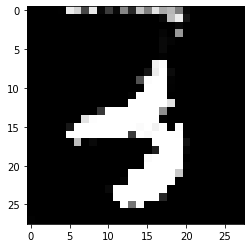

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


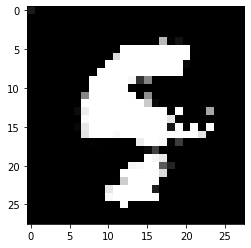

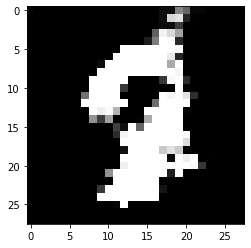

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


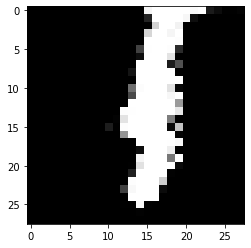

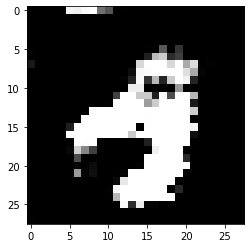

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


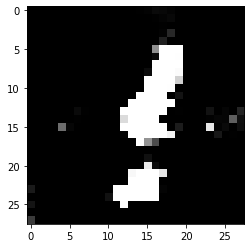

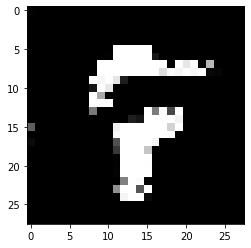

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


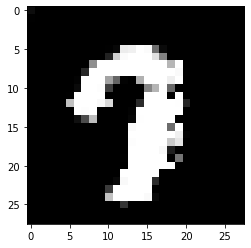

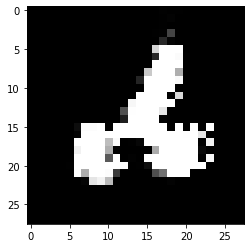

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


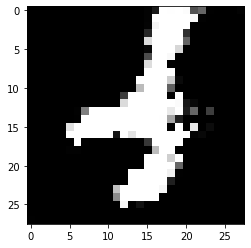

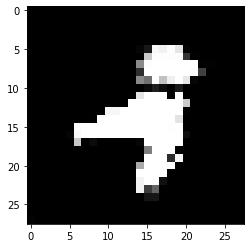

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


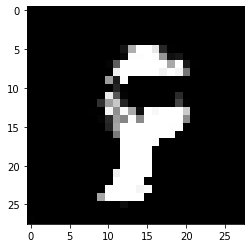

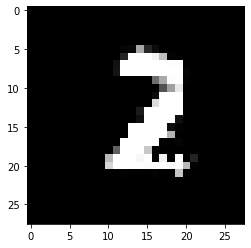

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


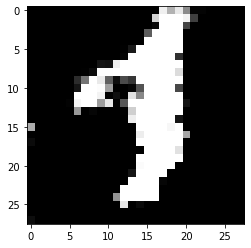

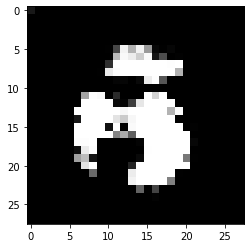

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


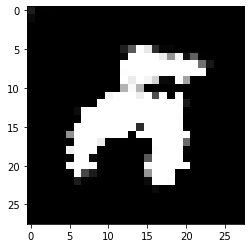

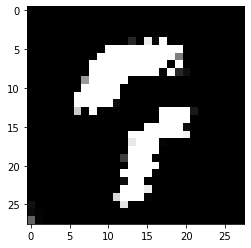

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


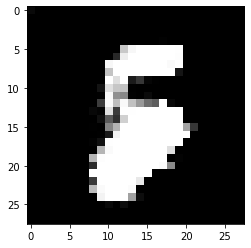

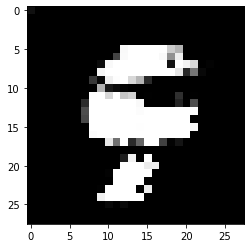

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


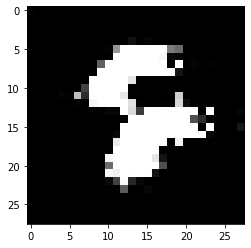

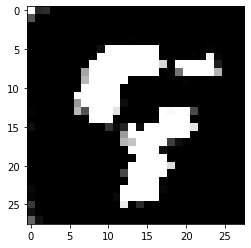

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


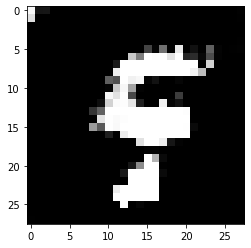

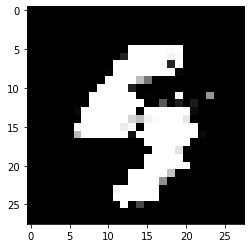

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


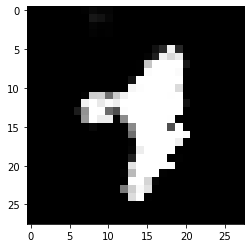

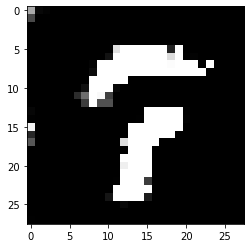

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 28ms/step


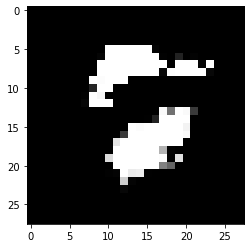

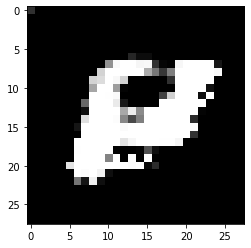

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


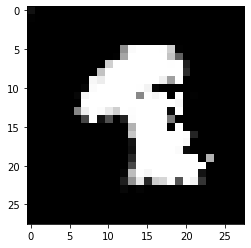

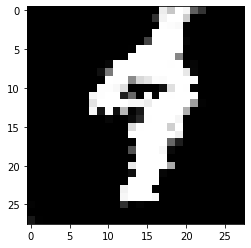

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


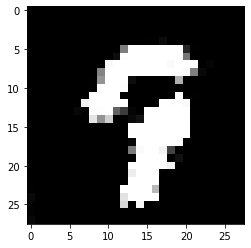

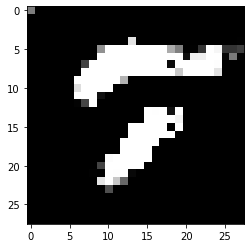

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


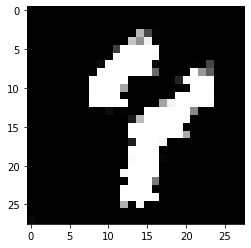

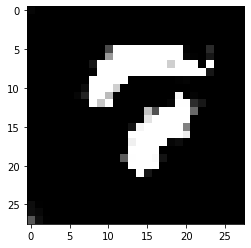

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


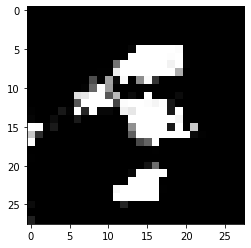

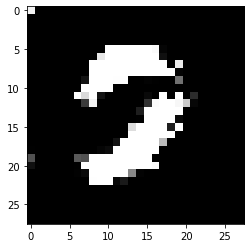

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


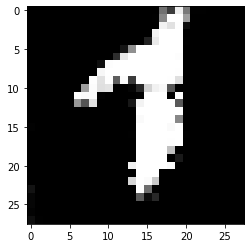

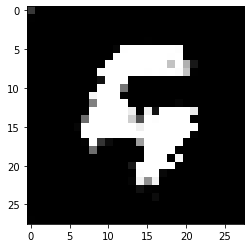

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


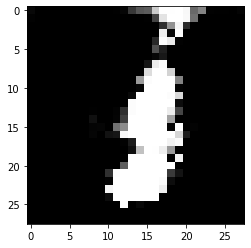

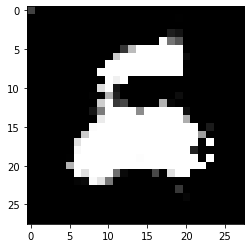

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


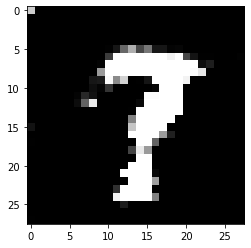

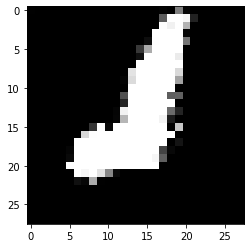

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


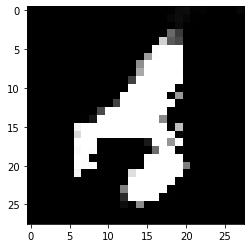

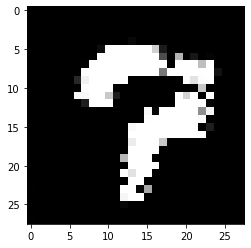

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


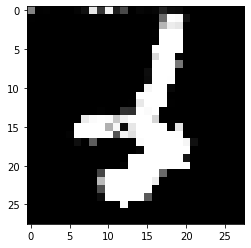

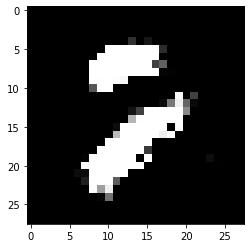

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


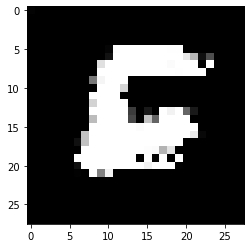

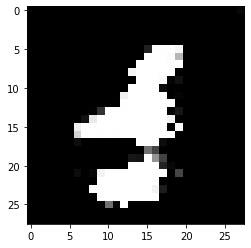

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


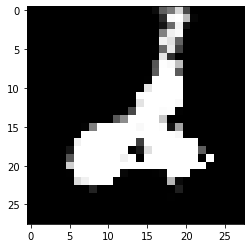

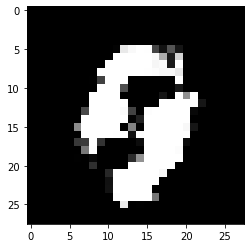

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


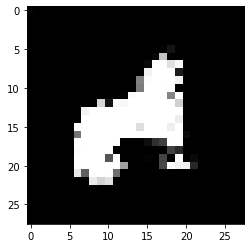

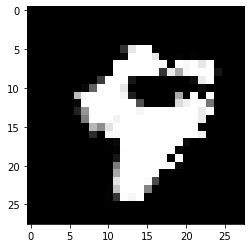

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


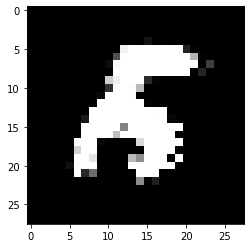

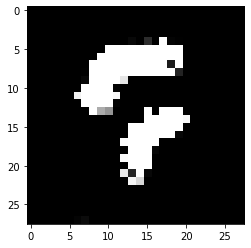

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


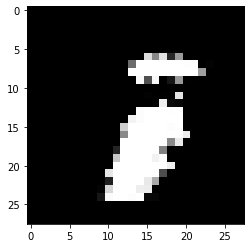

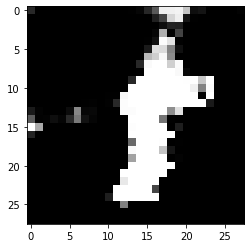

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


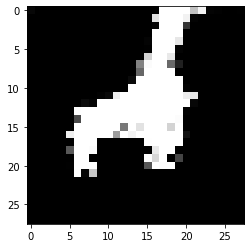

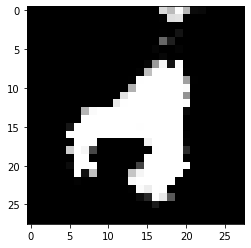

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


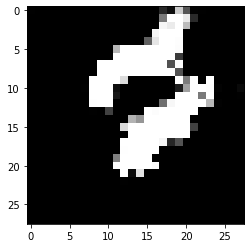

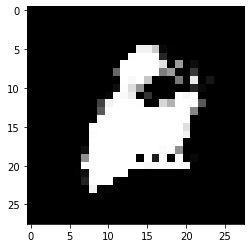

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


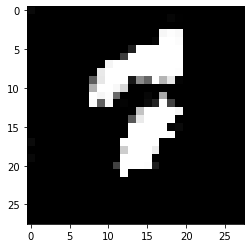

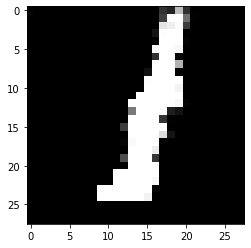

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


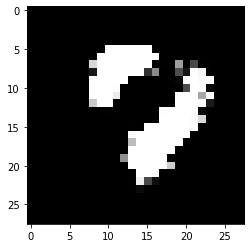

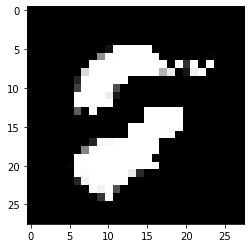

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


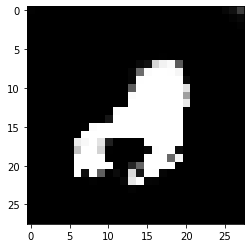

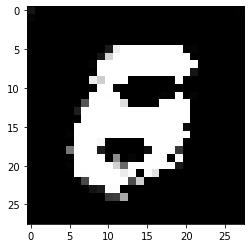

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


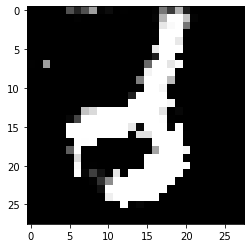

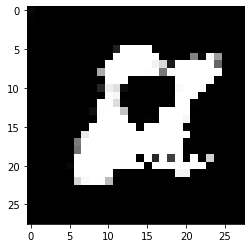

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


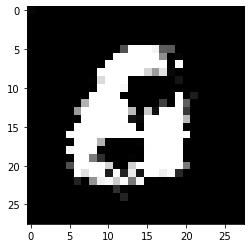

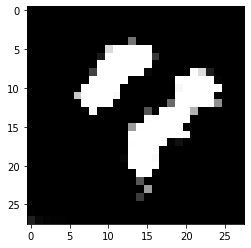

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


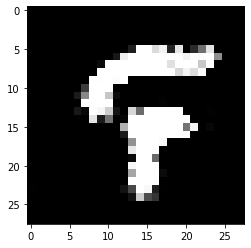

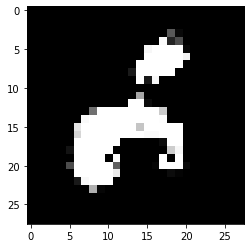

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


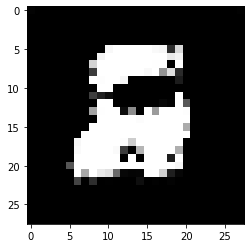

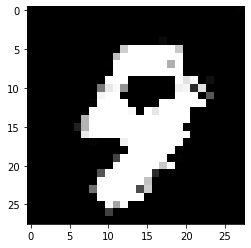

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


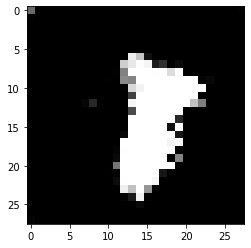

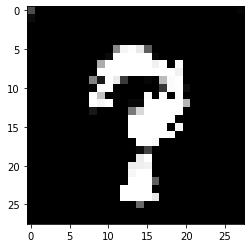

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


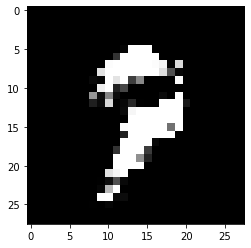

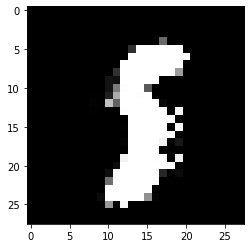

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


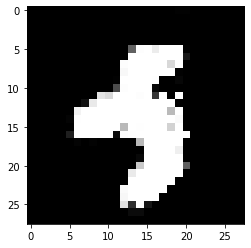

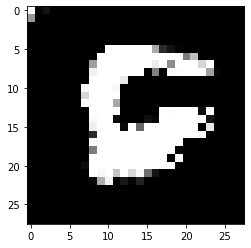

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


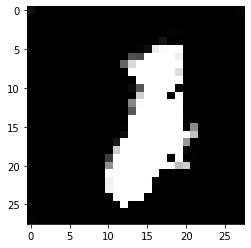

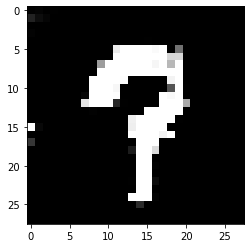

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


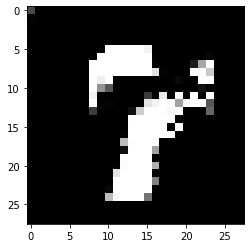

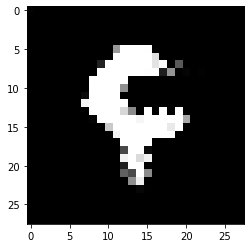

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


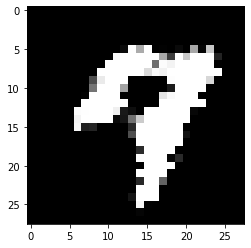

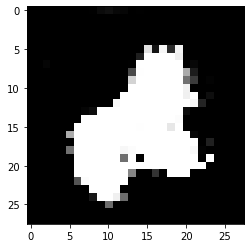

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


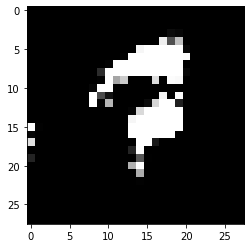

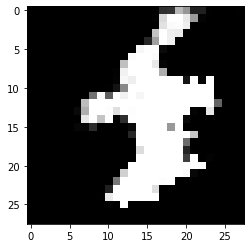

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


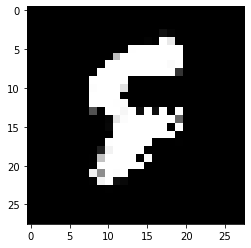

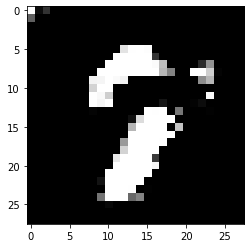

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


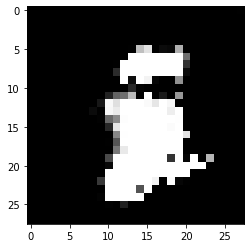

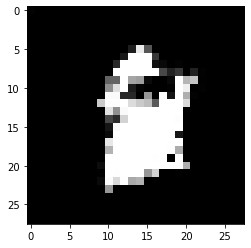

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


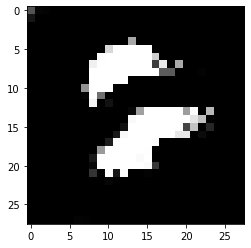

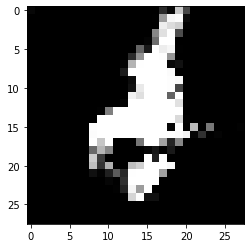

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


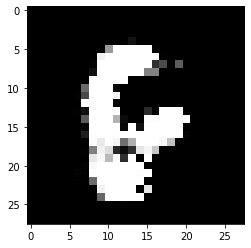

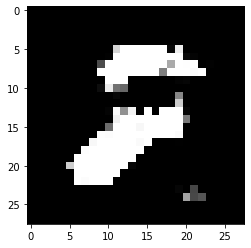

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


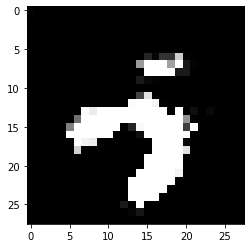

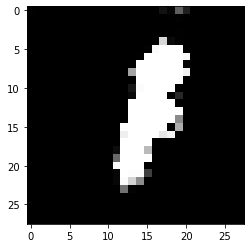

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


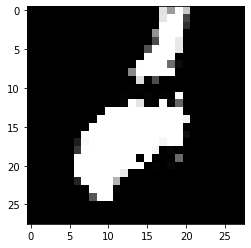

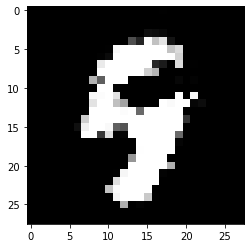

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


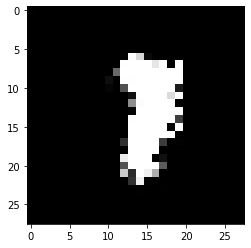

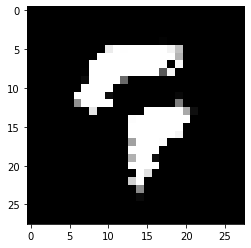

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


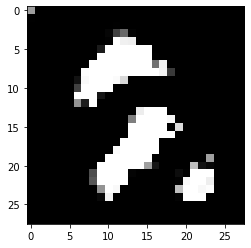

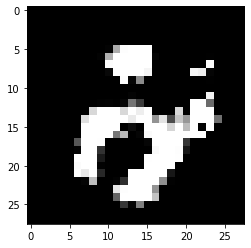

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


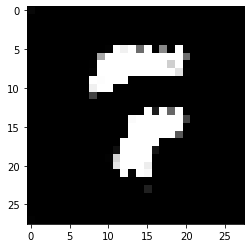

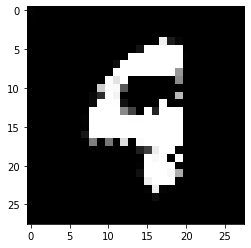

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


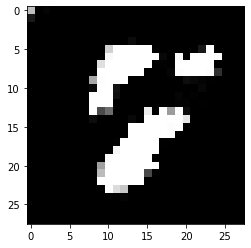

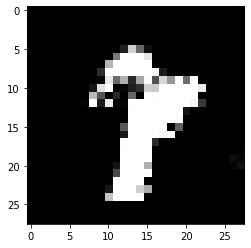

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


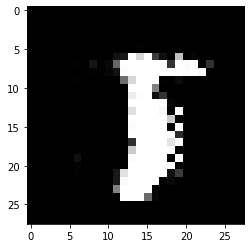

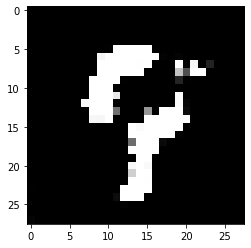

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


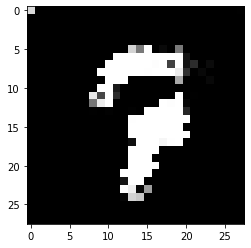

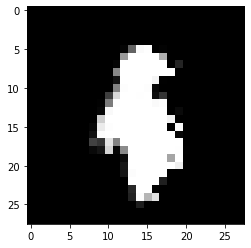

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


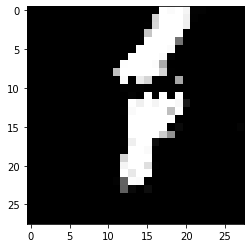

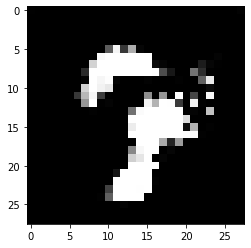

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


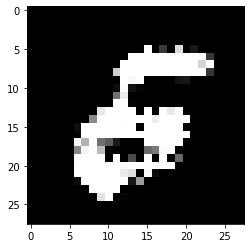

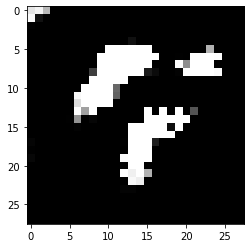

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


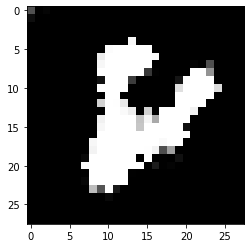

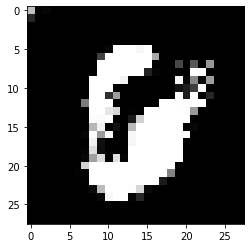

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


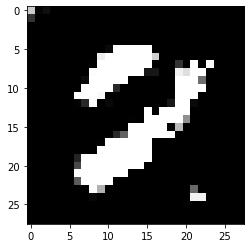

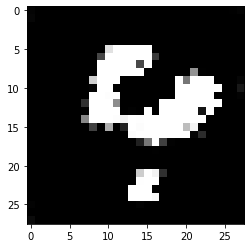

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


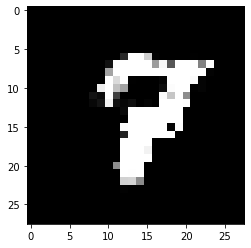

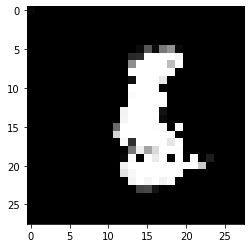

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


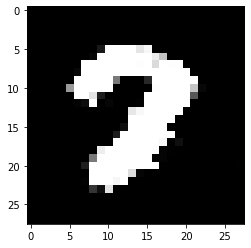

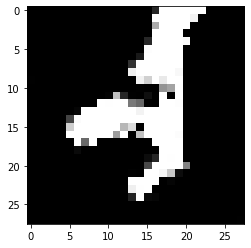

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


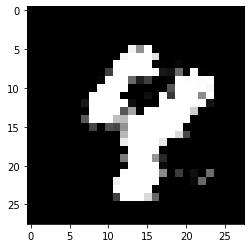

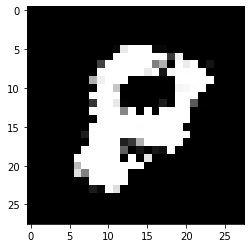

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


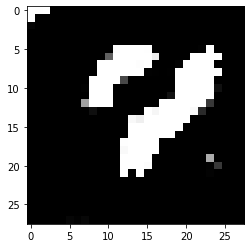

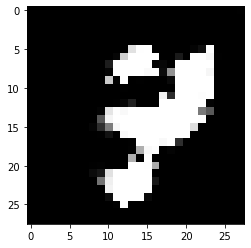

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


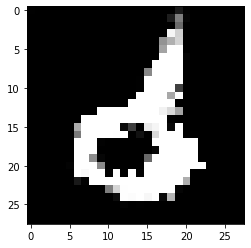

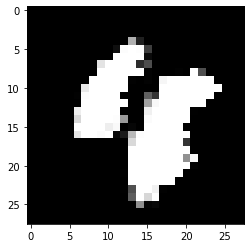

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


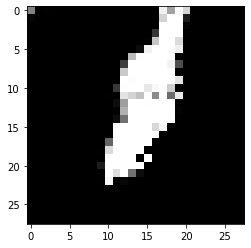

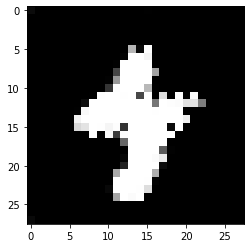

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


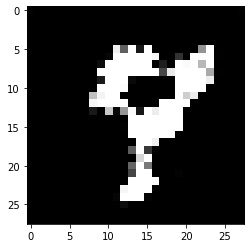

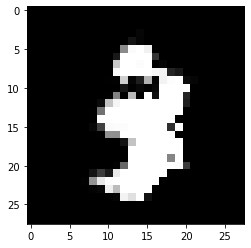

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


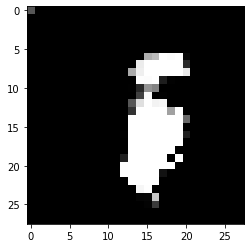

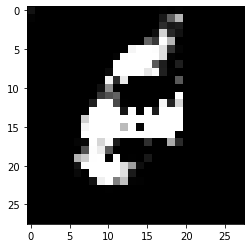

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


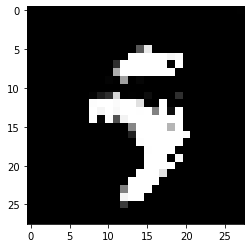

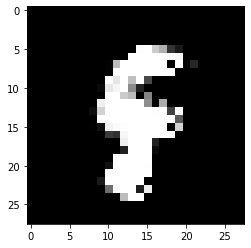

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


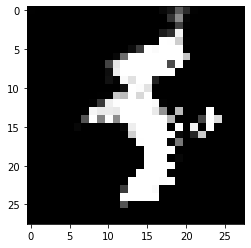

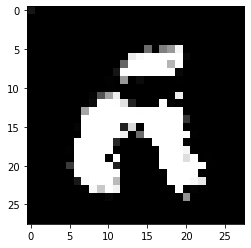

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


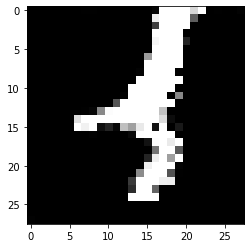

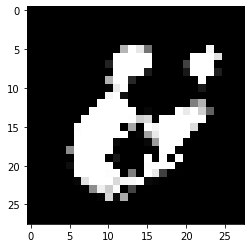

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


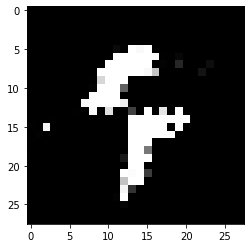

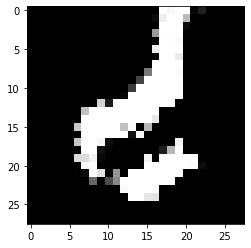

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


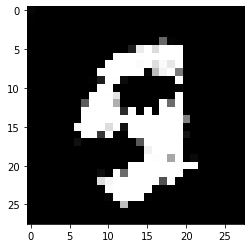

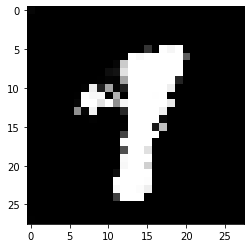

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


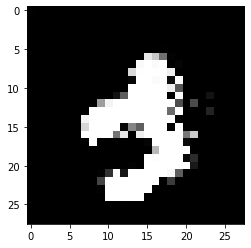

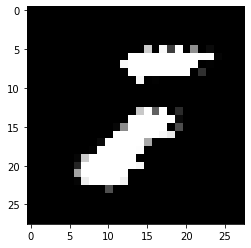

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


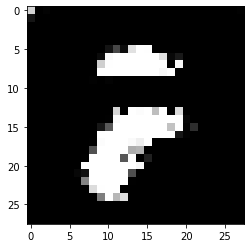

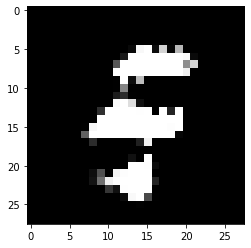

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


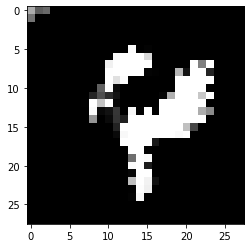

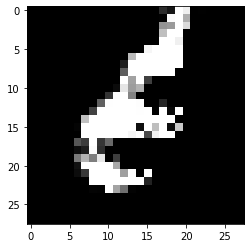

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


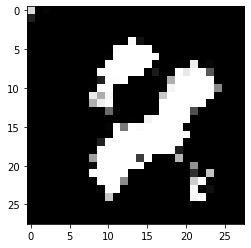

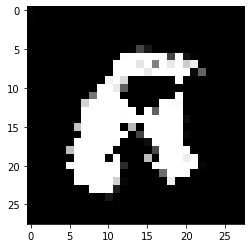

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


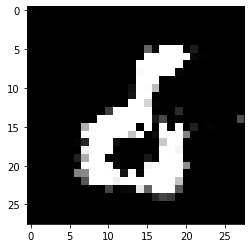

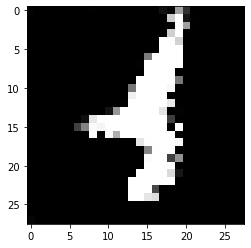

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


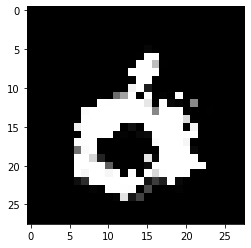

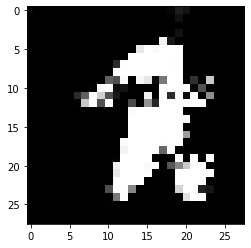

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


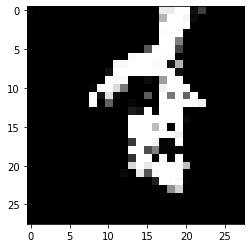

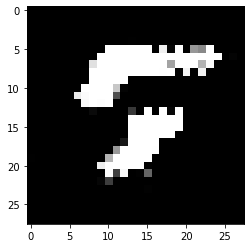

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


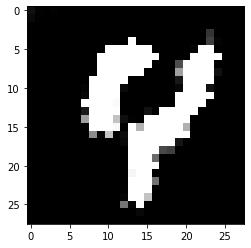

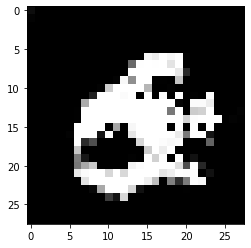

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


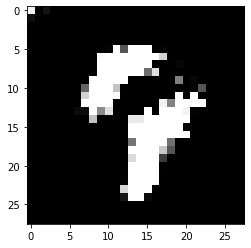

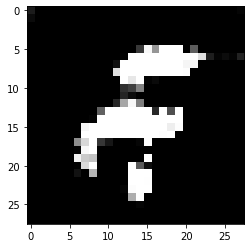

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


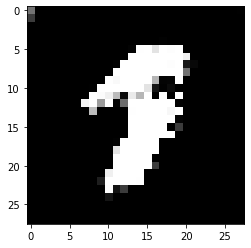

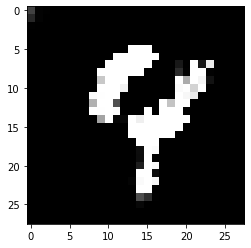

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


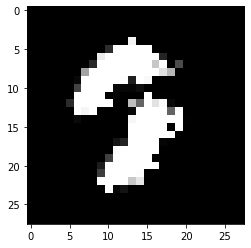

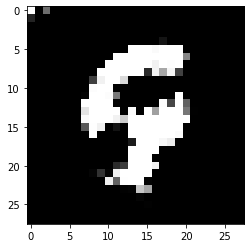

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


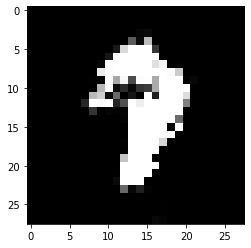

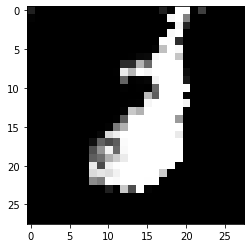

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


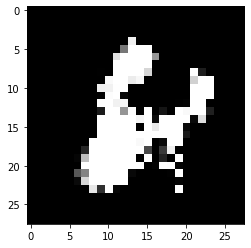

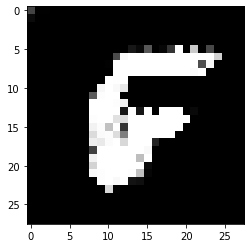

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


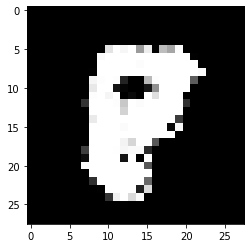

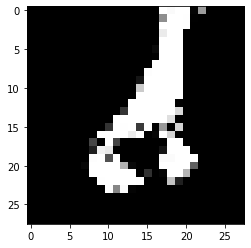

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


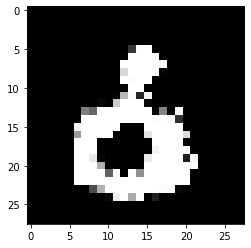

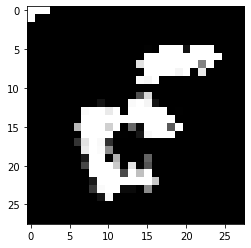

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


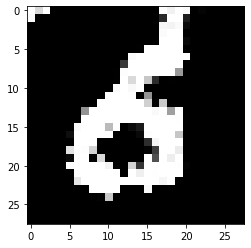

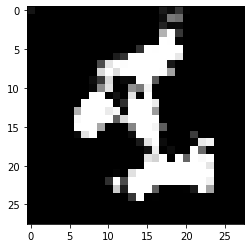

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


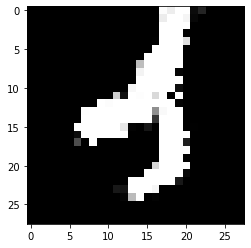

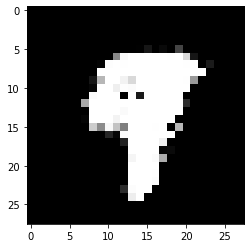

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


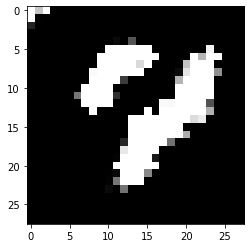

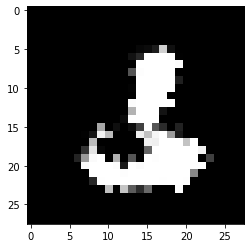

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


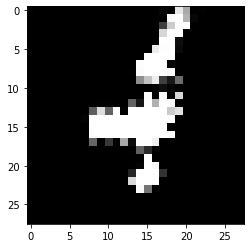

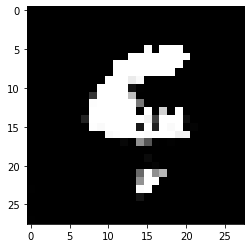

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


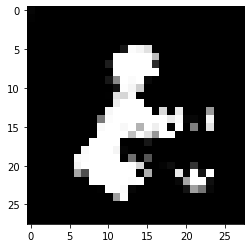

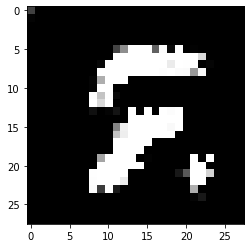

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


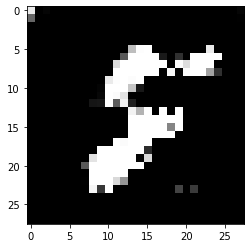

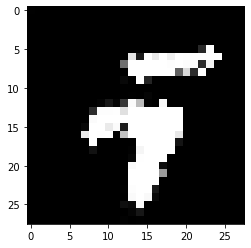

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


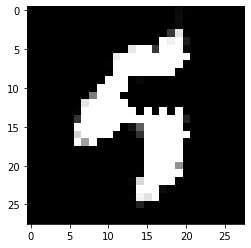

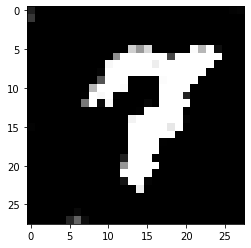

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


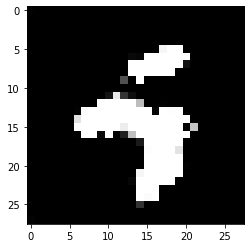

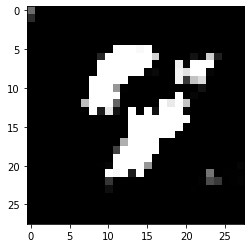

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


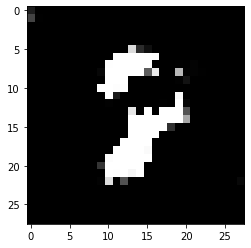

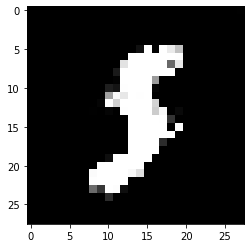

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


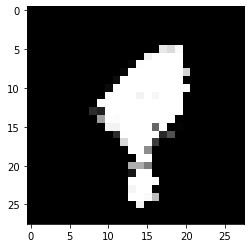

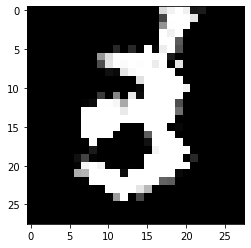

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


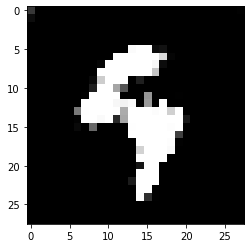

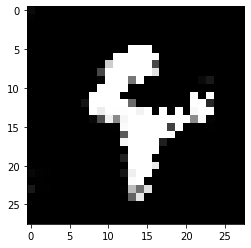

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


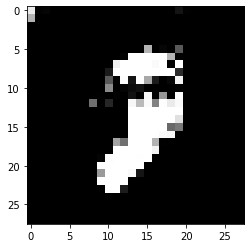

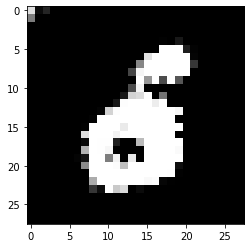

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


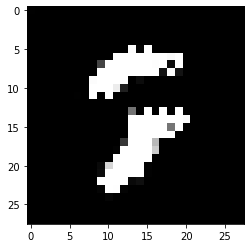

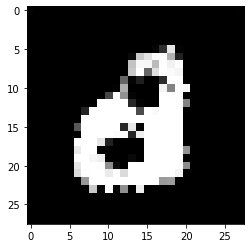

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


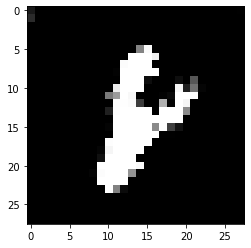

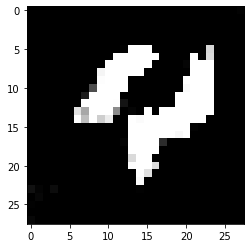

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


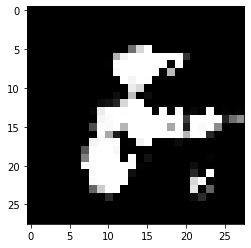

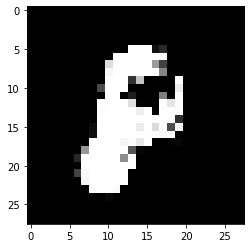

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


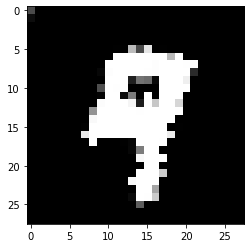

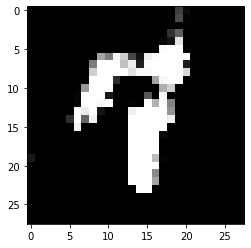

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


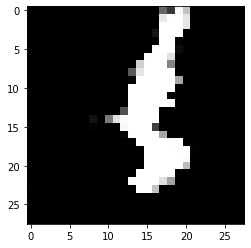

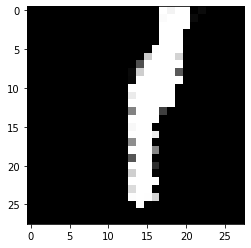

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


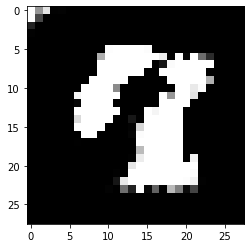

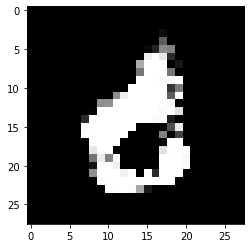

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


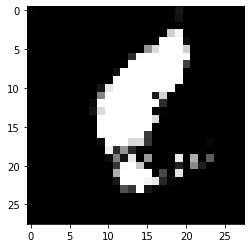

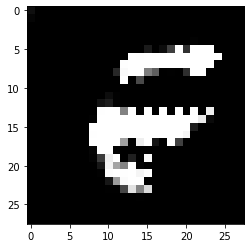

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


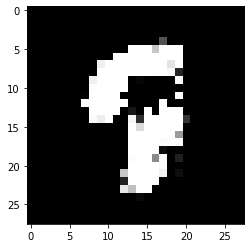

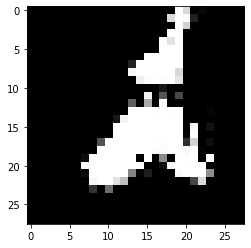

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


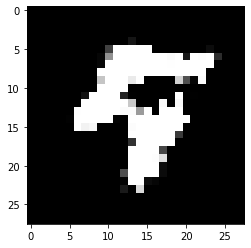

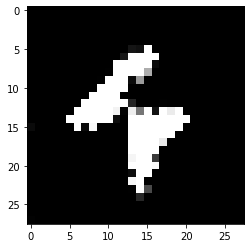

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


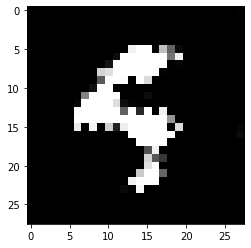

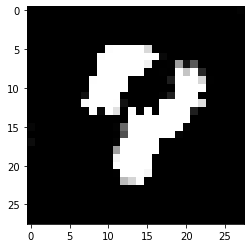

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


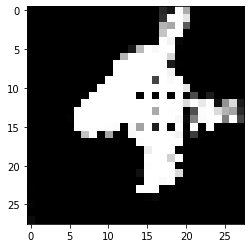

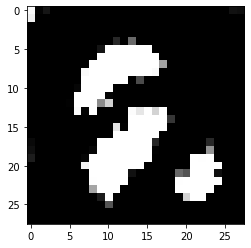

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


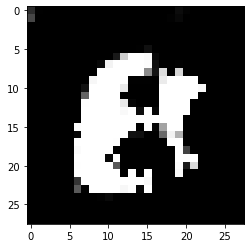

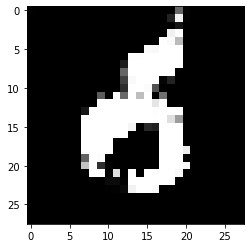

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


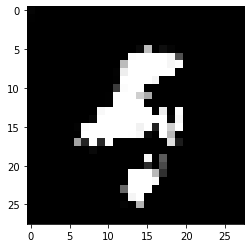

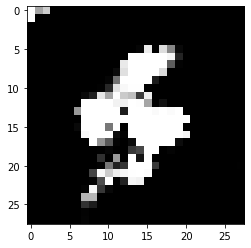

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


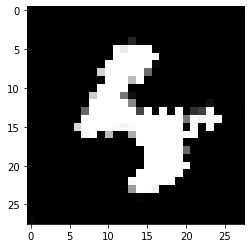

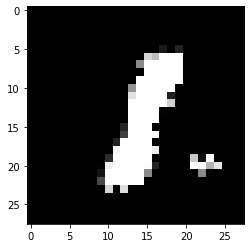

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


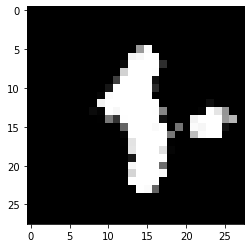

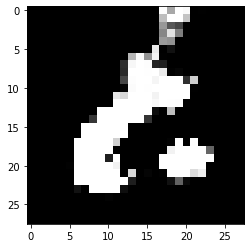

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


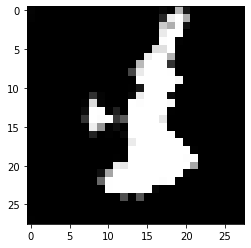

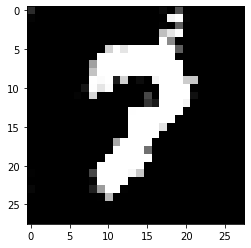

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


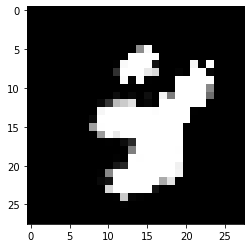

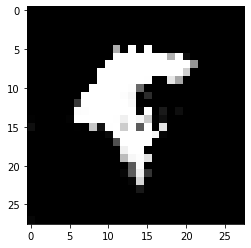

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 28ms/step


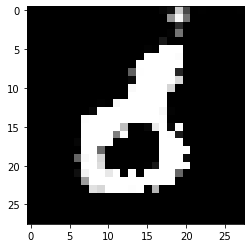

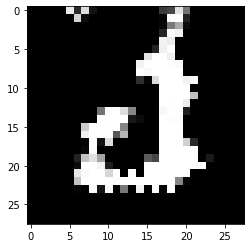

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


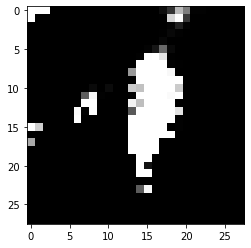

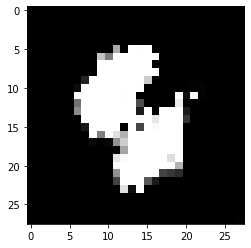

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


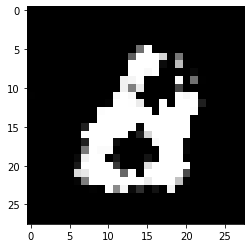

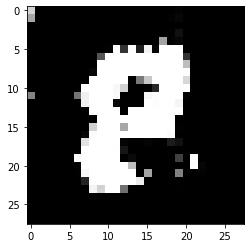

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 28ms/step


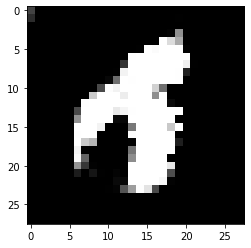

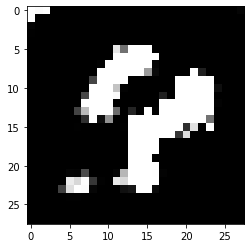

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


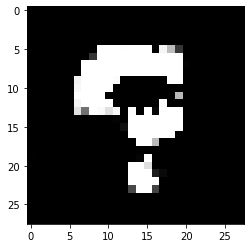

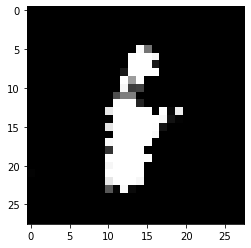

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


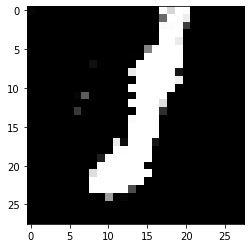

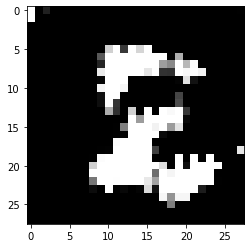

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


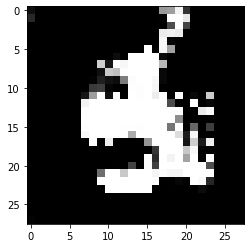

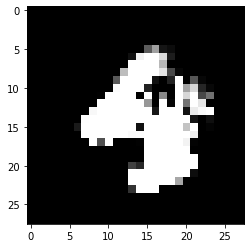

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


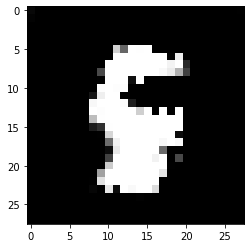

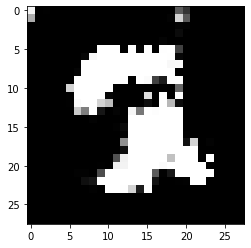

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


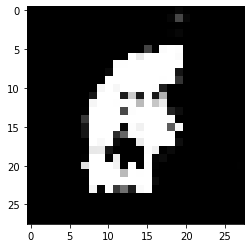

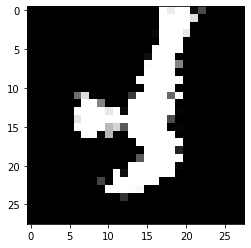

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


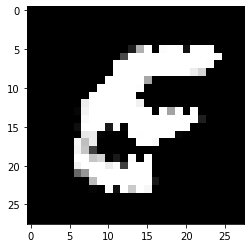

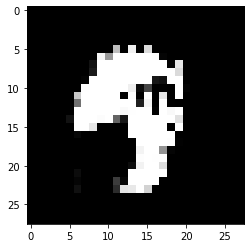

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


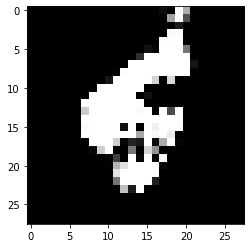

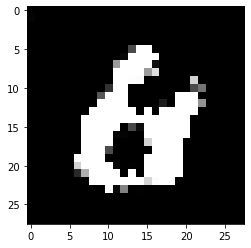

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


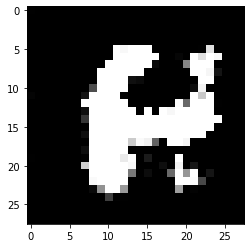

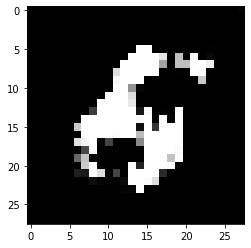

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


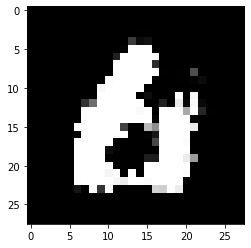

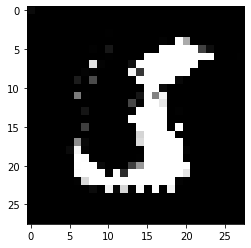

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


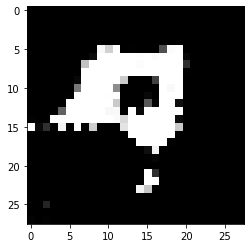

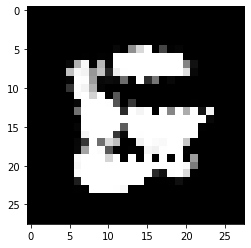

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


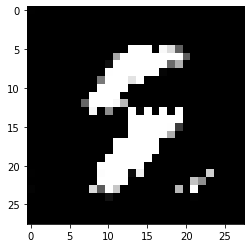

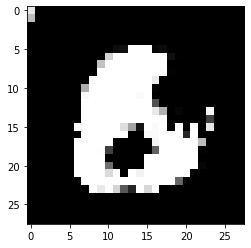

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


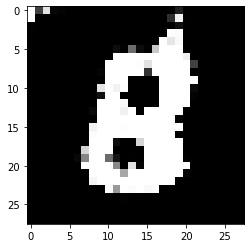

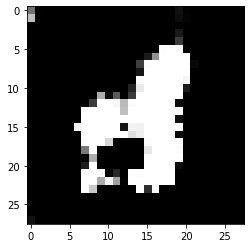

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


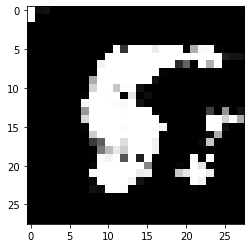

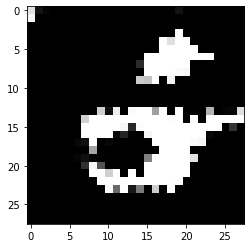

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


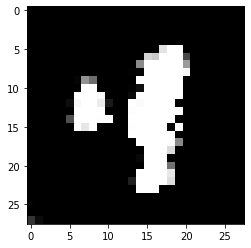

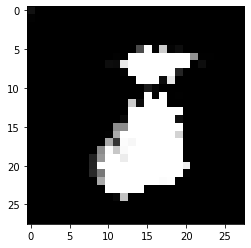

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


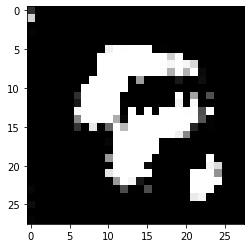

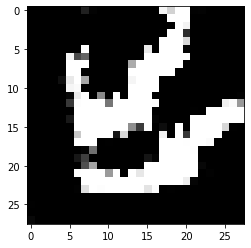

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


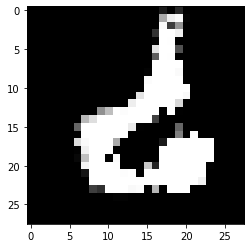

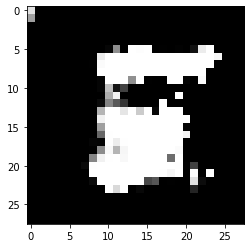

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


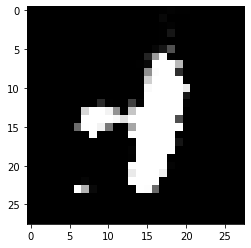

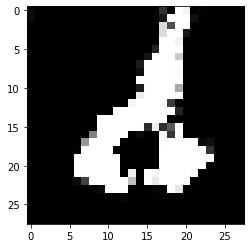

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


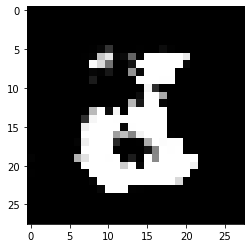

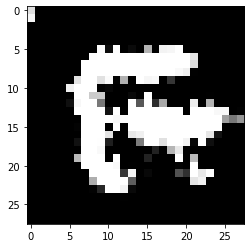

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


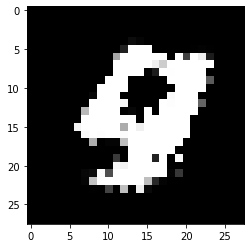

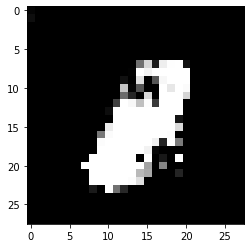

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


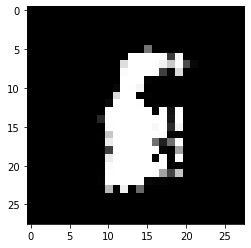

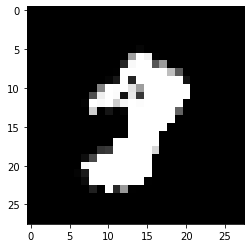

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


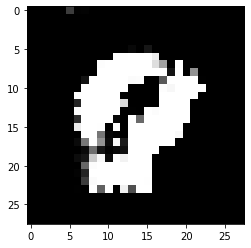

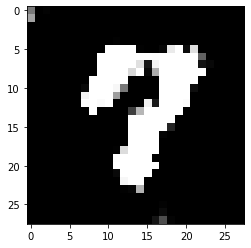

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


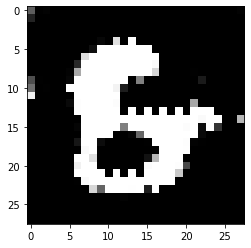

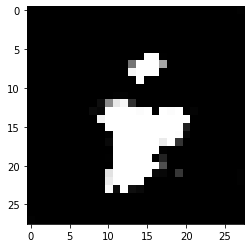

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


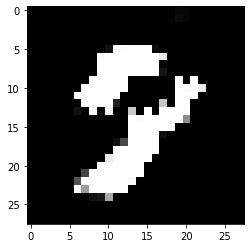

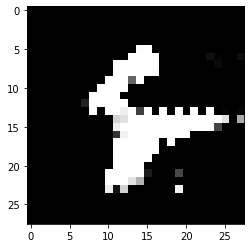

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


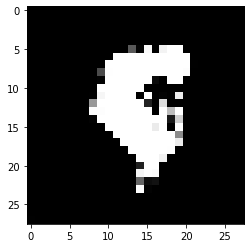

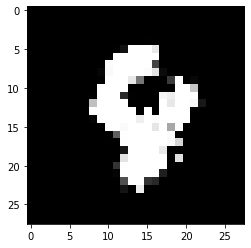

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


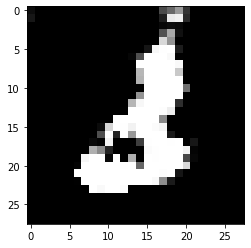

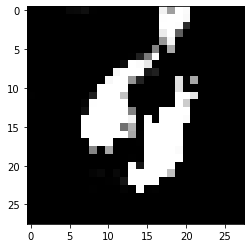

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


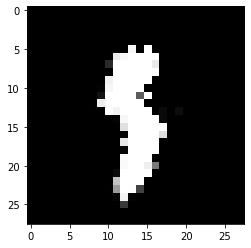

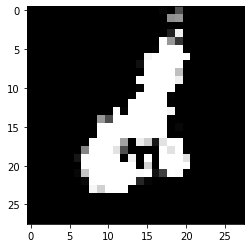

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


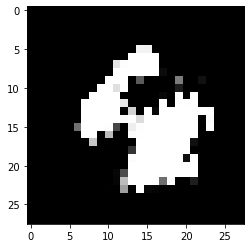

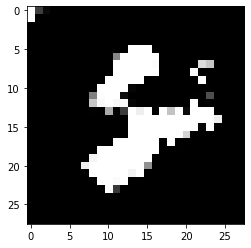

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


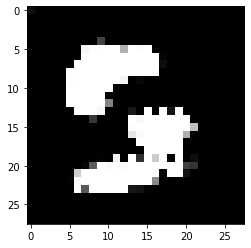

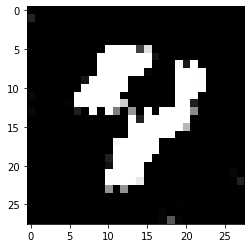

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


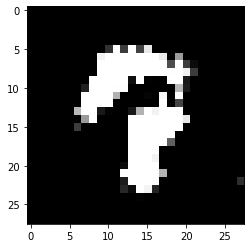

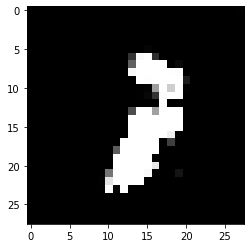

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


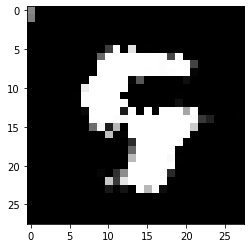

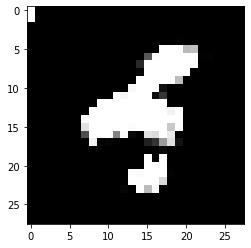

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


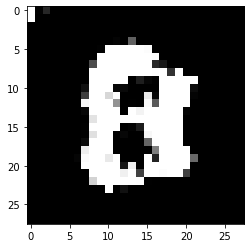

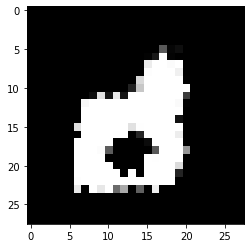

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


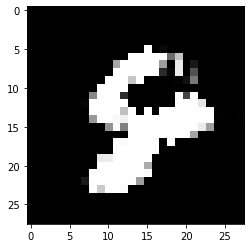

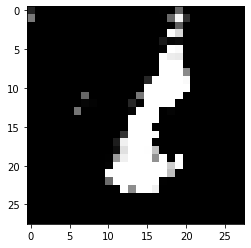

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


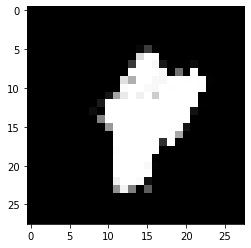

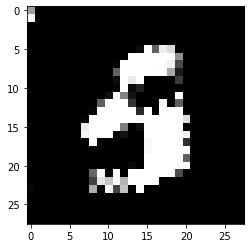

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


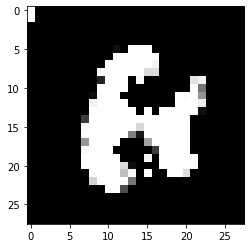

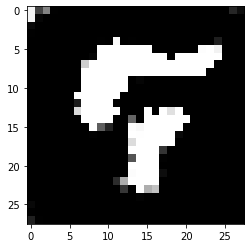

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


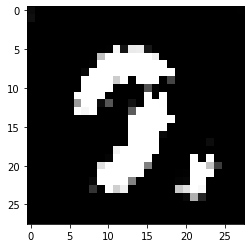

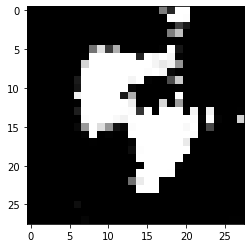

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


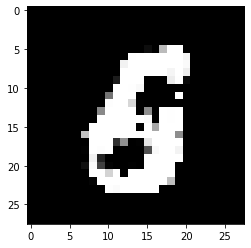

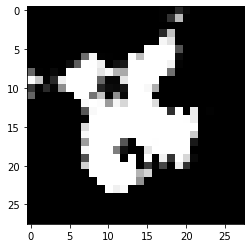

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


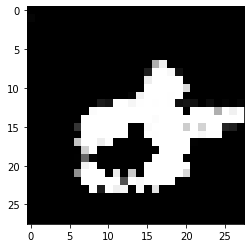

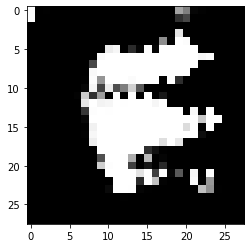

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


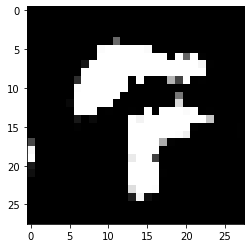

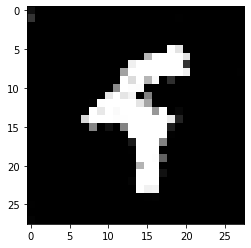

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


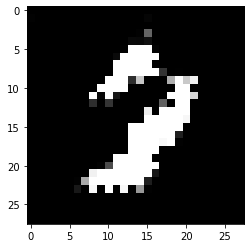

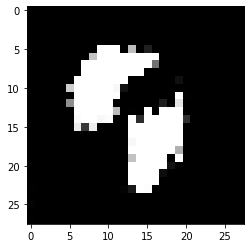

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


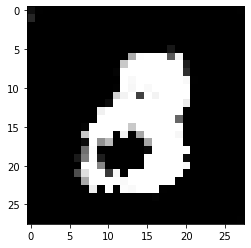

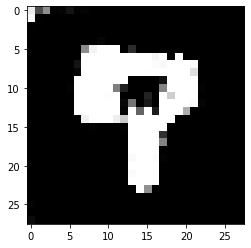

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


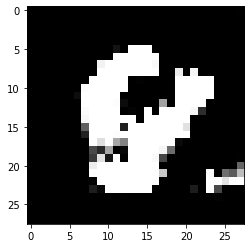

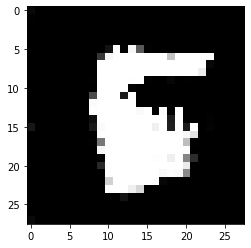

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


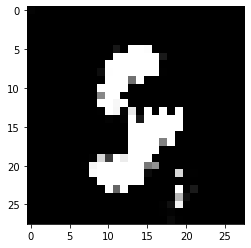

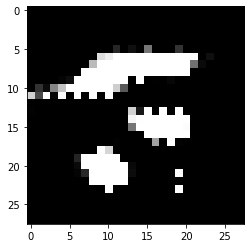

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


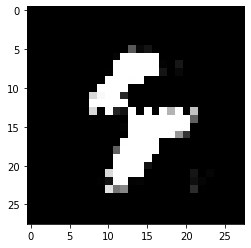

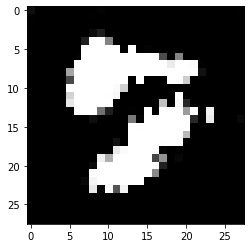

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


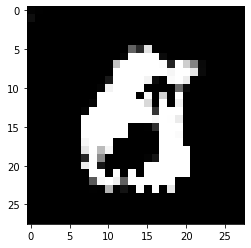

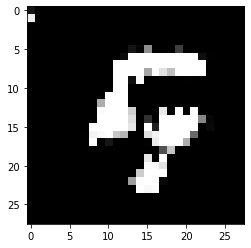

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


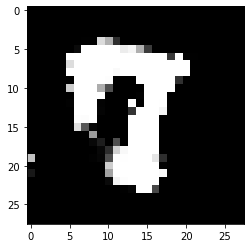

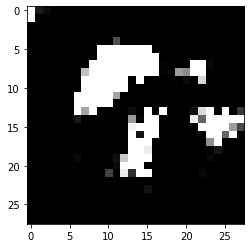

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


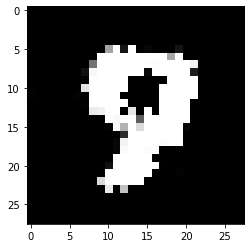

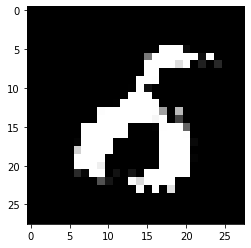

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


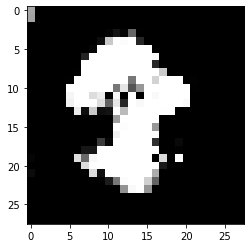

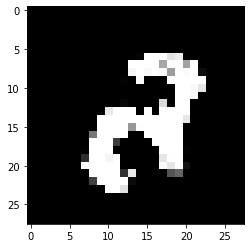

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


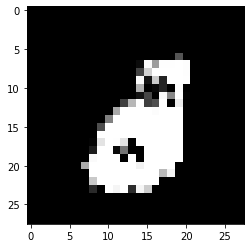

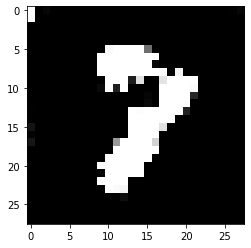

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


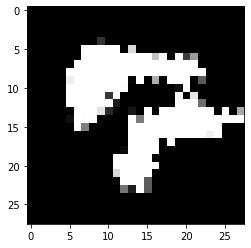

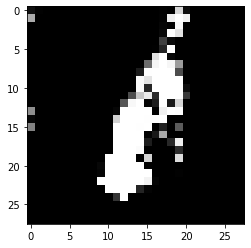

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 27ms/step


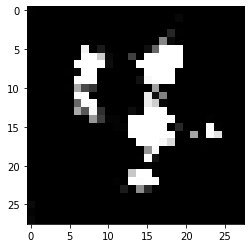

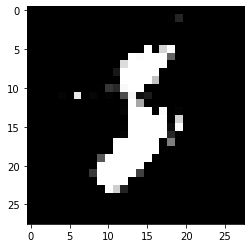

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


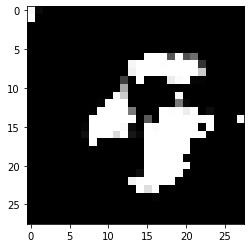

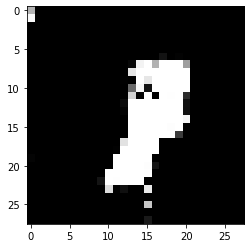

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


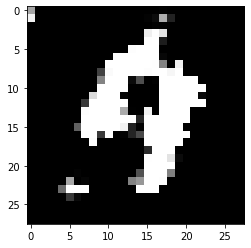

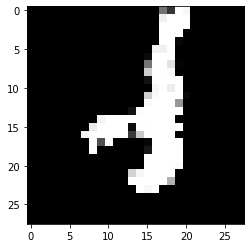

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


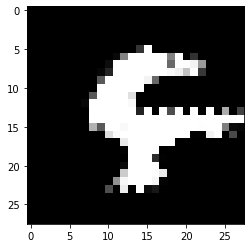

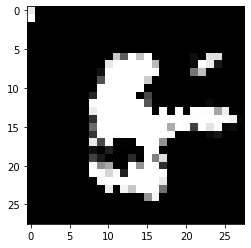

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


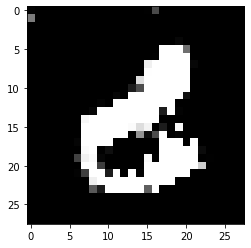

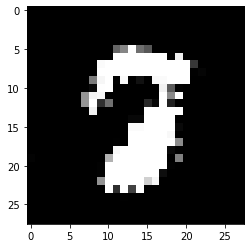

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


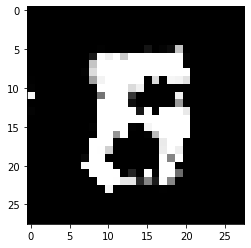

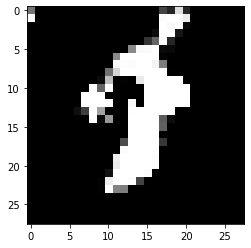

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


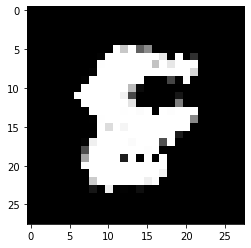

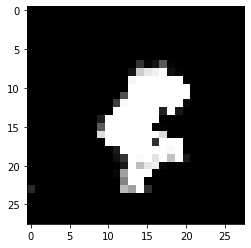

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


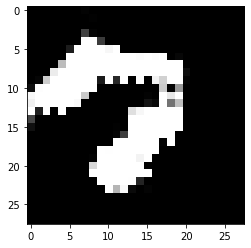

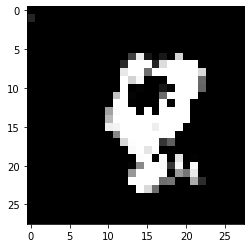

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


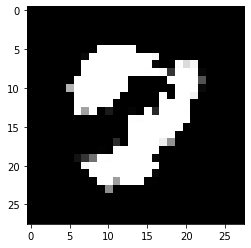

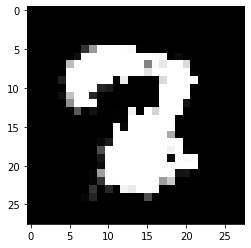

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


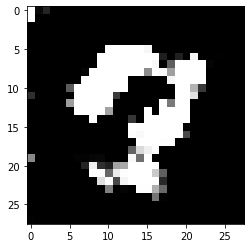

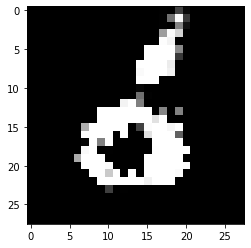

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


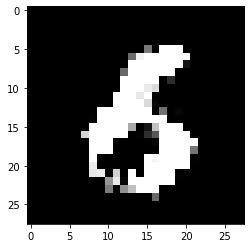

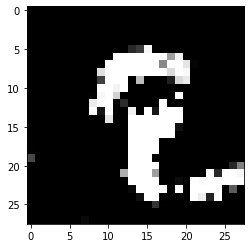

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


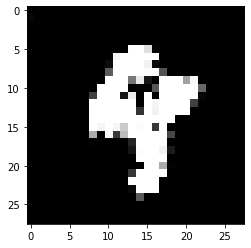

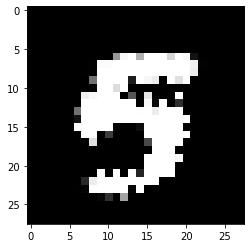

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


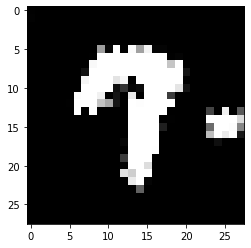

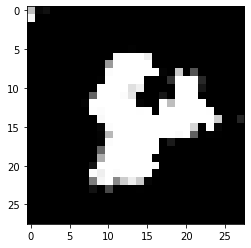

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


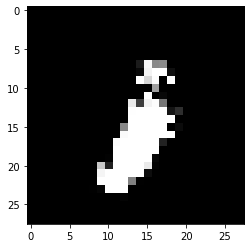

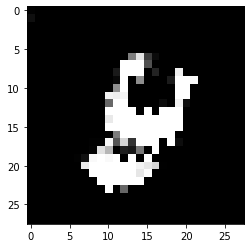

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


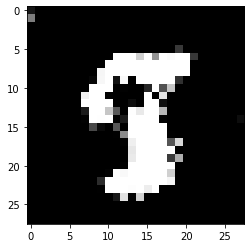

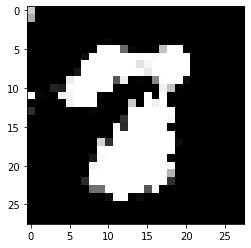

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


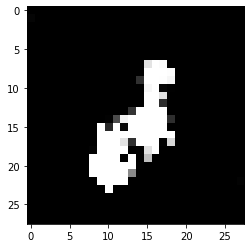

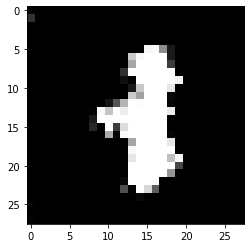

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


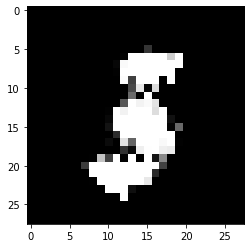

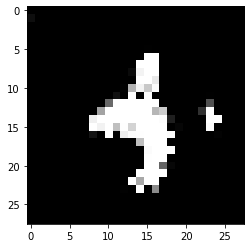

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


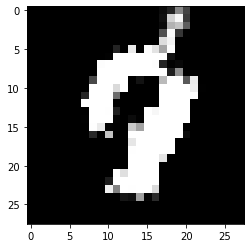

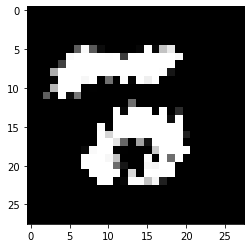

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


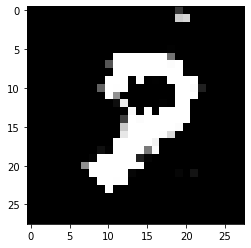

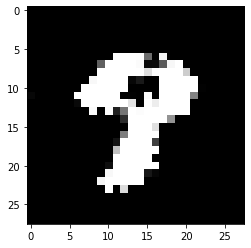

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


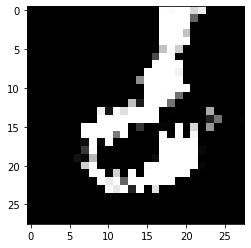

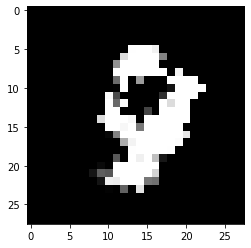

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


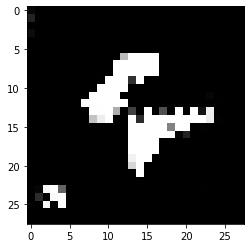

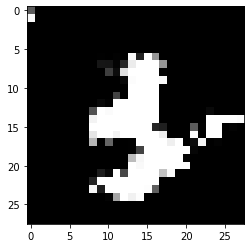

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


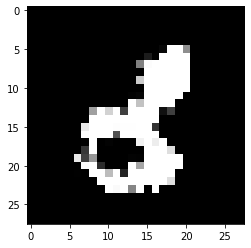

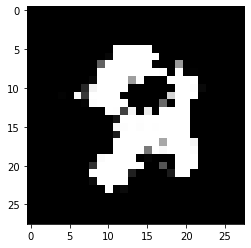

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


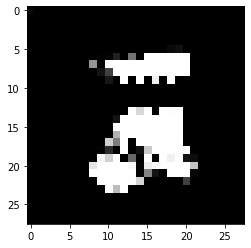

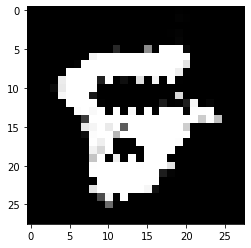

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


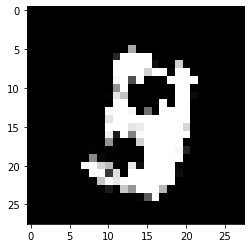

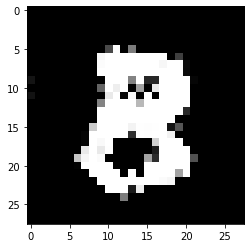

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


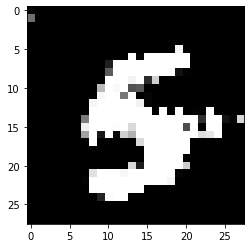

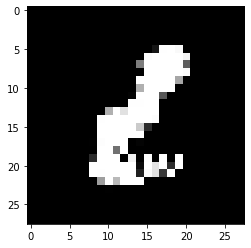

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


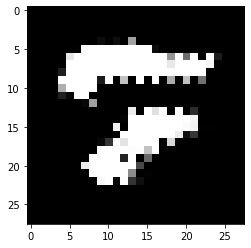

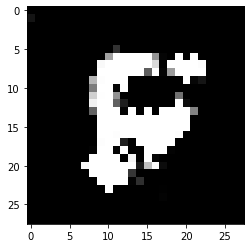

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


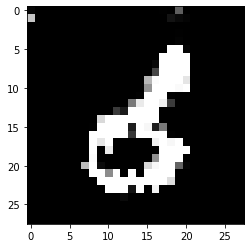

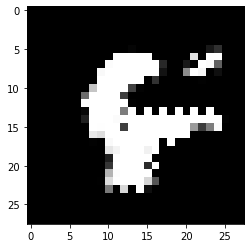

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


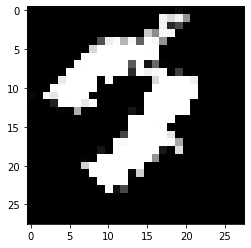

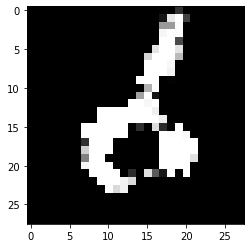

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 29ms/step


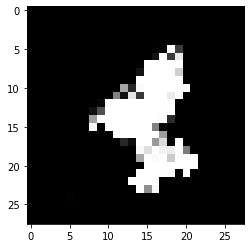

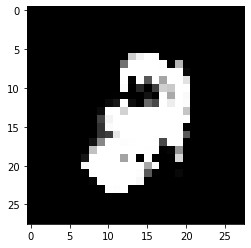

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


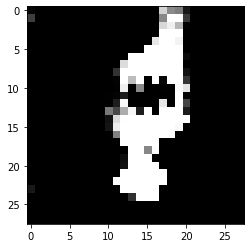

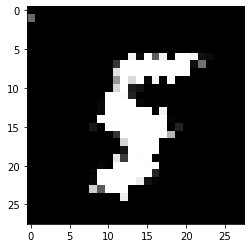

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


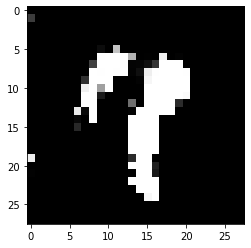

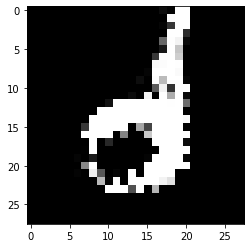

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


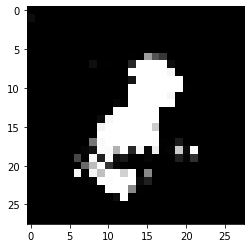

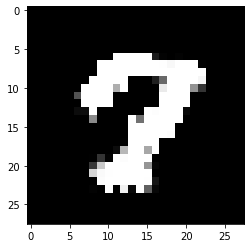

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


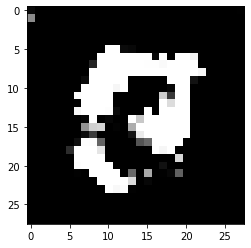

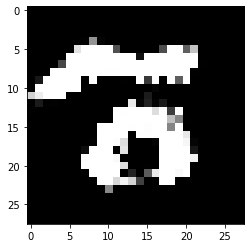

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


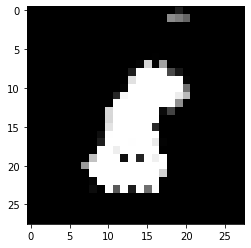

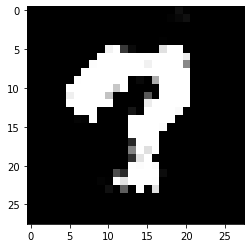

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


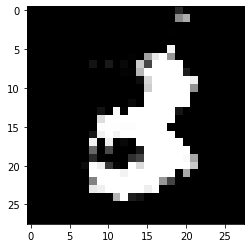

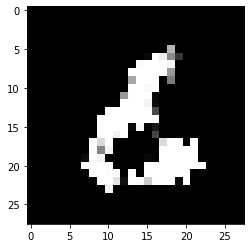

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


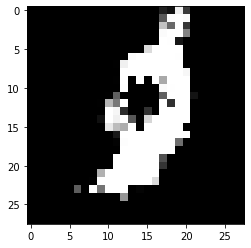

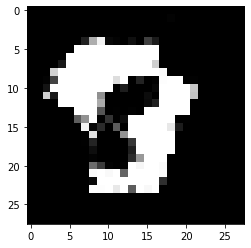

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


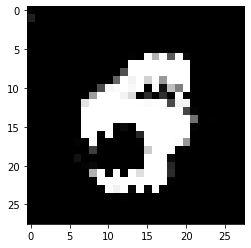

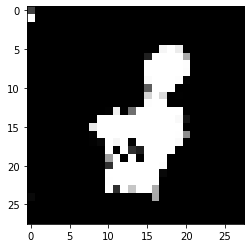

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


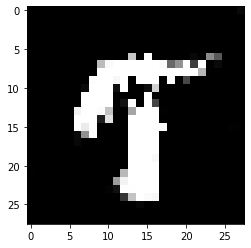

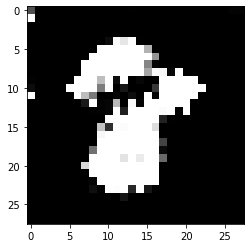

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


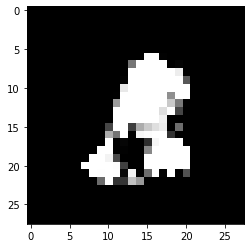

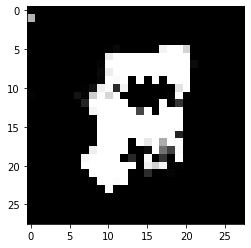

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


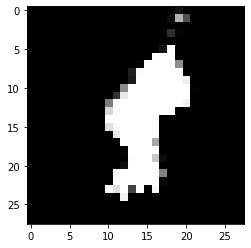

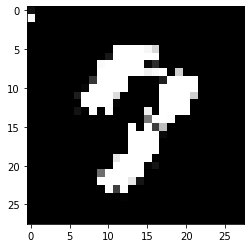

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


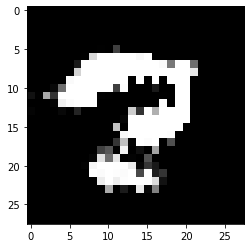

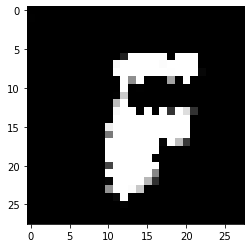

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


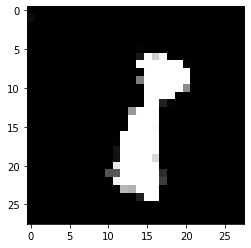

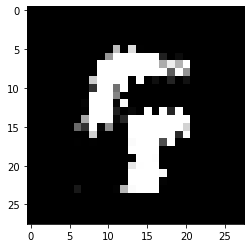

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


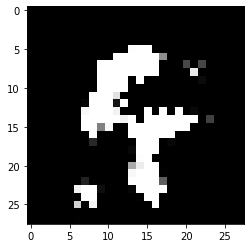

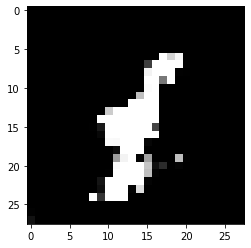

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


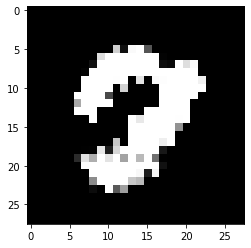

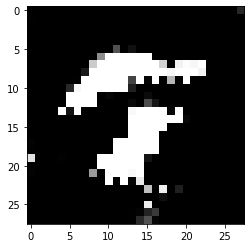

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


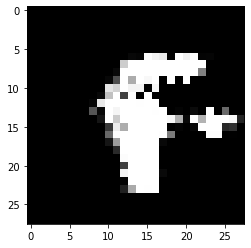

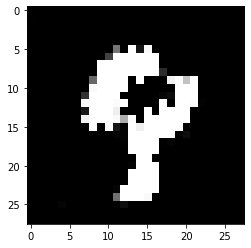

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


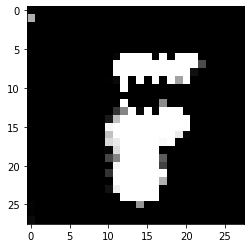

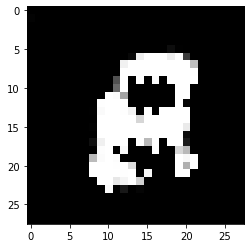

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


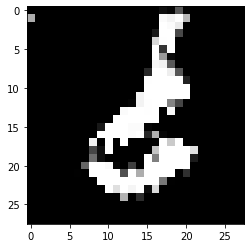

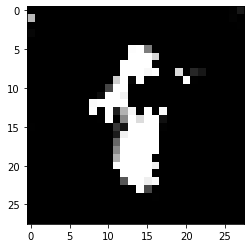

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


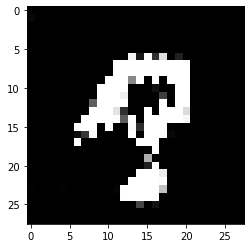

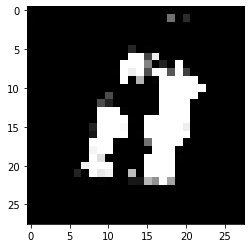

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


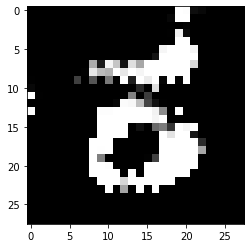

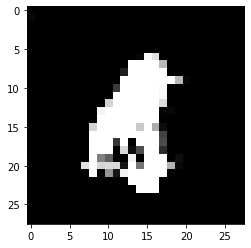

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


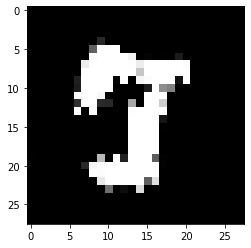

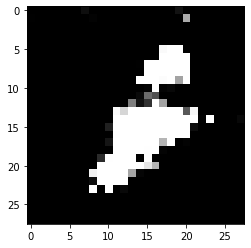

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


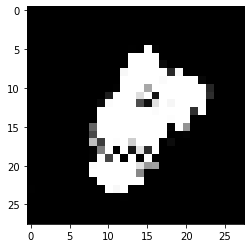

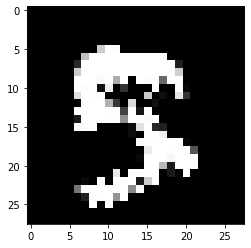

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


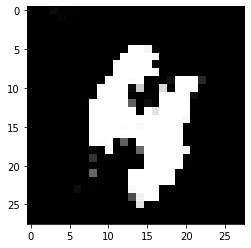

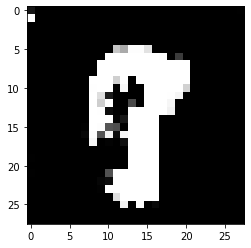

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


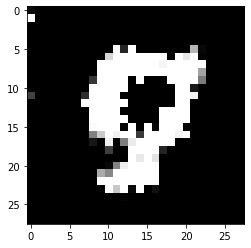

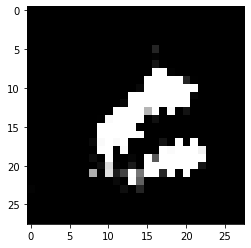

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 29ms/step


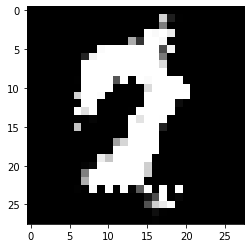

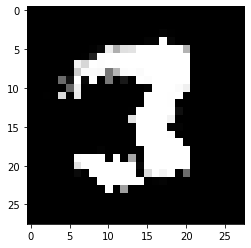

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


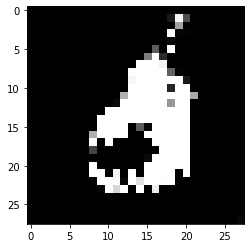

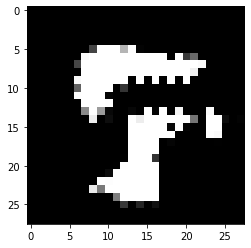

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


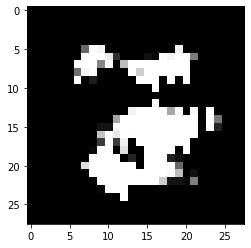

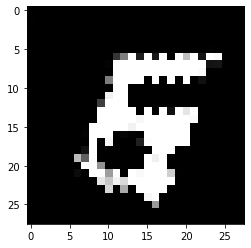

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


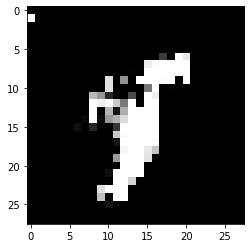

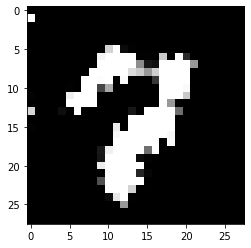

train discriminator:
True
True
4/4 [==============================] - 0s 6ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


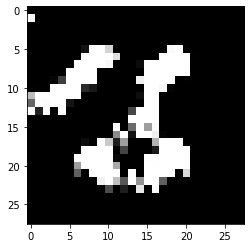

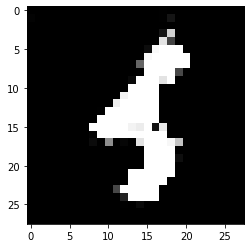

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


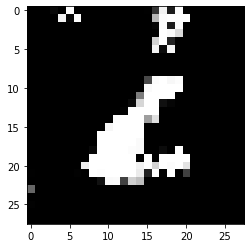

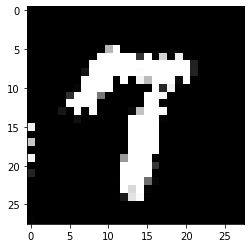

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


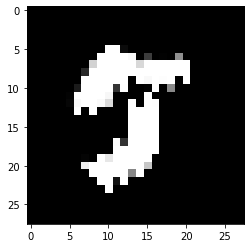

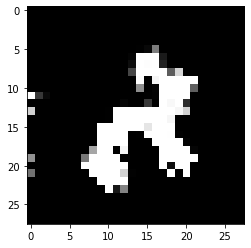

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


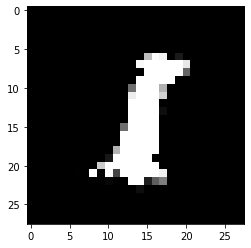

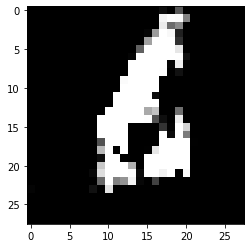

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


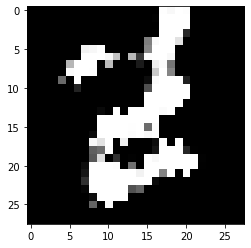

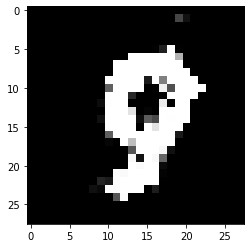

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


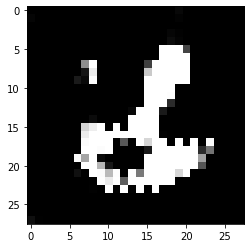

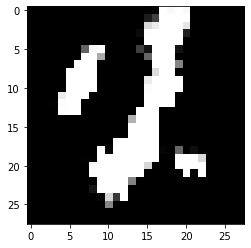

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


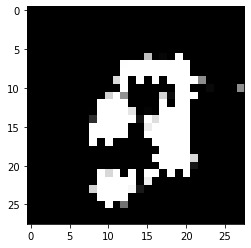

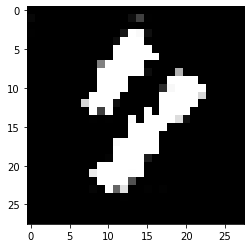

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


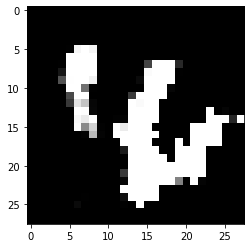

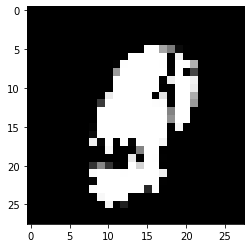

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


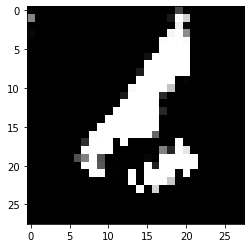

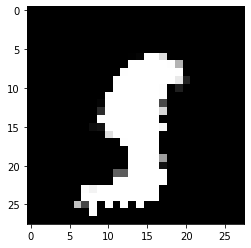

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


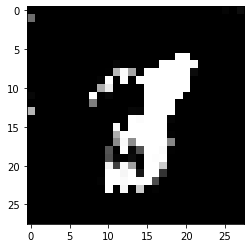

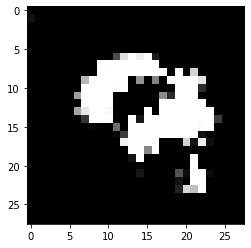

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


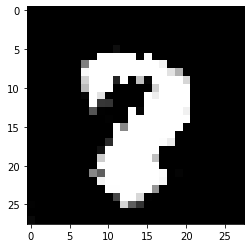

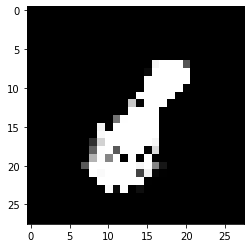

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


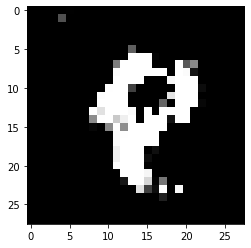

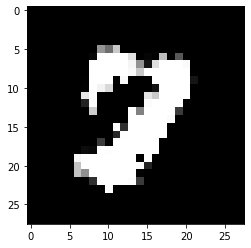

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


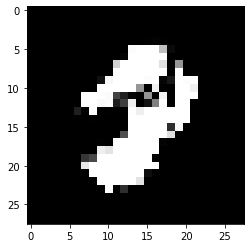

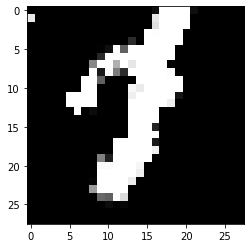

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


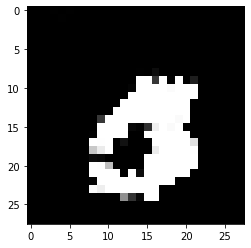

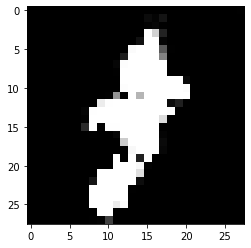

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


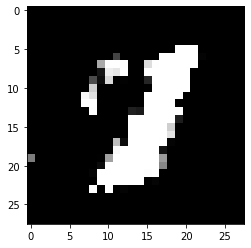

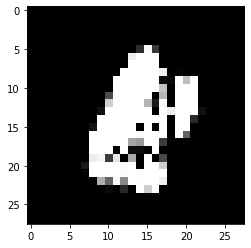

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


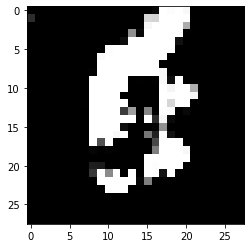

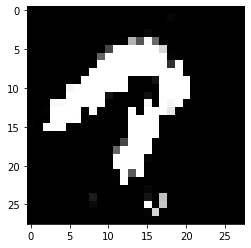

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


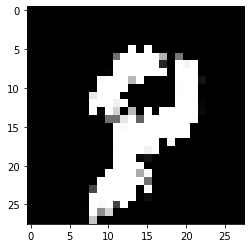

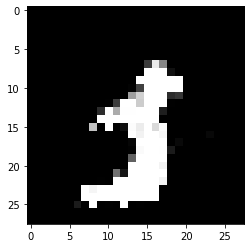

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


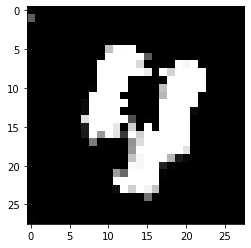

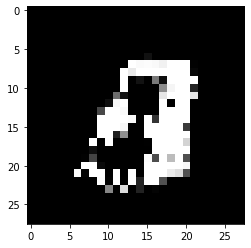

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


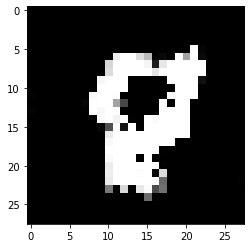

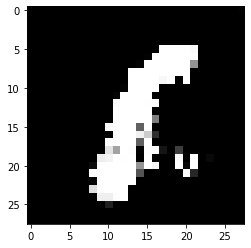

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


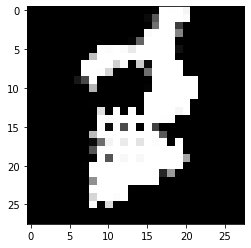

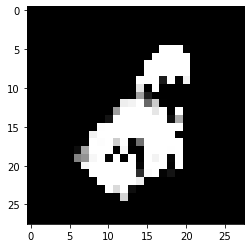

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


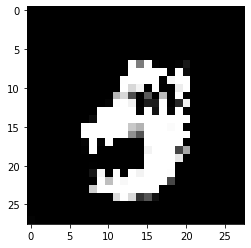

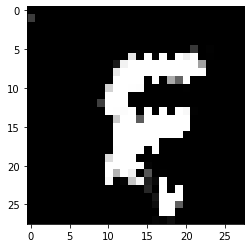

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


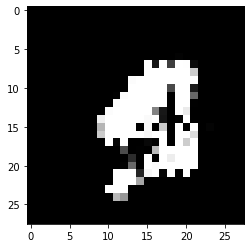

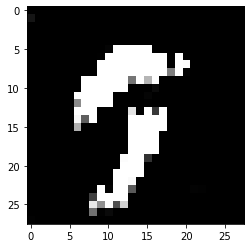

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


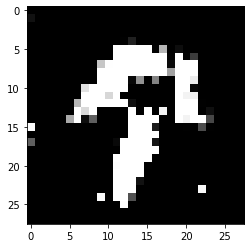

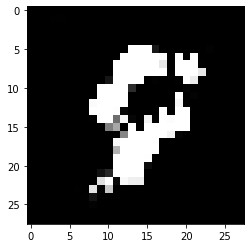

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


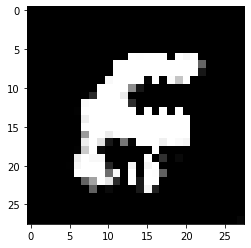

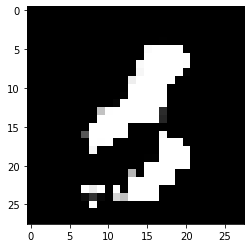

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


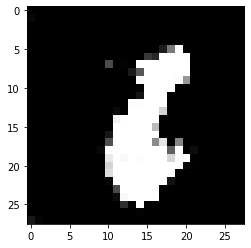

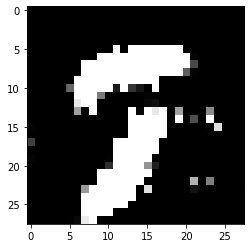

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


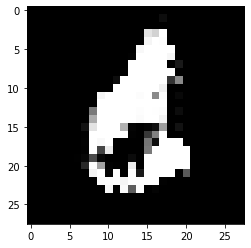

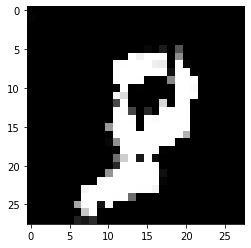

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


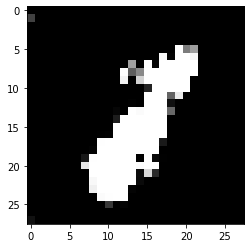

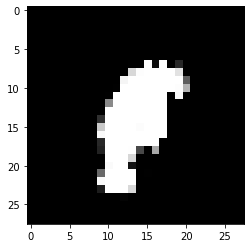

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


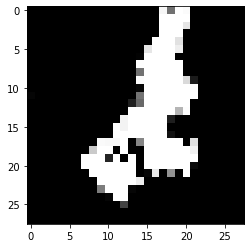

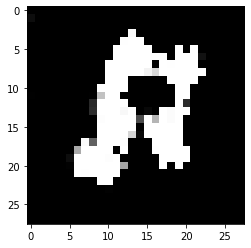

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


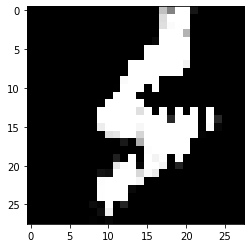

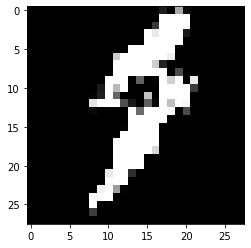

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


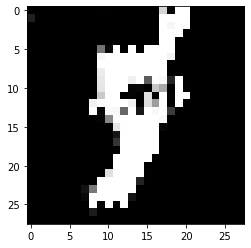

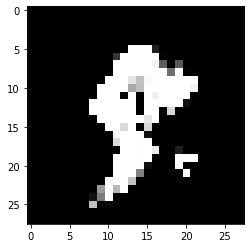

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


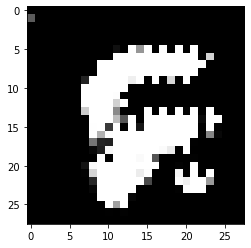

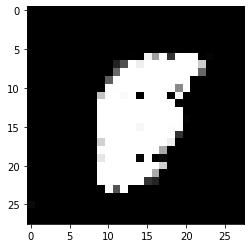

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 28ms/step


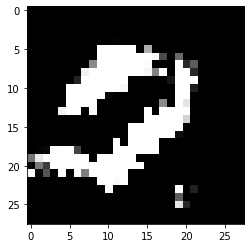

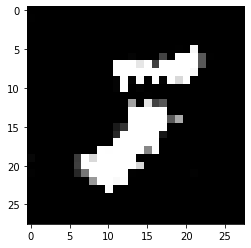

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


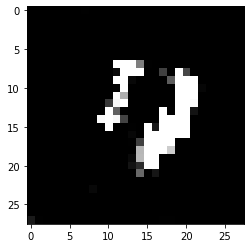

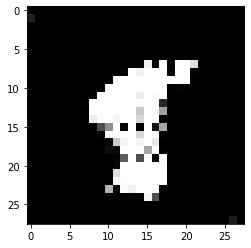

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


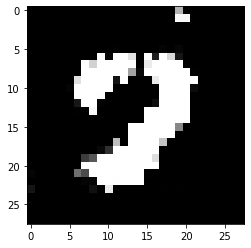

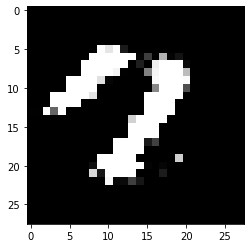

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


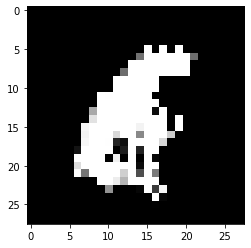

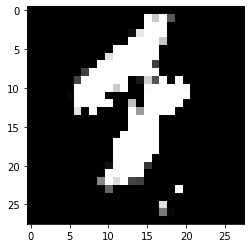

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


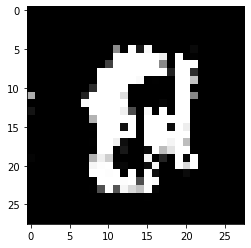

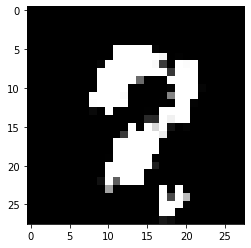

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


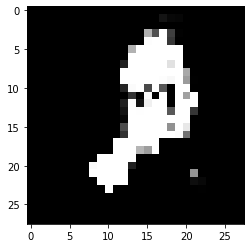

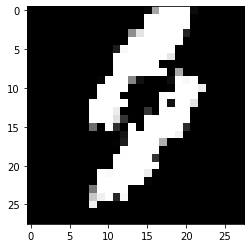

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


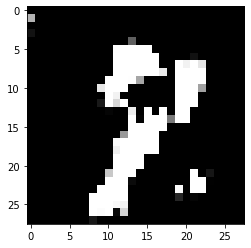

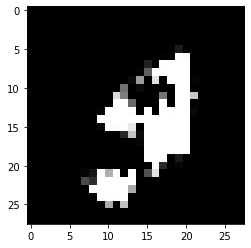

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


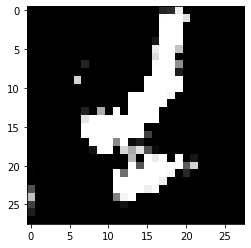

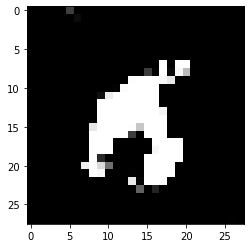

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


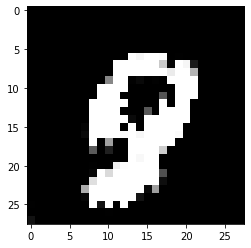

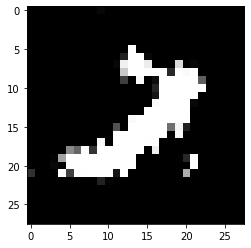

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


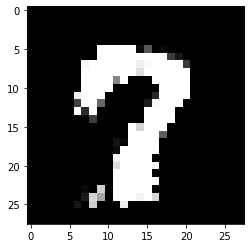

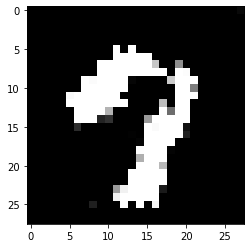

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


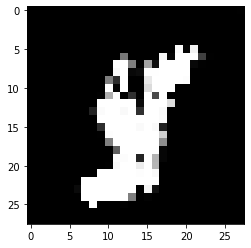

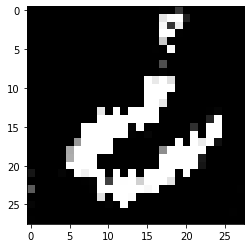

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


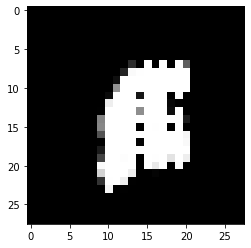

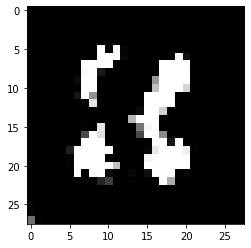

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


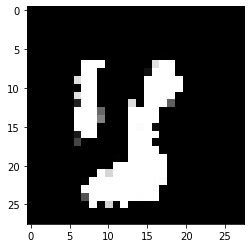

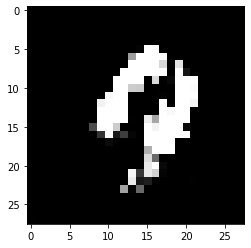

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


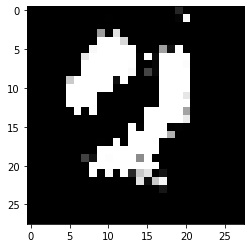

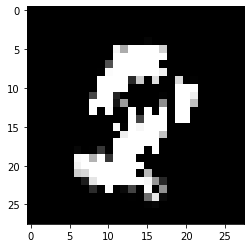

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


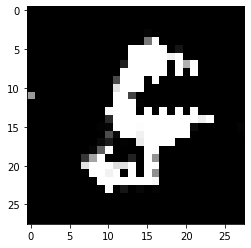

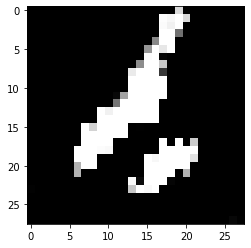

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


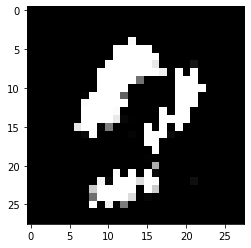

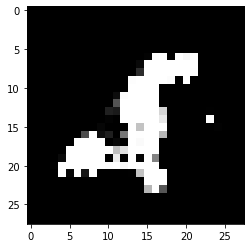

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


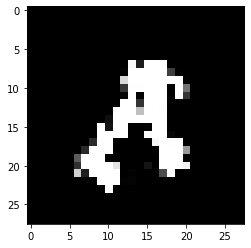

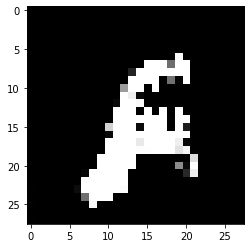

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


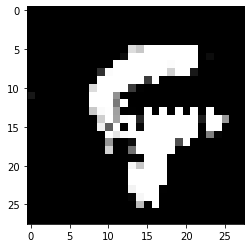

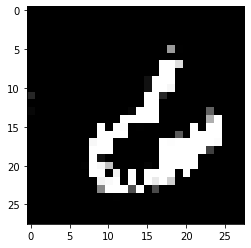

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


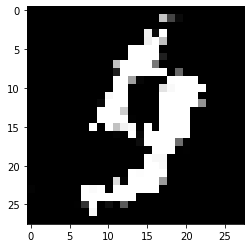

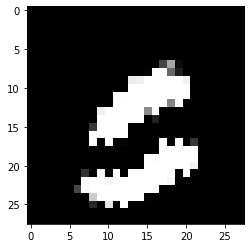

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


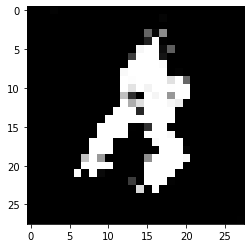

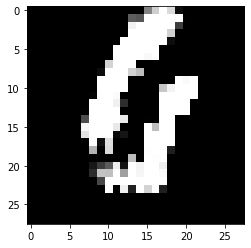

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


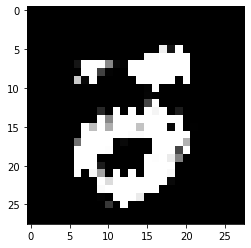

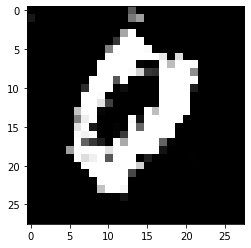

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


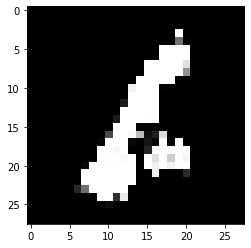

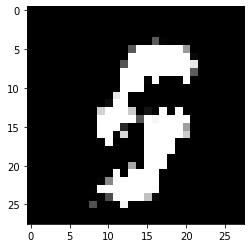

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


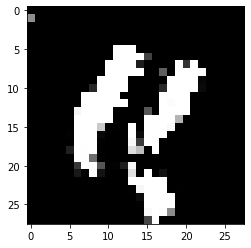

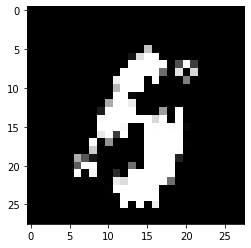

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


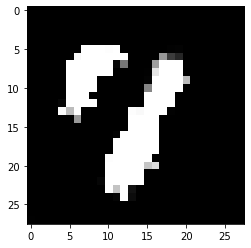

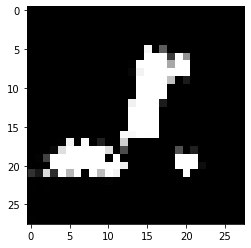

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


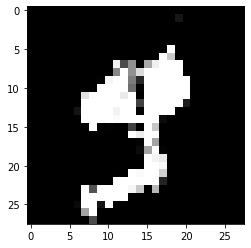

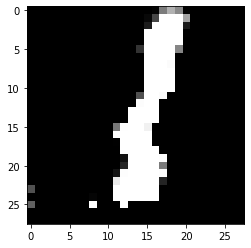

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


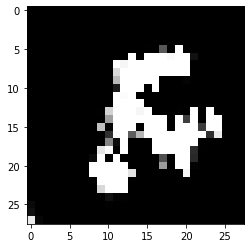

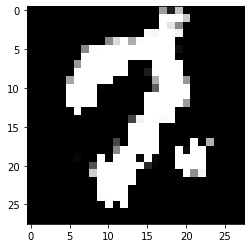

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


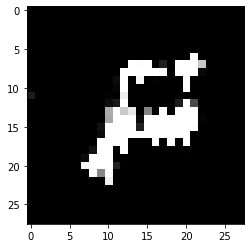

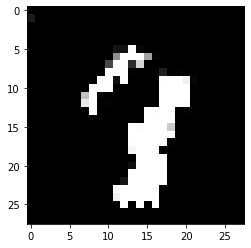

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


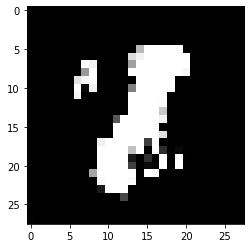

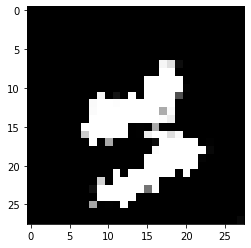

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


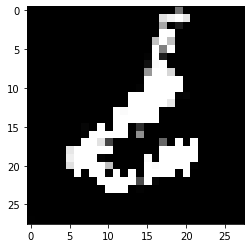

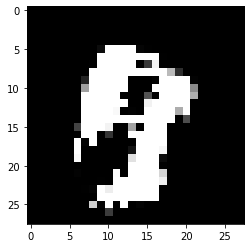

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


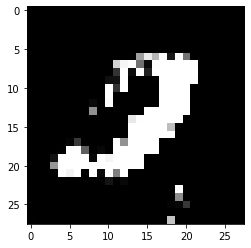

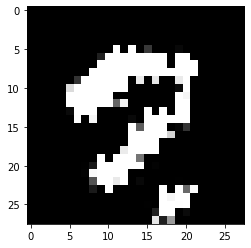

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


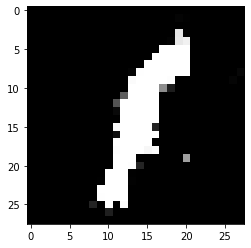

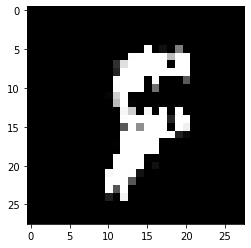

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


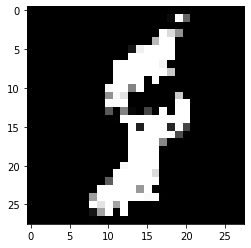

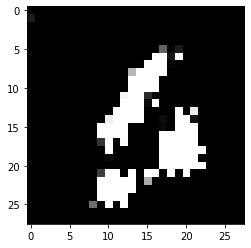

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


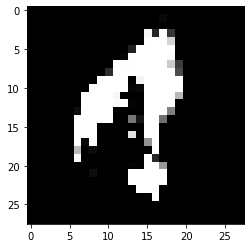

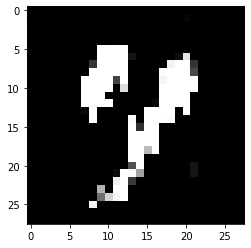

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


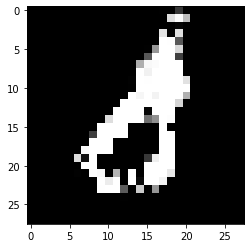

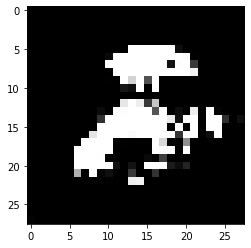

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


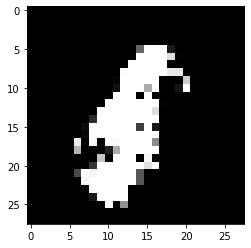

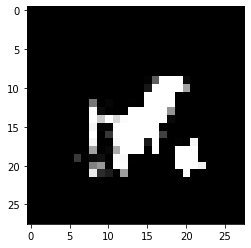

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


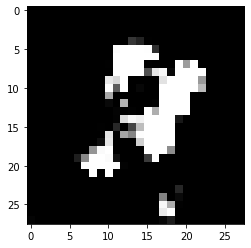

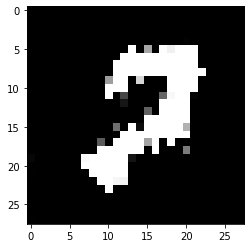

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


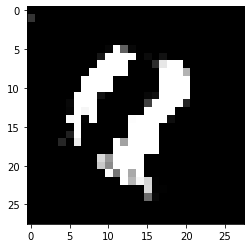

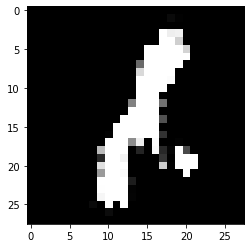

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


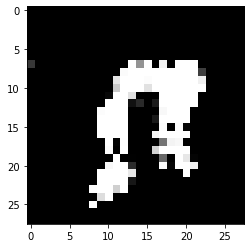

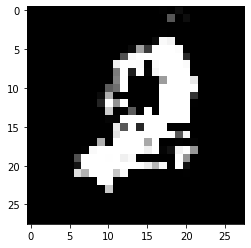

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


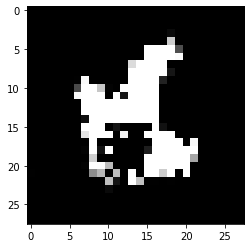

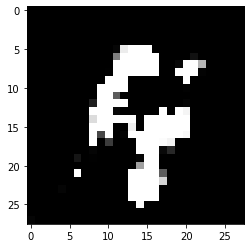

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


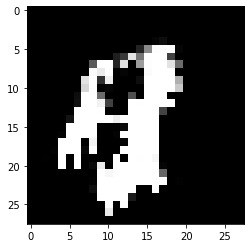

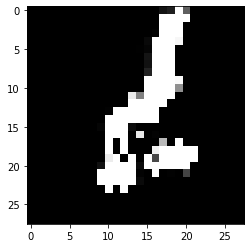

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


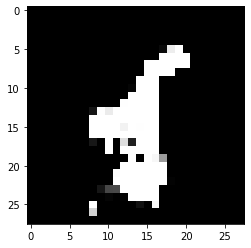

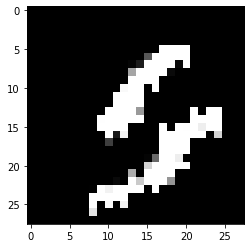

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


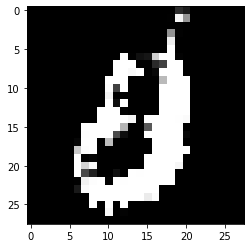

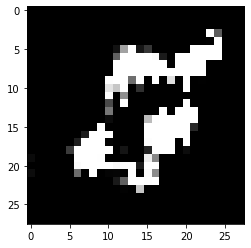

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


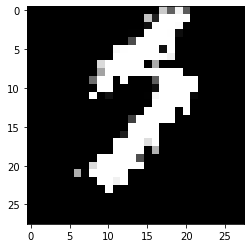

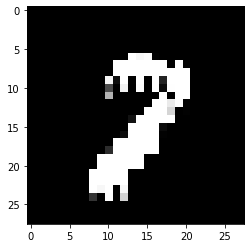

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


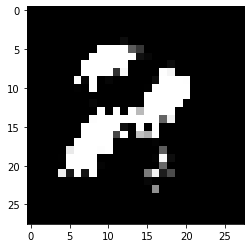

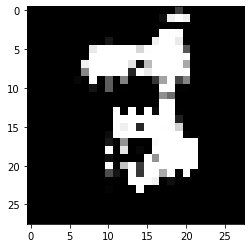

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


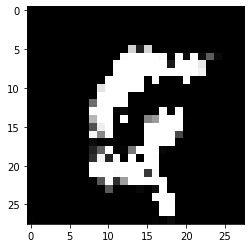

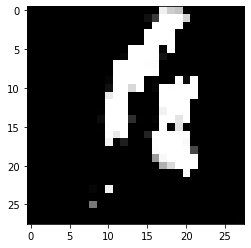

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 28ms/step


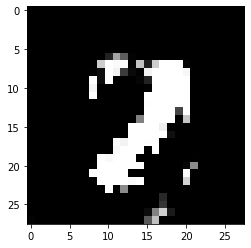

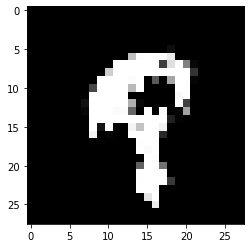

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


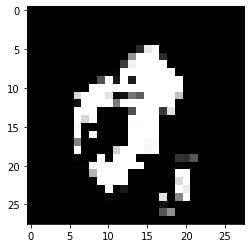

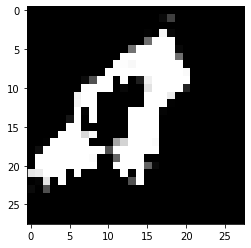

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


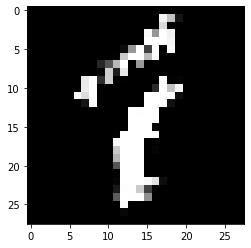

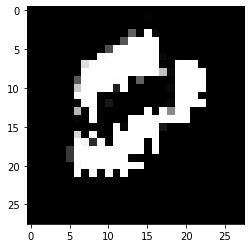

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


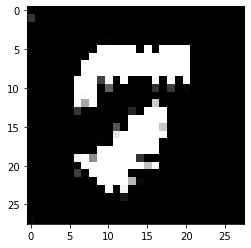

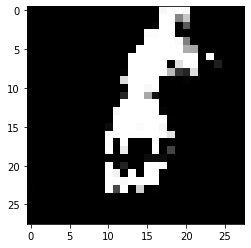

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


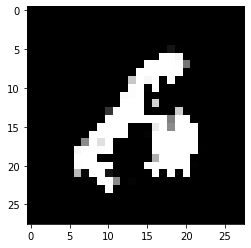

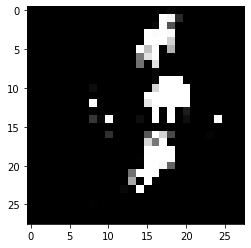

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


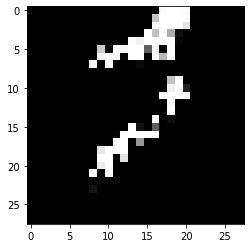

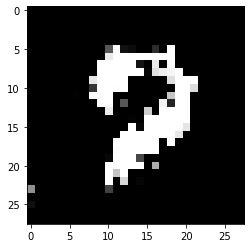

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


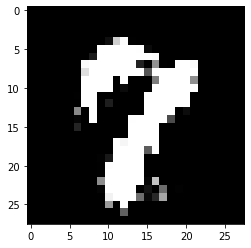

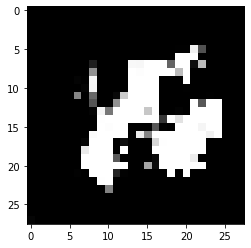

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


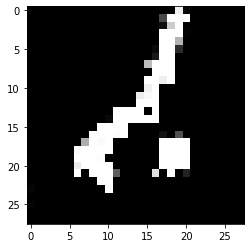

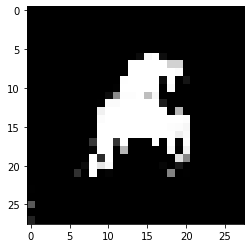

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


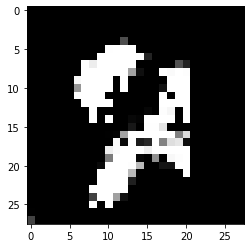

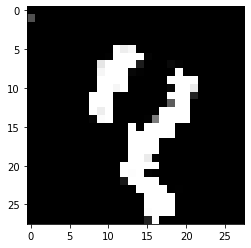

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


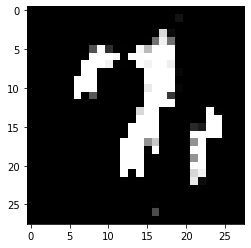

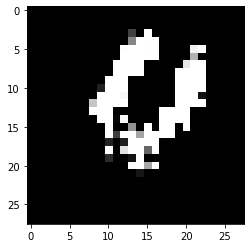

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


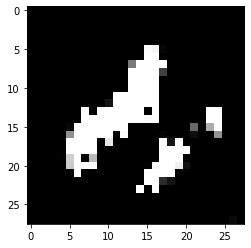

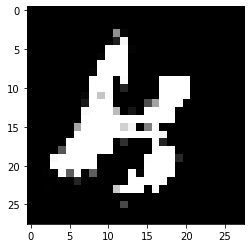

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


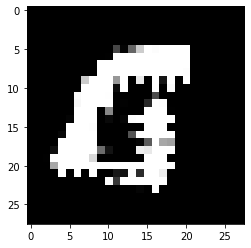

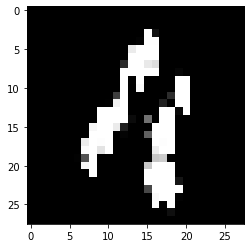

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


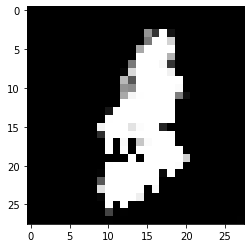

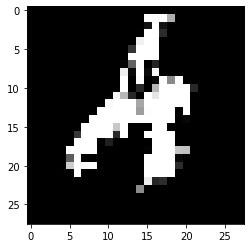

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


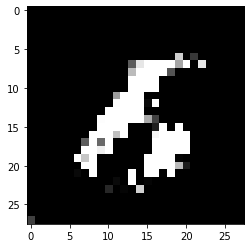

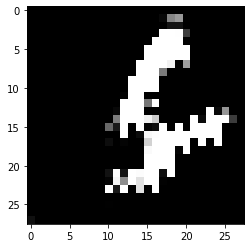

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


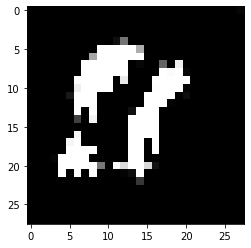

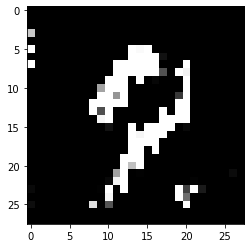

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


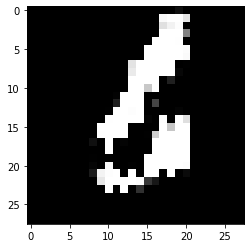

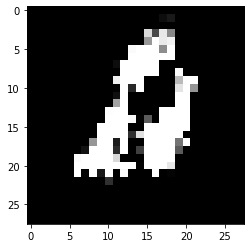

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


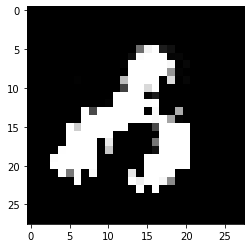

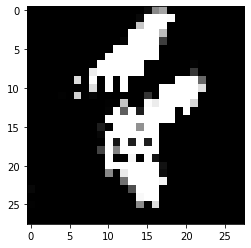

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


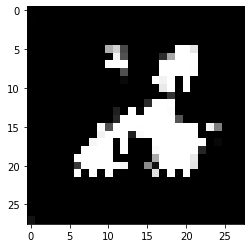

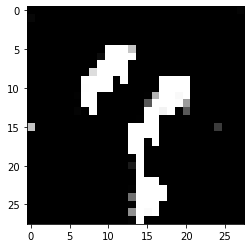

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


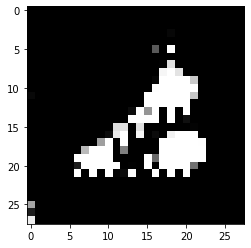

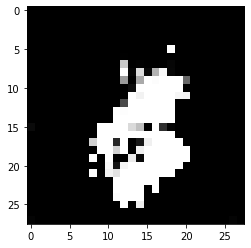

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


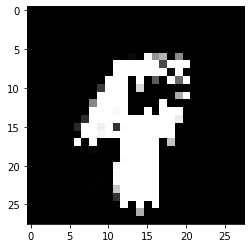

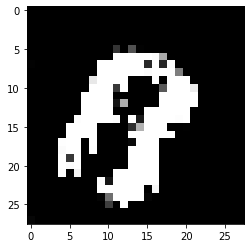

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


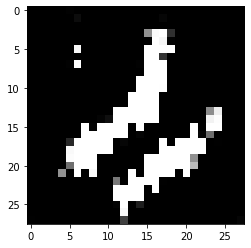

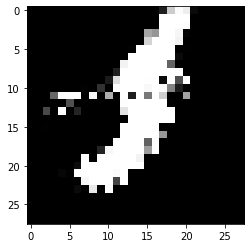

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


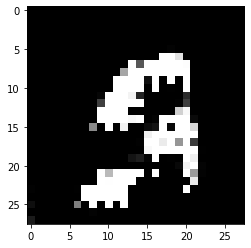

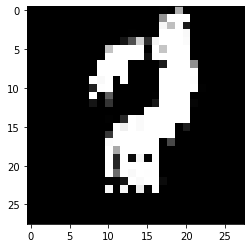

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


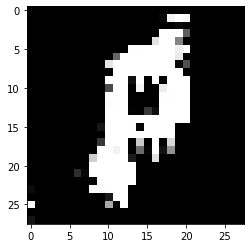

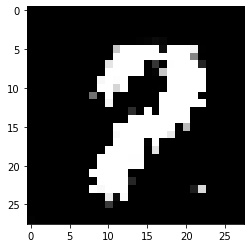

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


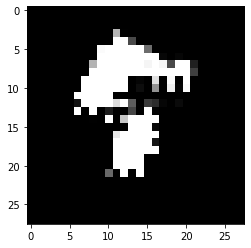

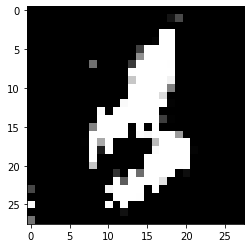

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


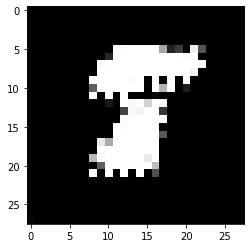

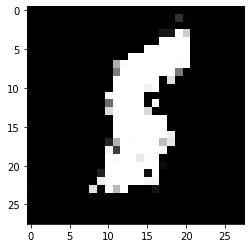

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


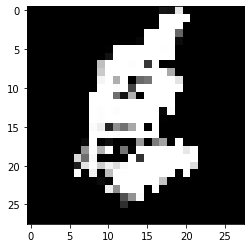

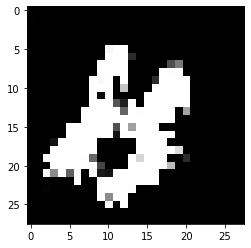

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 30ms/step


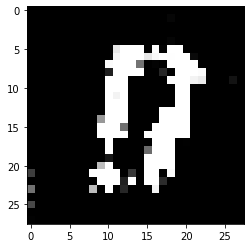

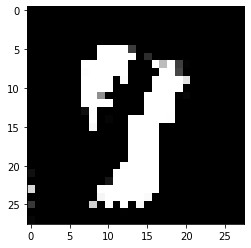

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


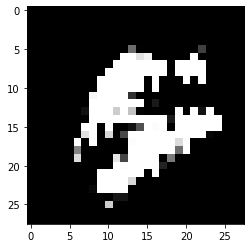

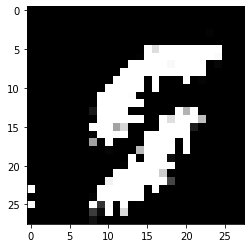

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


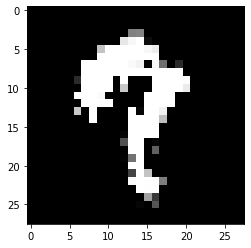

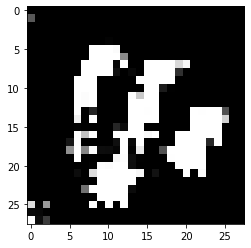

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


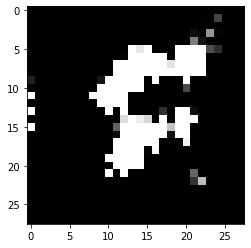

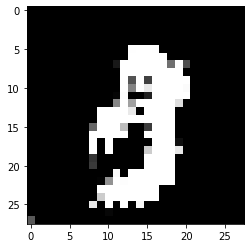

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


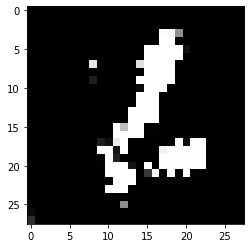

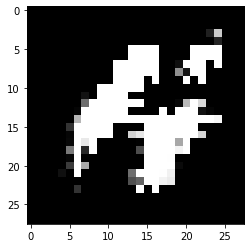

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


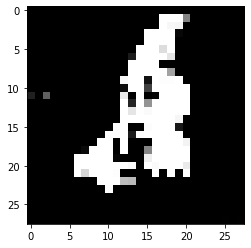

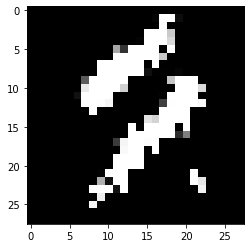

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


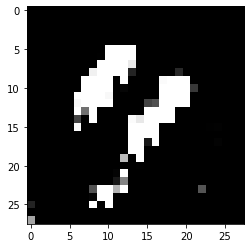

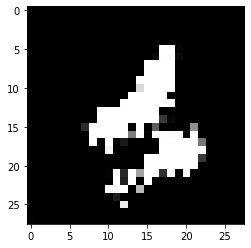

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


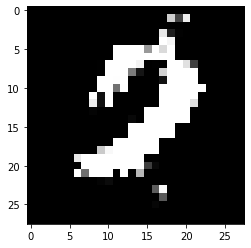

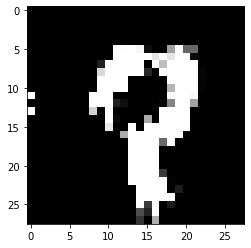

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


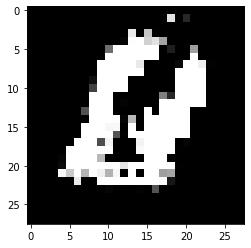

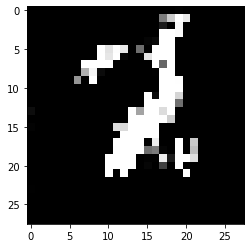

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


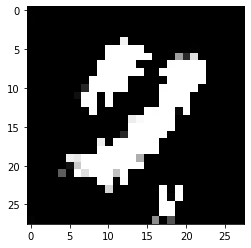

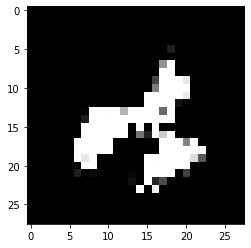

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


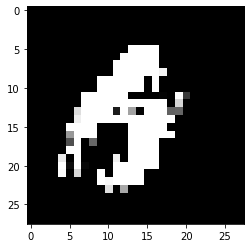

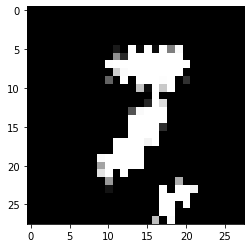

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


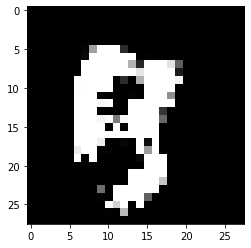

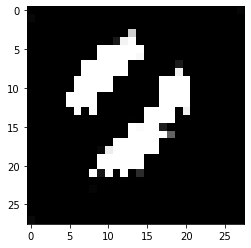

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


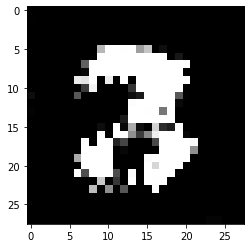

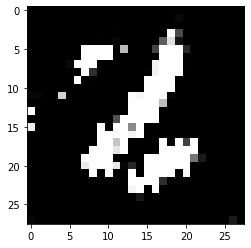

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


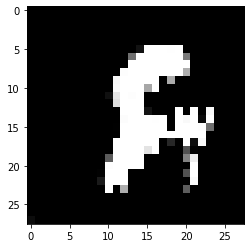

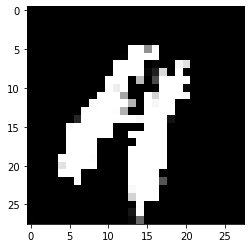

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


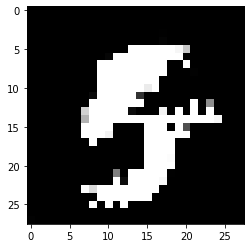

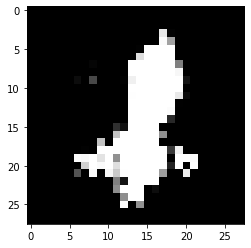

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


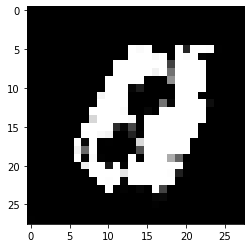

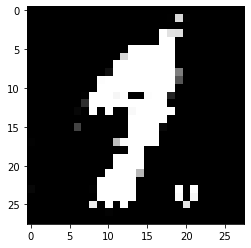

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


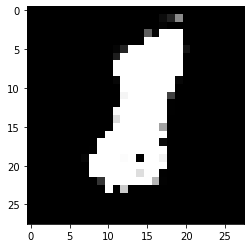

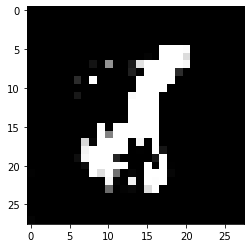

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


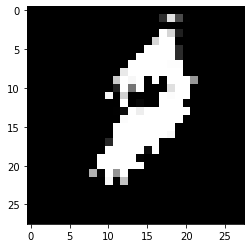

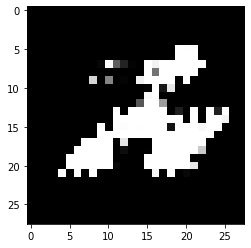

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


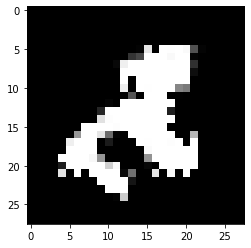

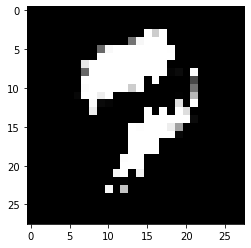

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


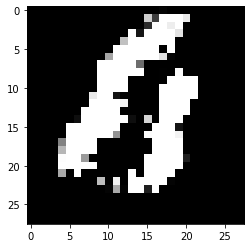

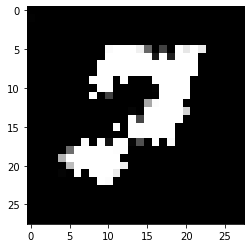

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


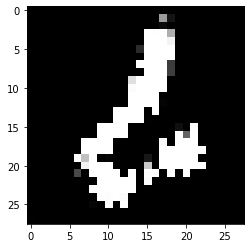

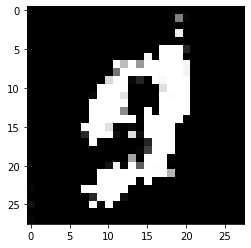

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


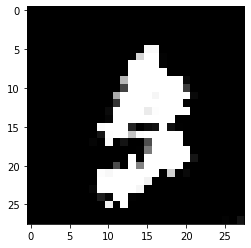

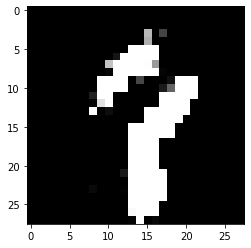

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


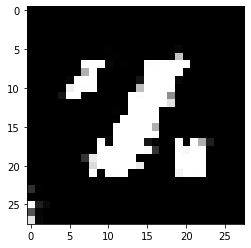

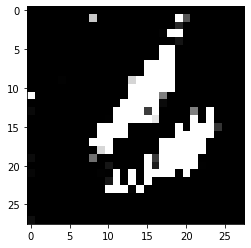

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 30ms/step


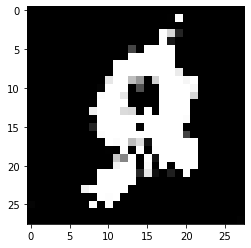

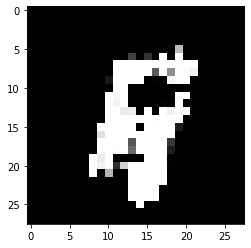

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


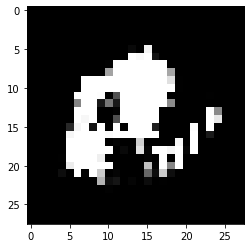

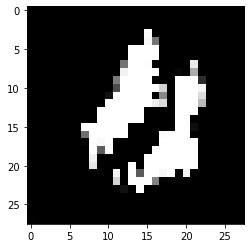

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


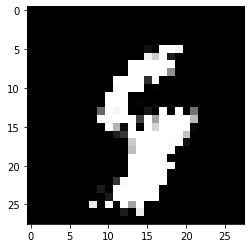

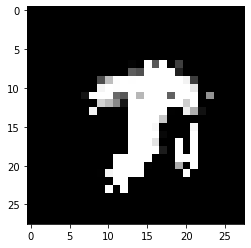

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 34ms/step


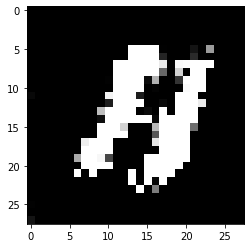

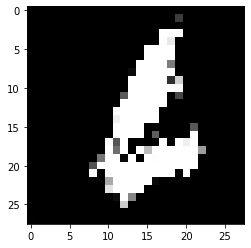

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


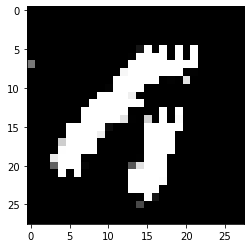

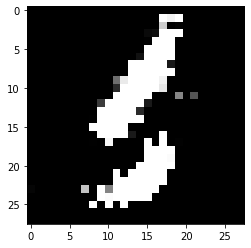

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


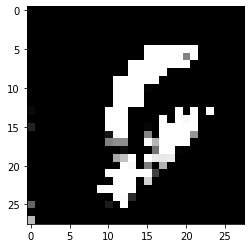

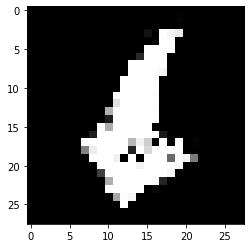

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


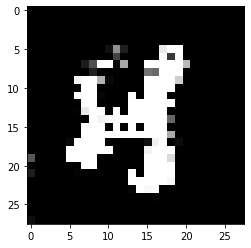

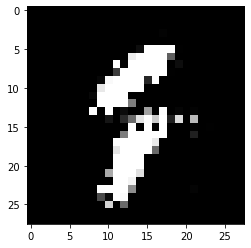

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


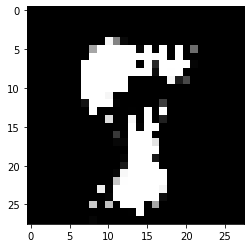

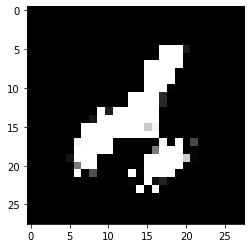

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


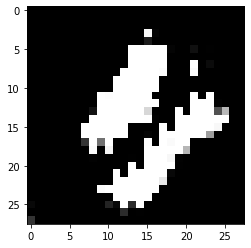

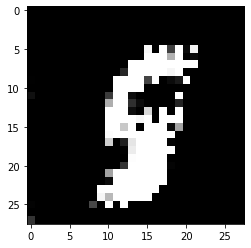

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


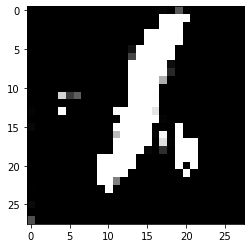

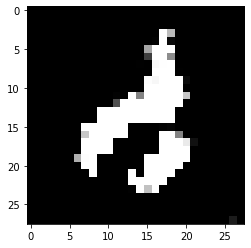

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


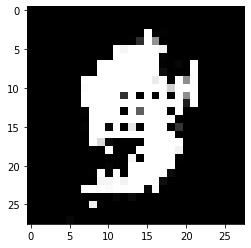

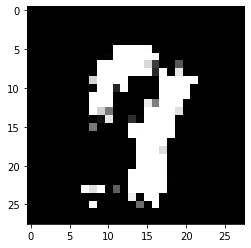

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


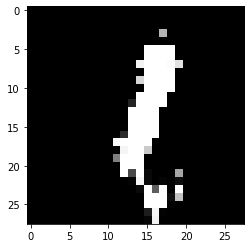

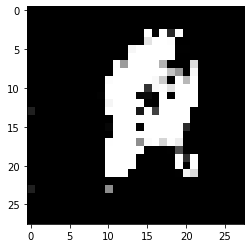

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


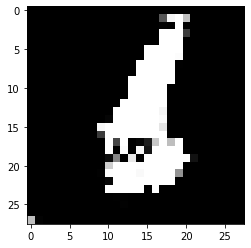

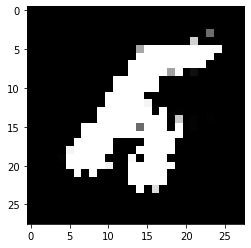

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


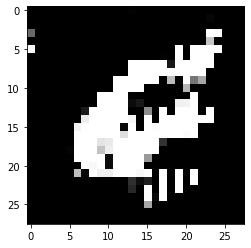

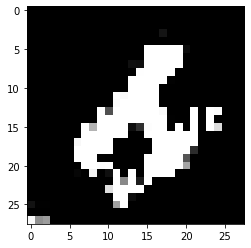

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


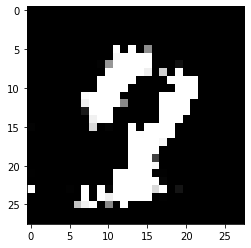

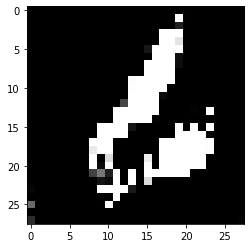

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


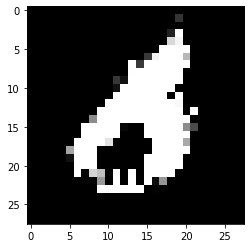

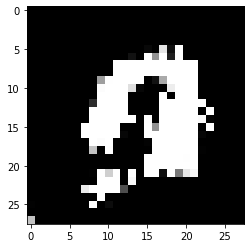

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


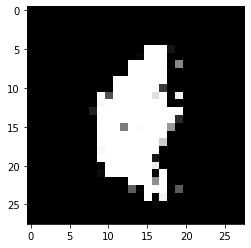

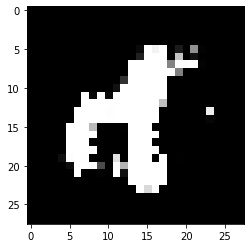

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


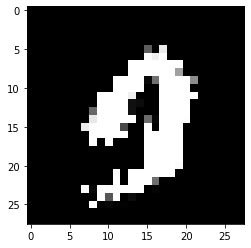

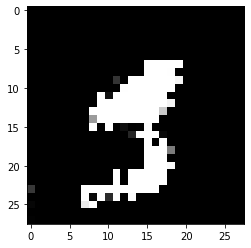

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


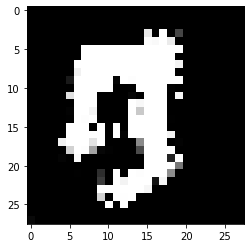

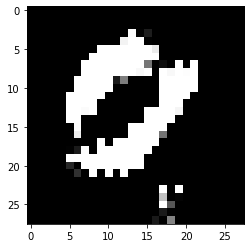

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


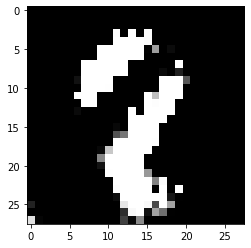

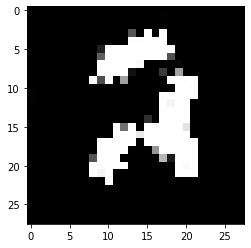

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


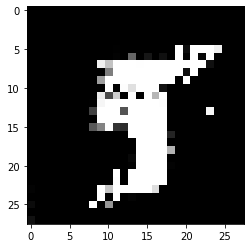

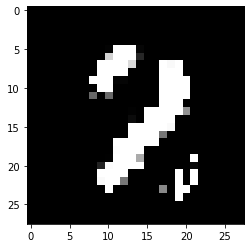

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


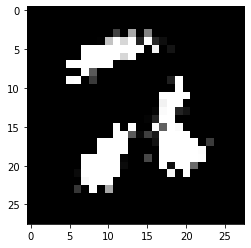

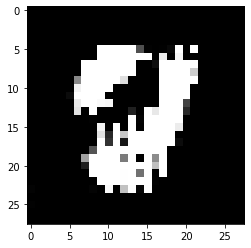

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


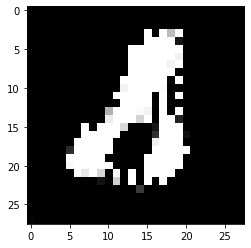

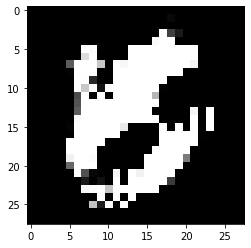

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


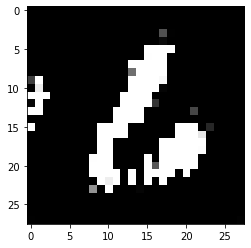

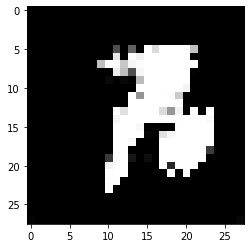

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


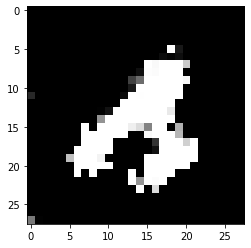

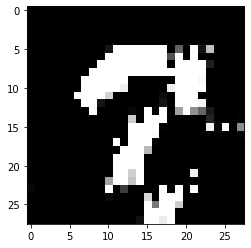

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


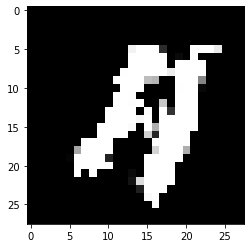

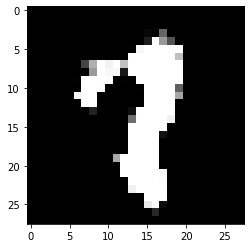

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


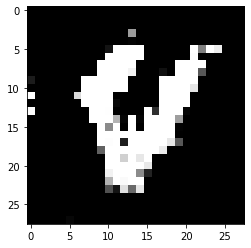

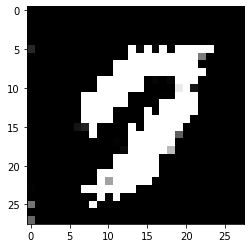

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


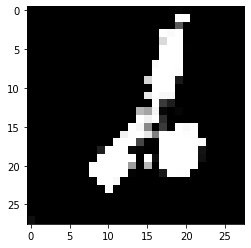

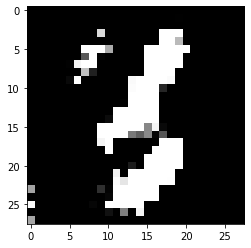

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


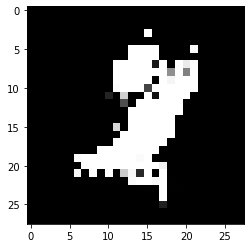

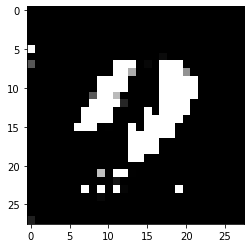

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


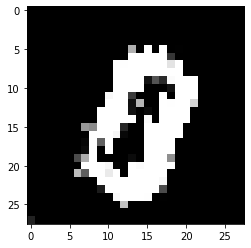

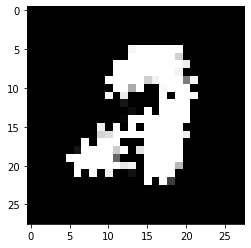

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


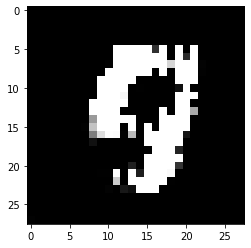

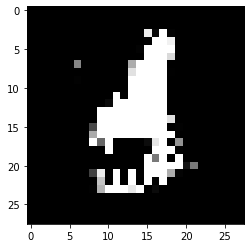

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


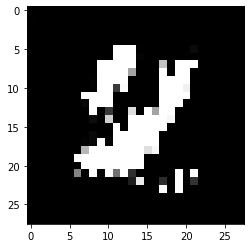

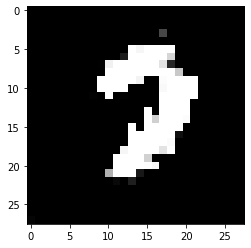

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


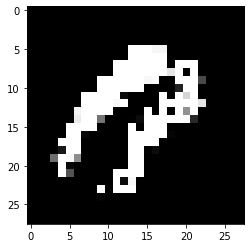

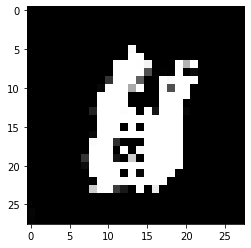

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


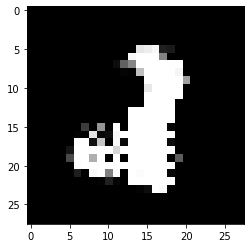

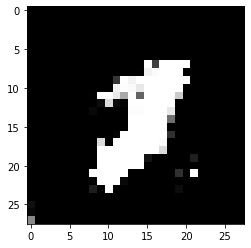

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


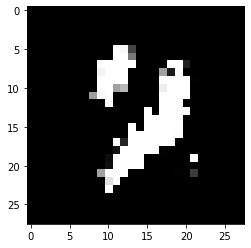

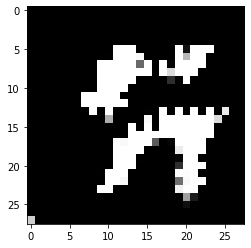

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


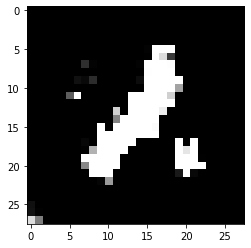

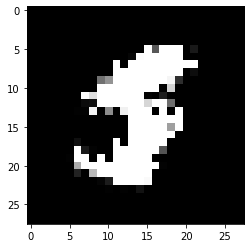

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


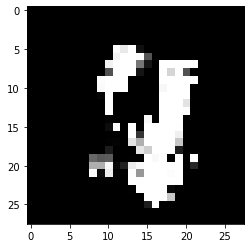

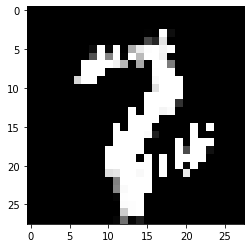

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


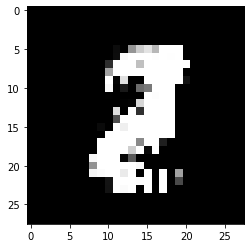

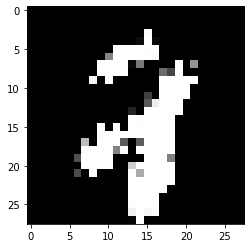

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


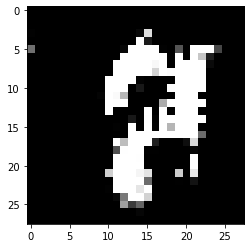

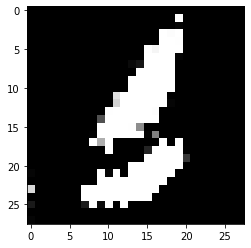

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


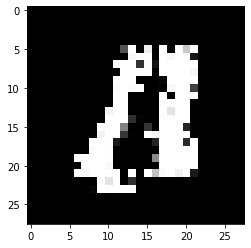

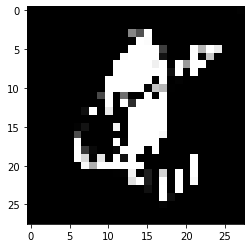

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


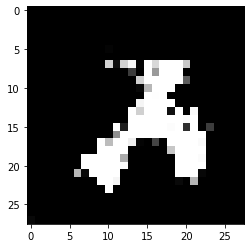

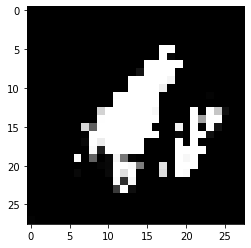

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


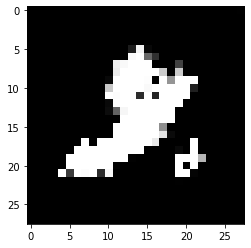

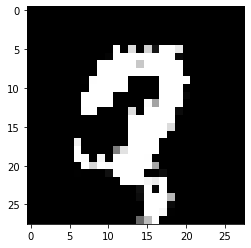

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


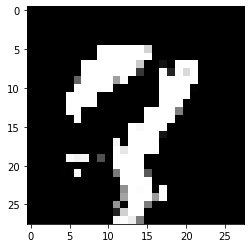

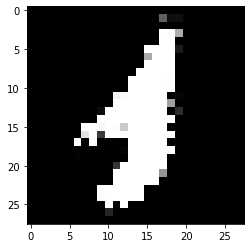

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


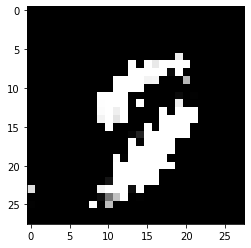

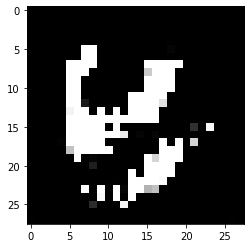

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


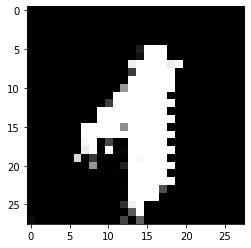

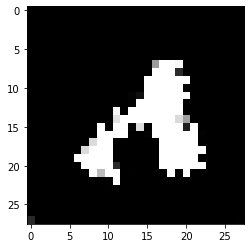

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


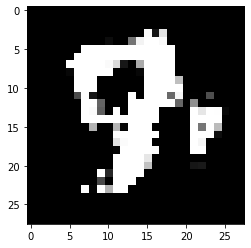

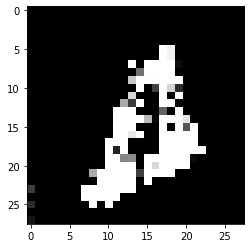

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


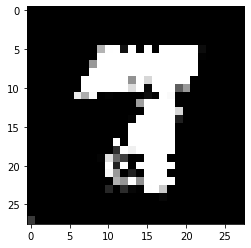

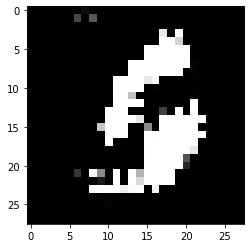

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


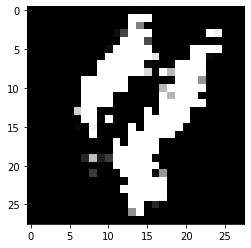

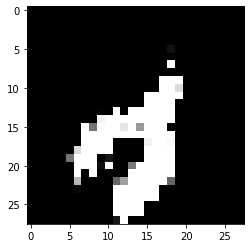

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


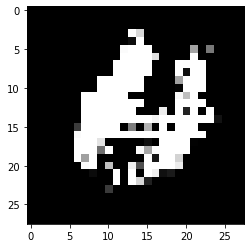

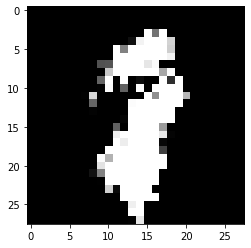

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


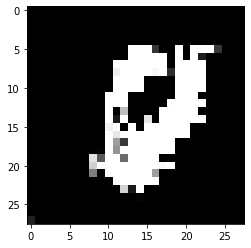

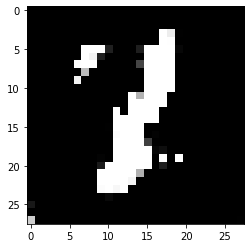

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


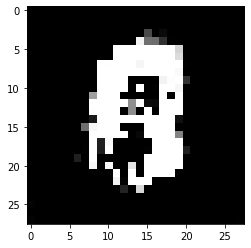

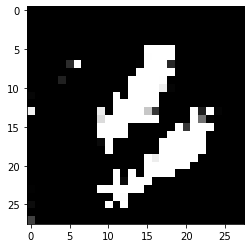

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


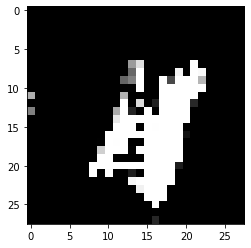

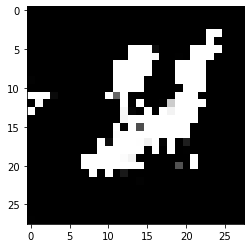

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


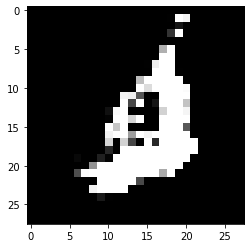

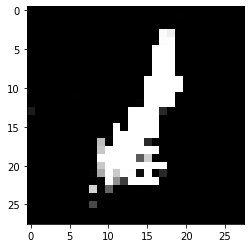

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


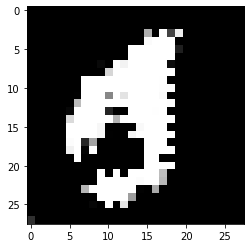

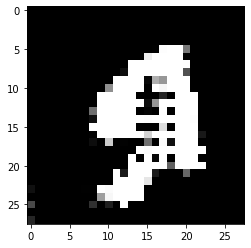

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


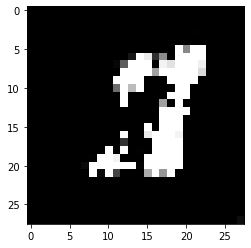

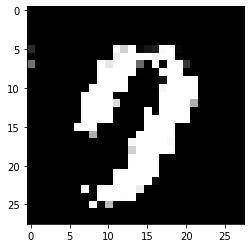

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


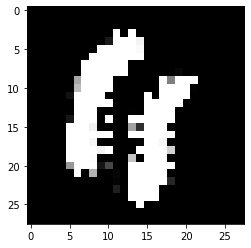

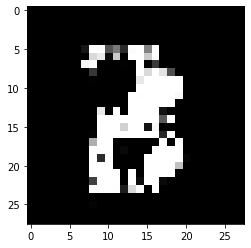

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


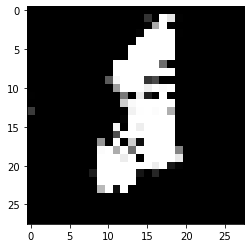

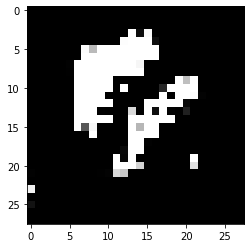

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


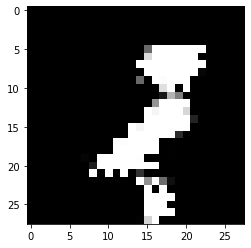

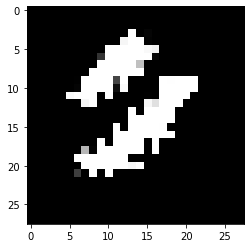

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


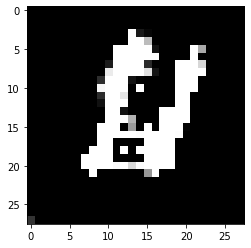

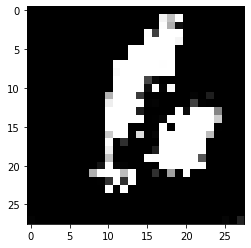

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


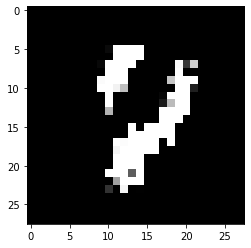

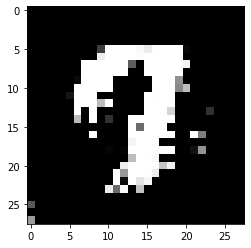

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


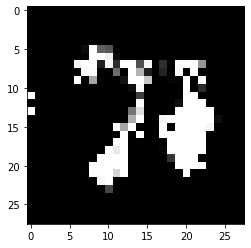

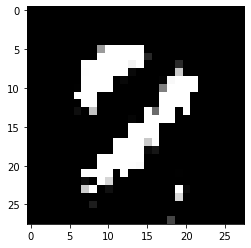

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


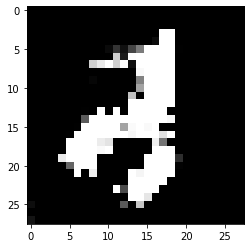

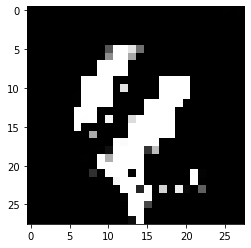

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


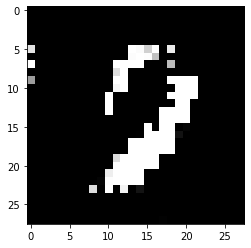

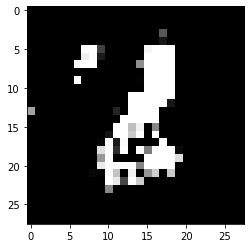

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


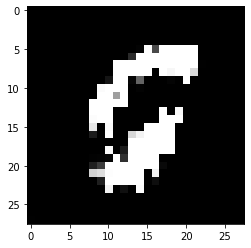

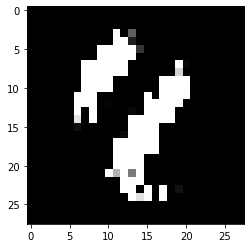

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


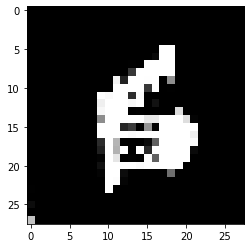

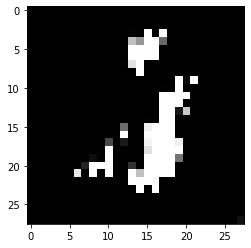

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


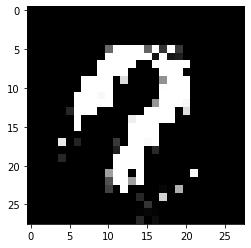

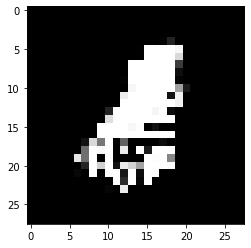

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


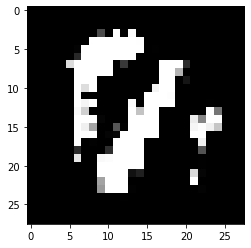

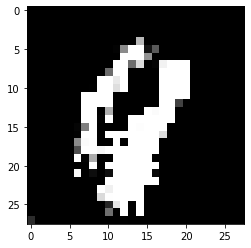

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


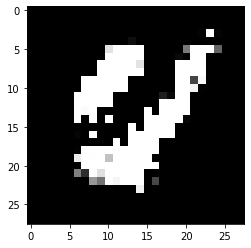

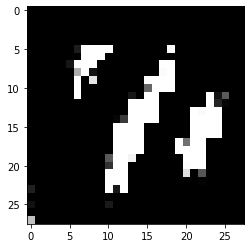

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


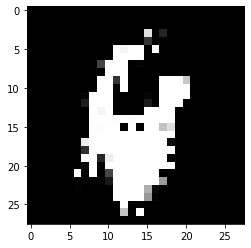

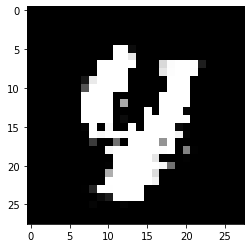

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


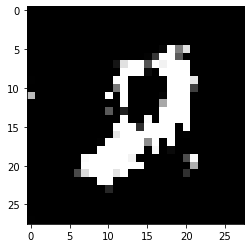

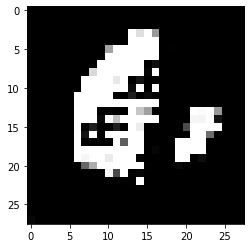

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


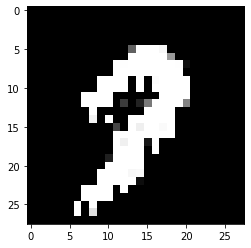

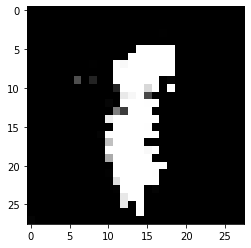

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


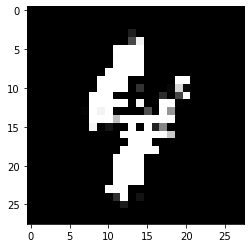

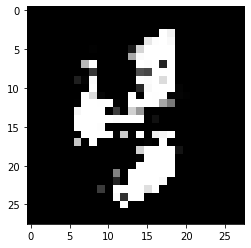

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


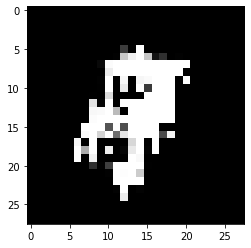

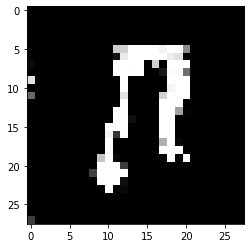

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


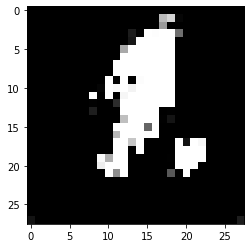

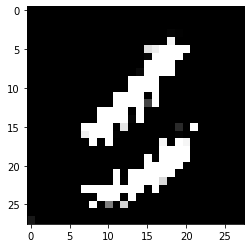

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


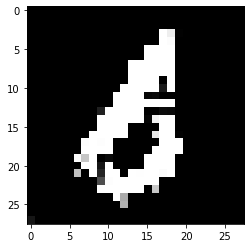

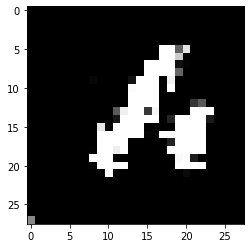

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


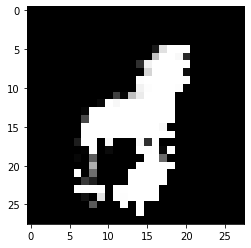

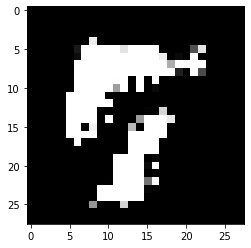

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


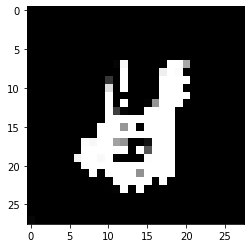

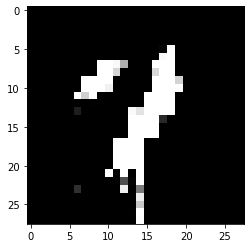

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


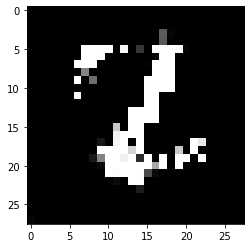

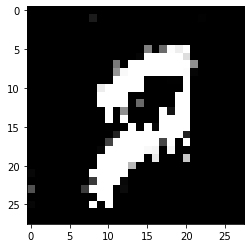

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


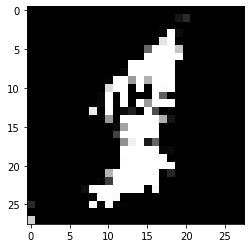

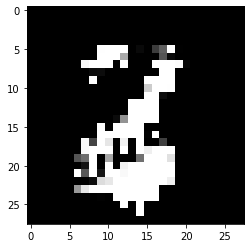

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


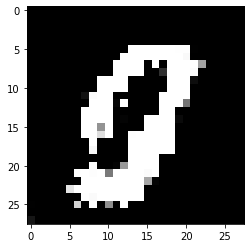

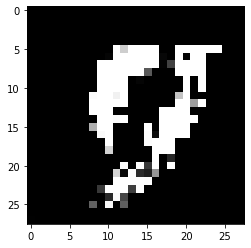

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


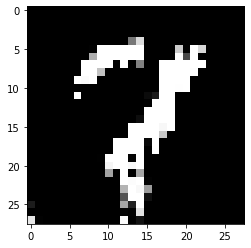

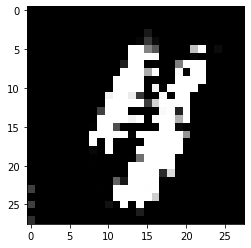

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


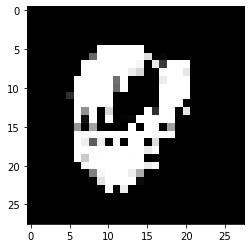

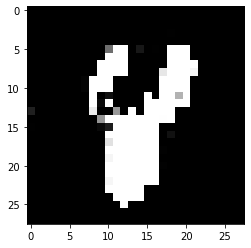

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


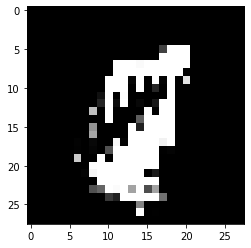

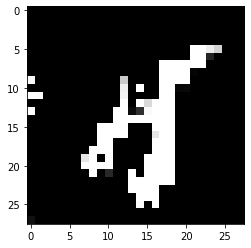

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


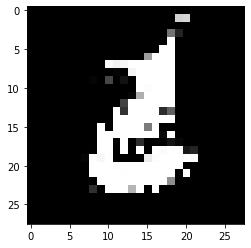

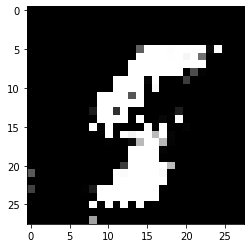

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 29ms/step


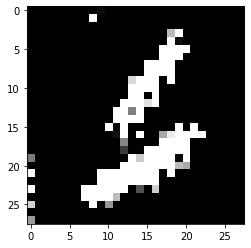

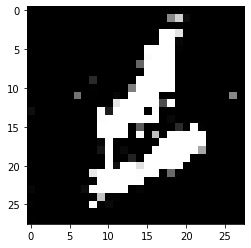

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


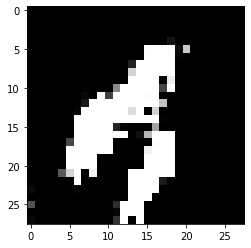

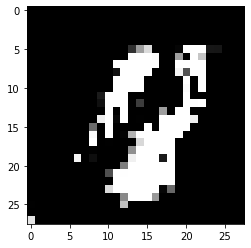

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


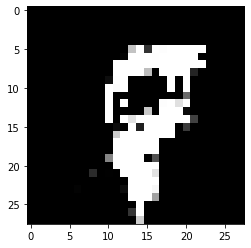

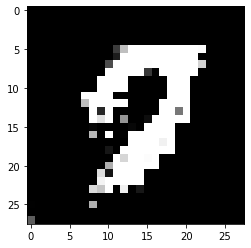

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


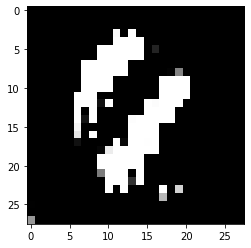

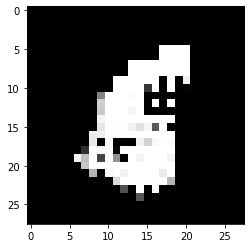

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


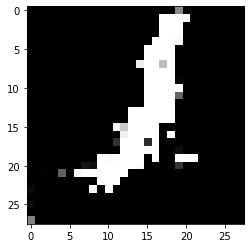

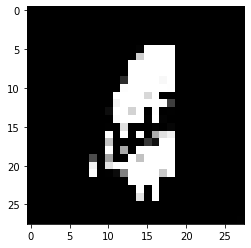

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


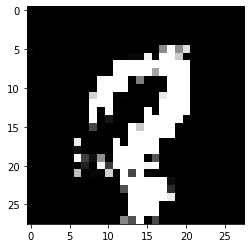

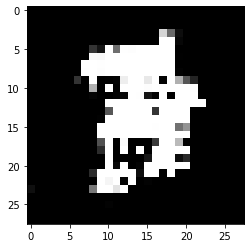

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


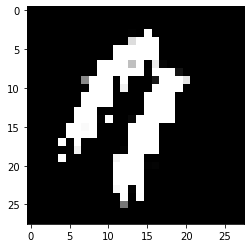

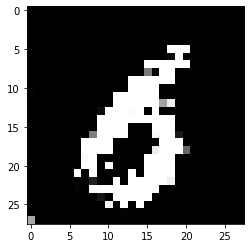

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


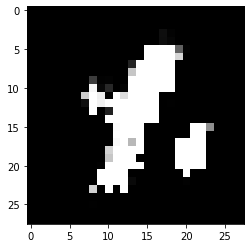

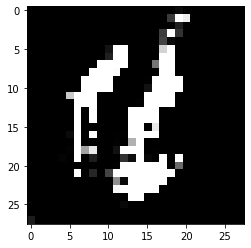

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


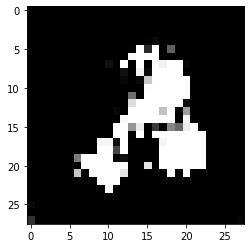

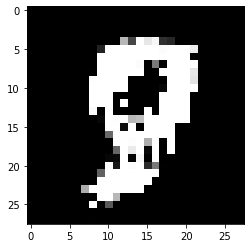

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


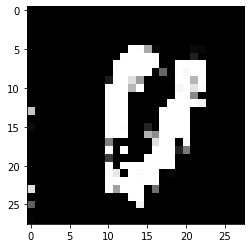

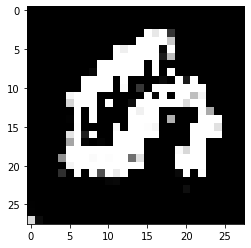

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


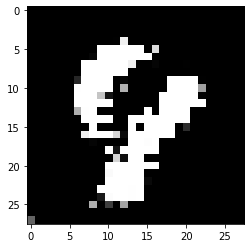

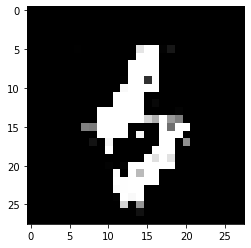

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


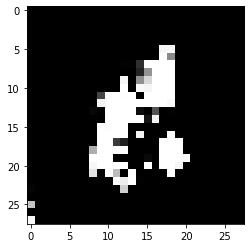

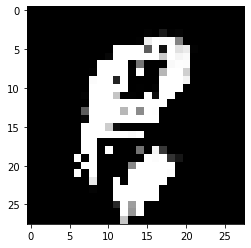

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


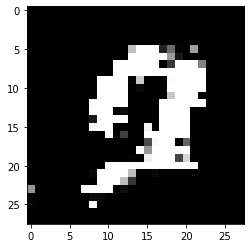

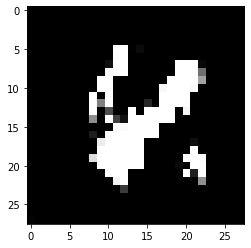

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


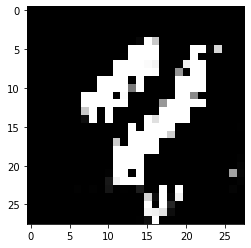

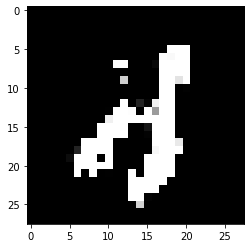

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


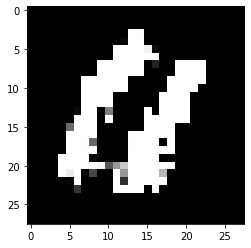

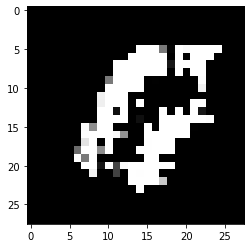

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


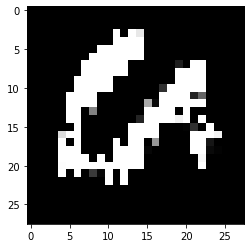

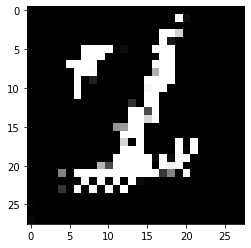

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


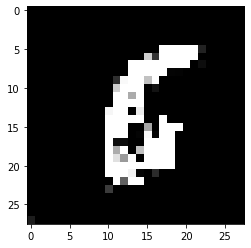

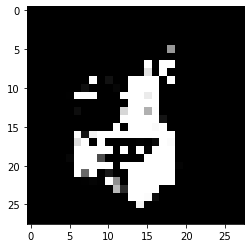

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


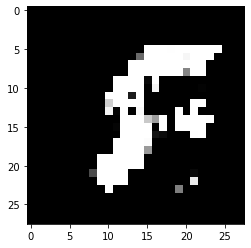

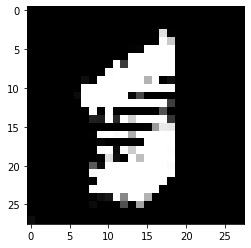

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


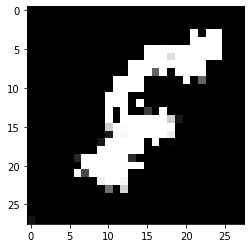

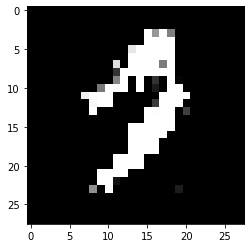

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


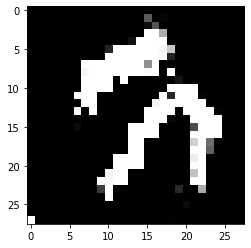

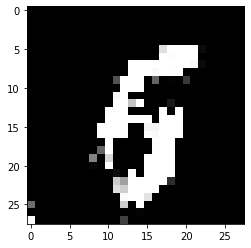

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


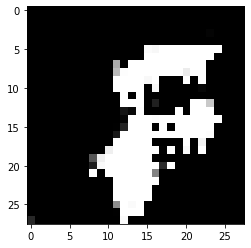

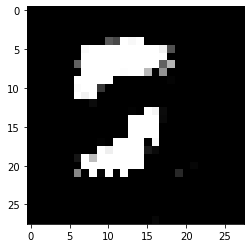

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


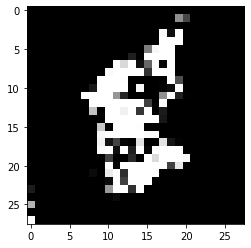

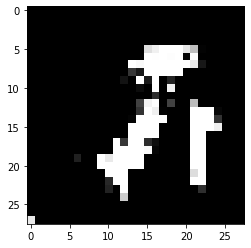

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


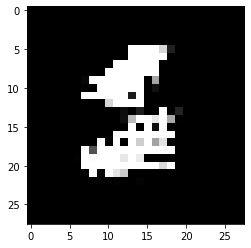

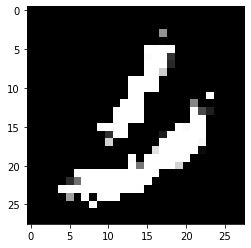

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


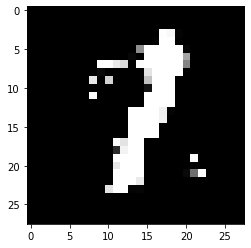

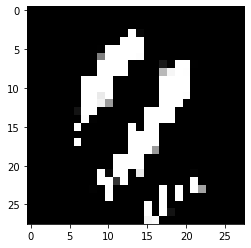

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


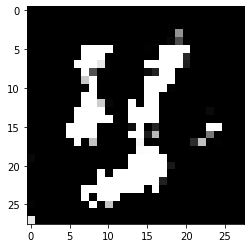

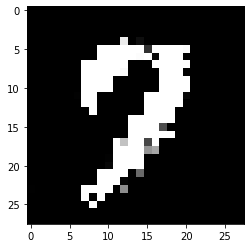

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


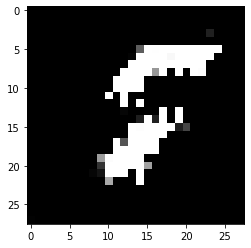

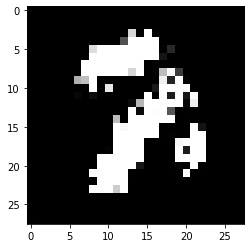

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


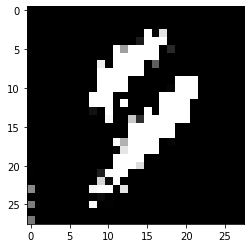

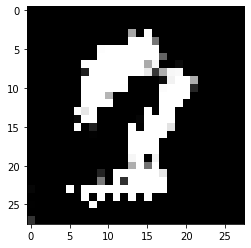

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


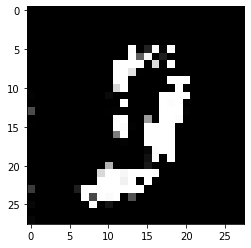

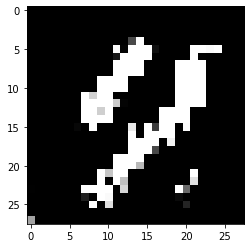

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 30ms/step


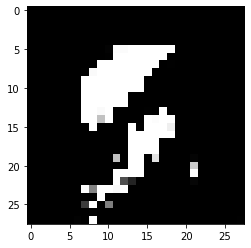

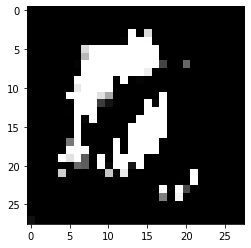

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


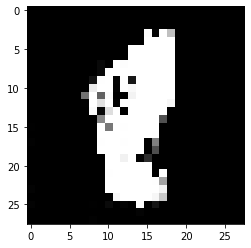

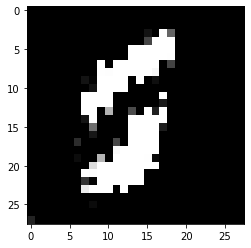

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


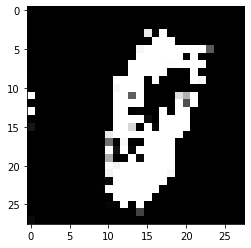

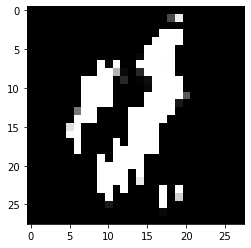

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


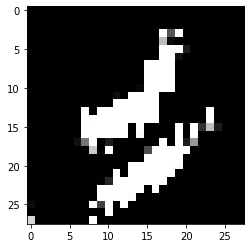

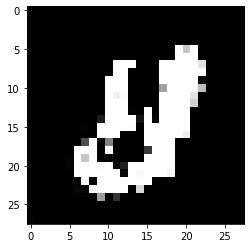

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


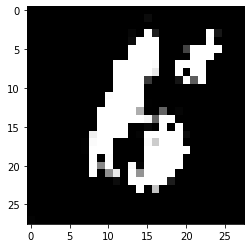

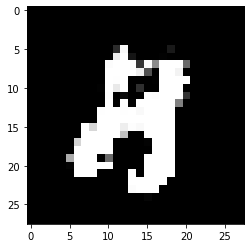

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


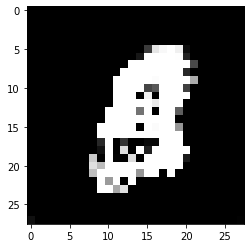

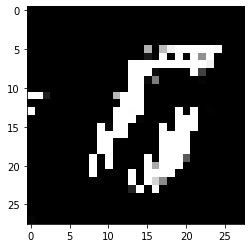

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


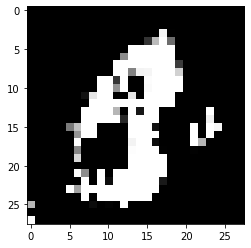

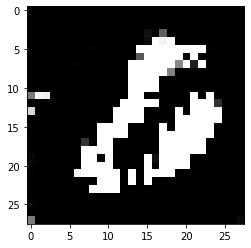

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


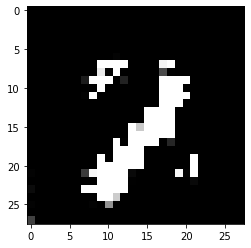

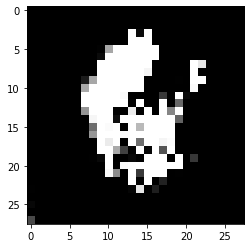

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


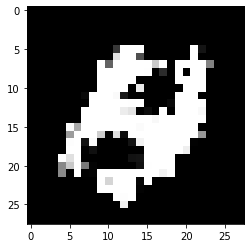

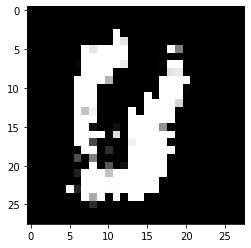

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


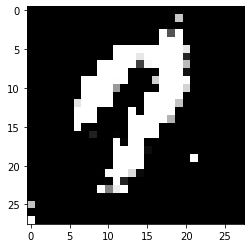

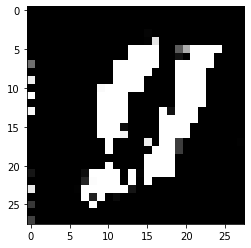

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


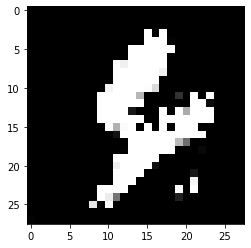

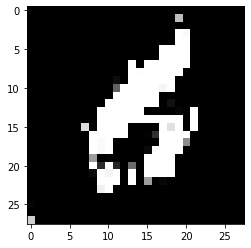

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


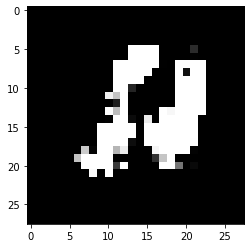

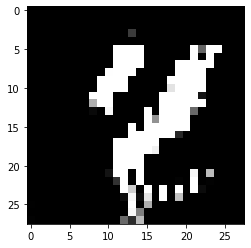

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


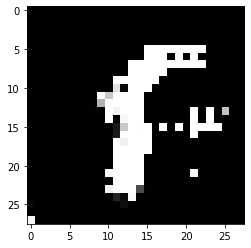

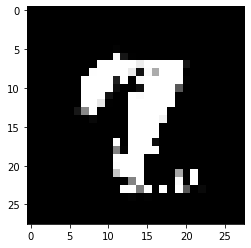

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


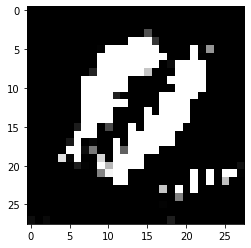

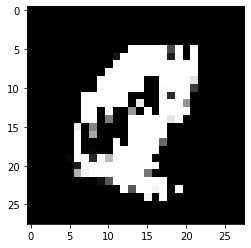

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


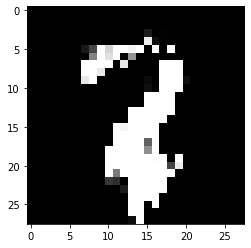

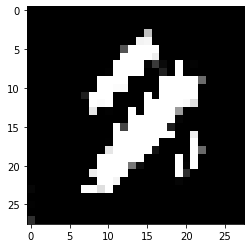

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


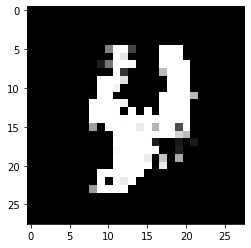

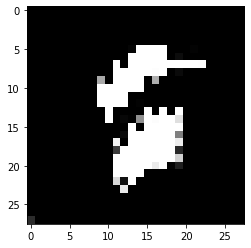

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


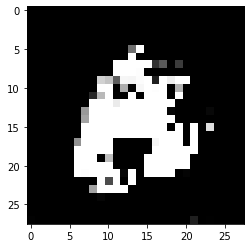

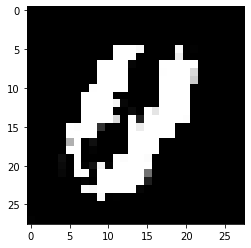

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


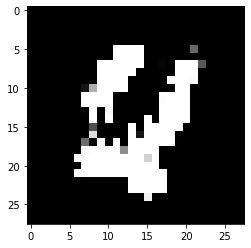

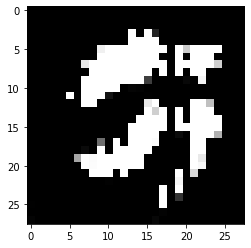

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


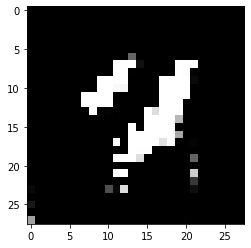

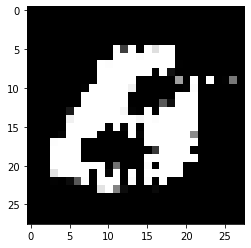

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


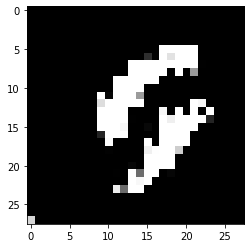

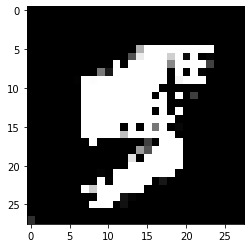

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


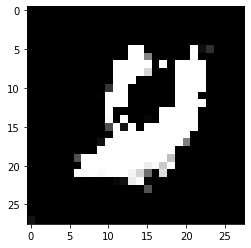

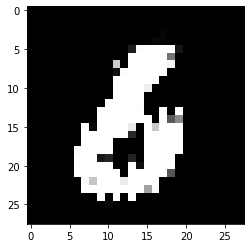

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


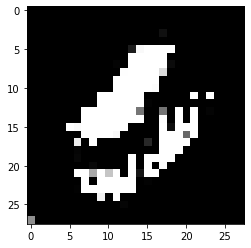

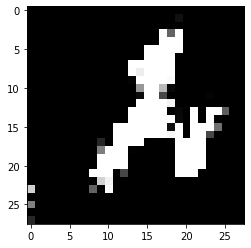

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


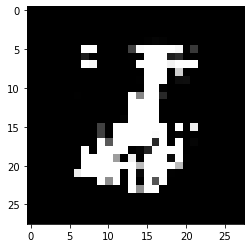

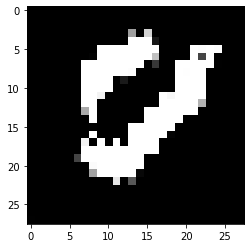

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


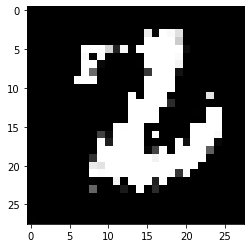

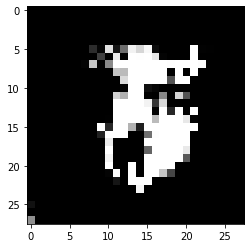

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


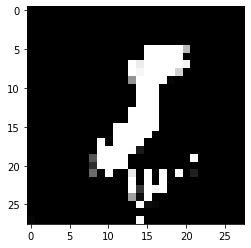

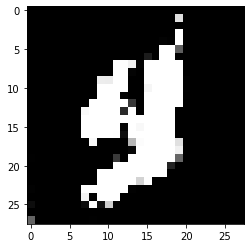

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


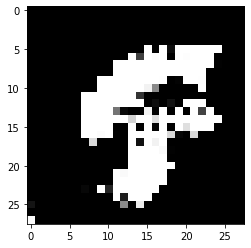

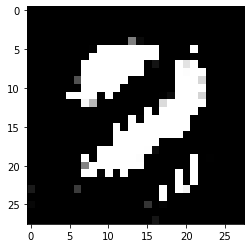

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


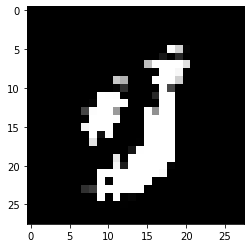

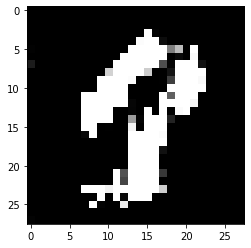

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


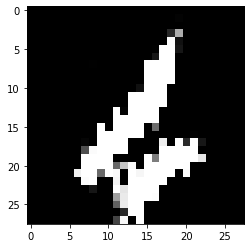

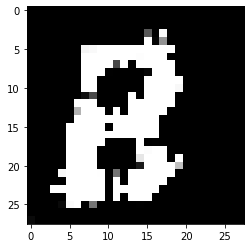

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


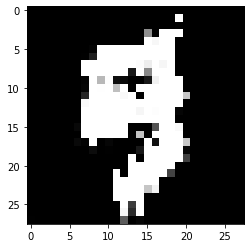

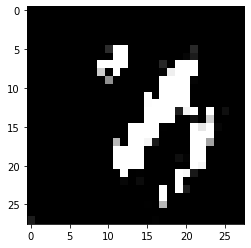

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


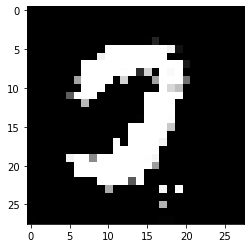

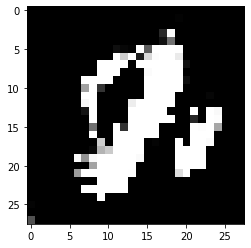

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


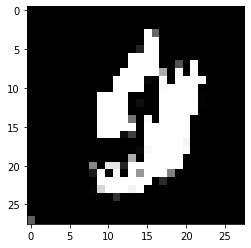

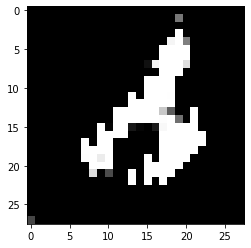

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


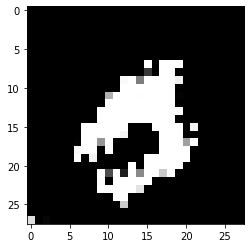

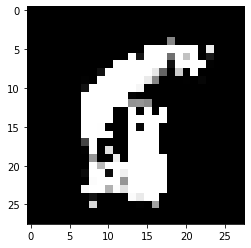

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


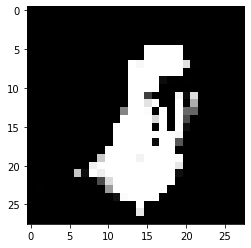

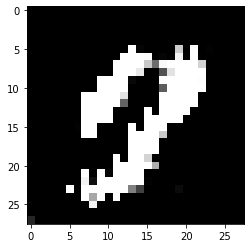

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


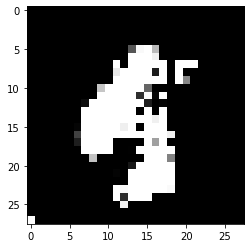

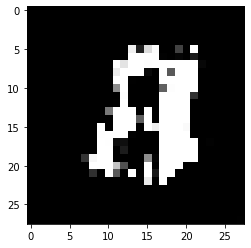

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


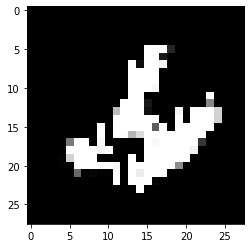

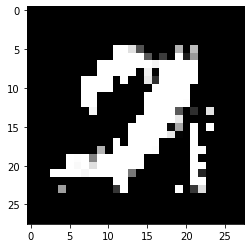

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


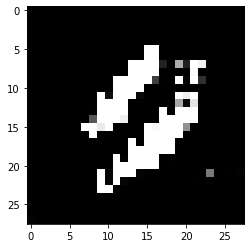

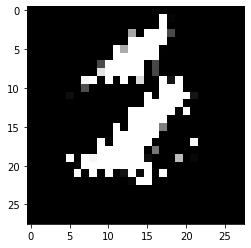

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


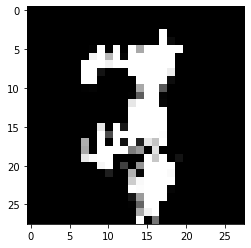

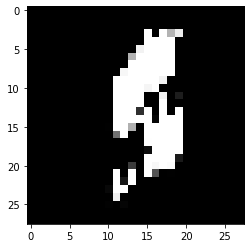

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


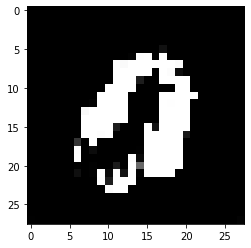

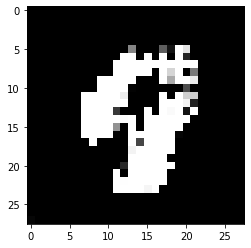

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


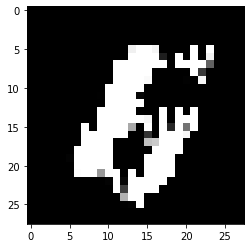

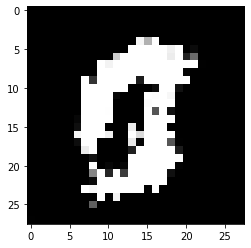

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


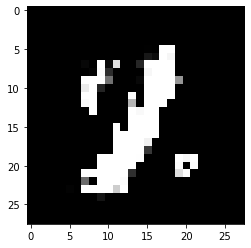

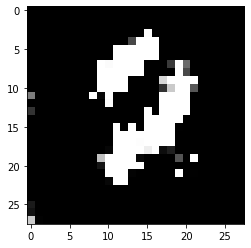

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


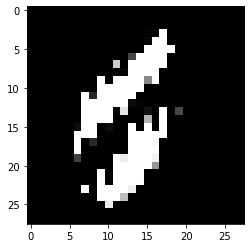

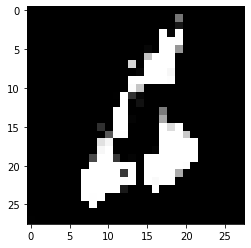

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


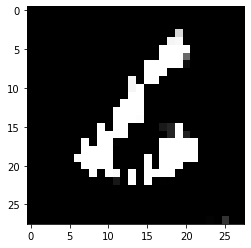

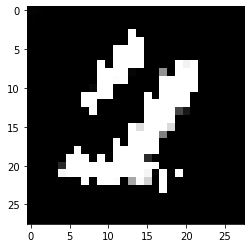

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


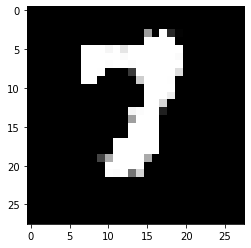

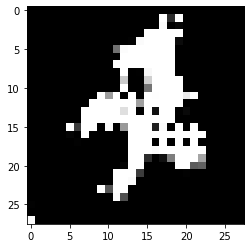

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


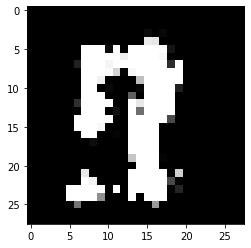

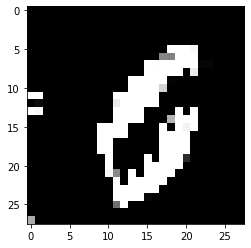

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


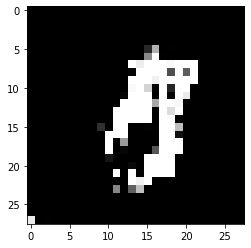

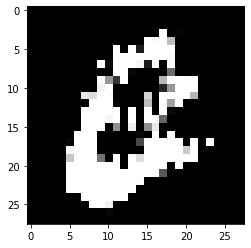

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


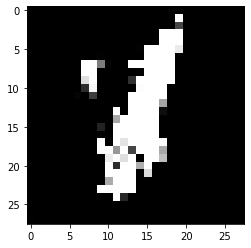

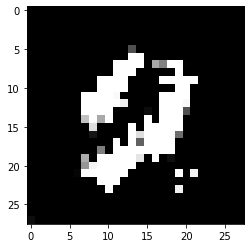

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


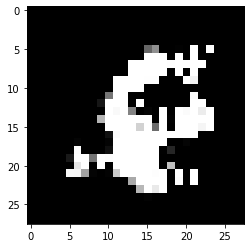

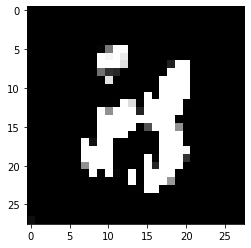

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


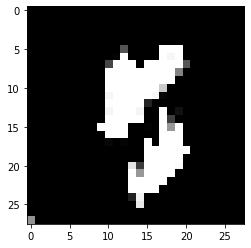

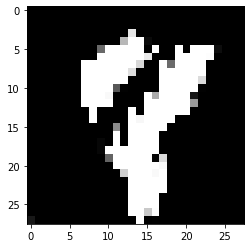

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


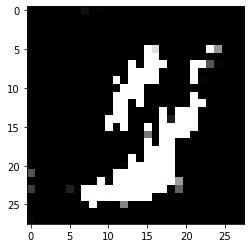

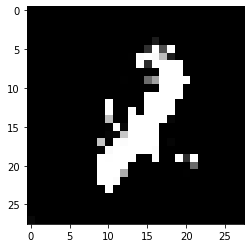

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


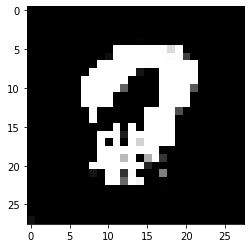

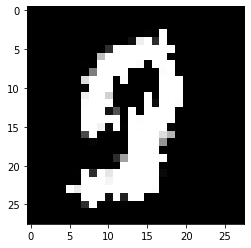

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 29ms/step


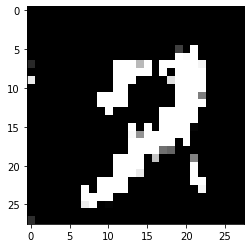

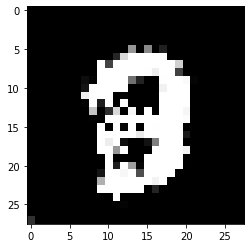

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


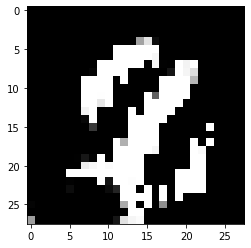

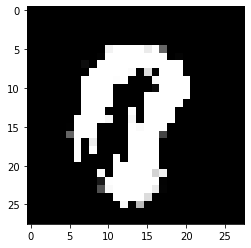

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


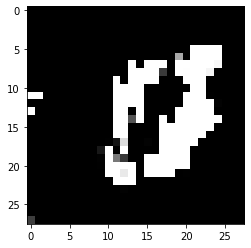

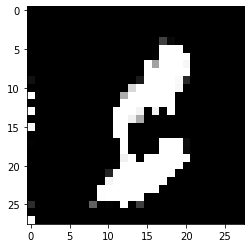

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


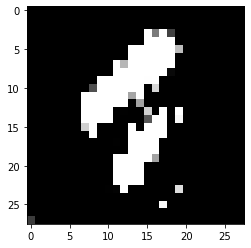

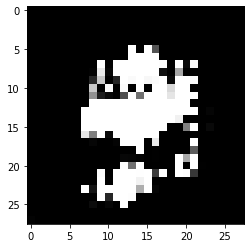

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


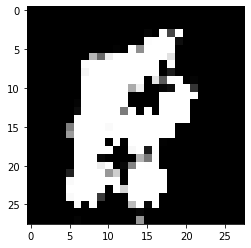

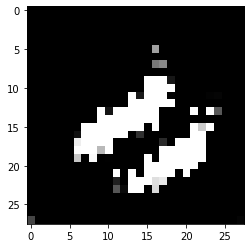

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


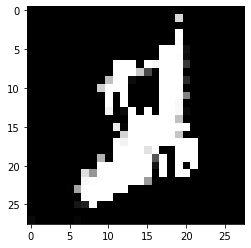

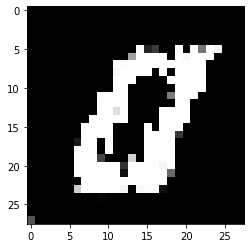

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


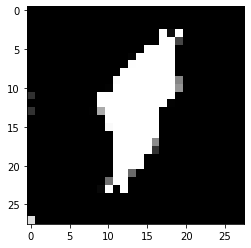

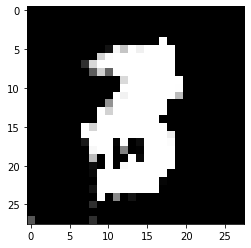

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


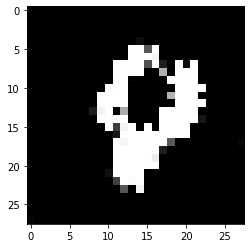

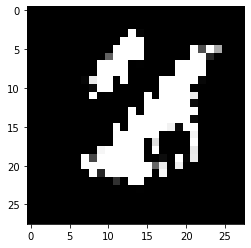

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


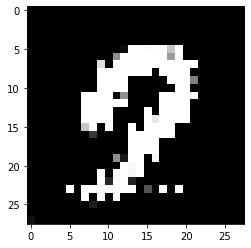

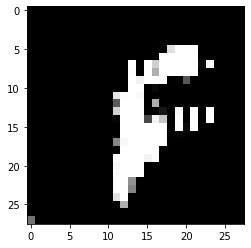

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


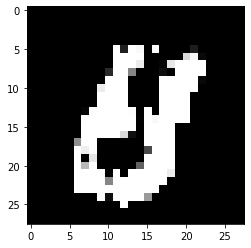

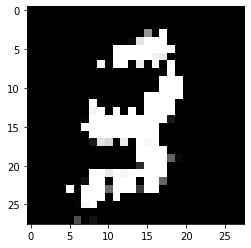

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


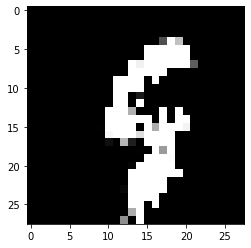

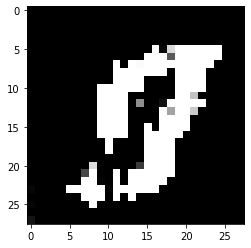

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


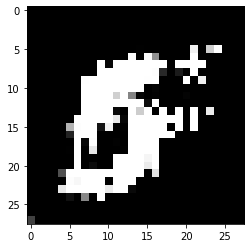

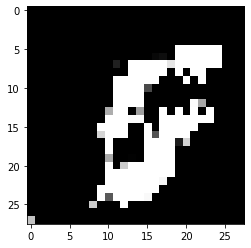

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


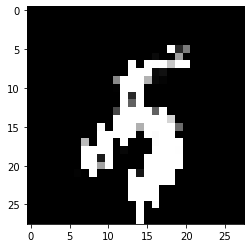

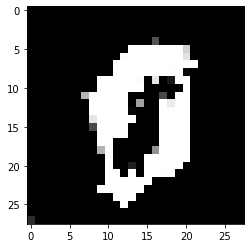

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


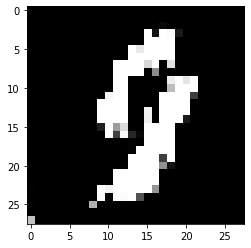

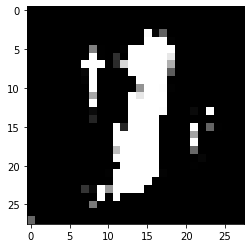

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


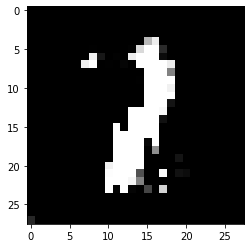

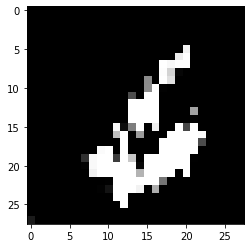

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


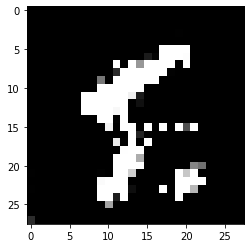

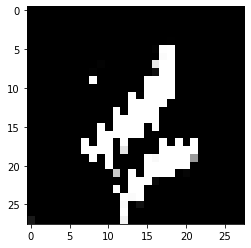

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


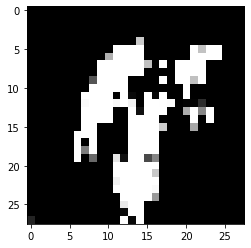

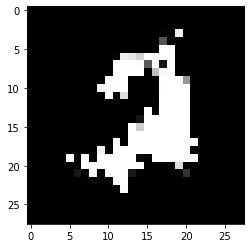

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


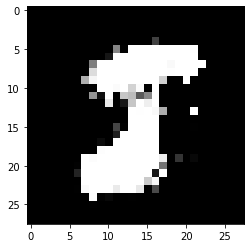

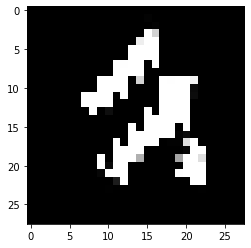

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


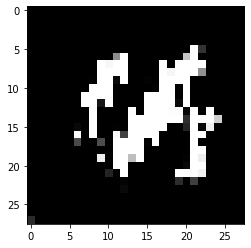

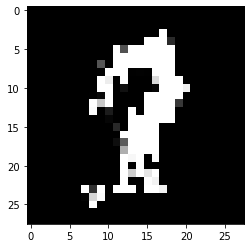

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


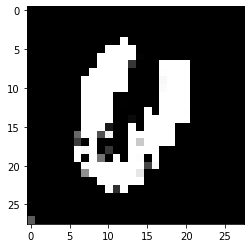

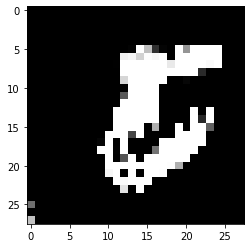

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 29ms/step


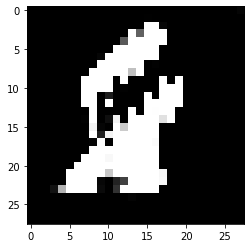

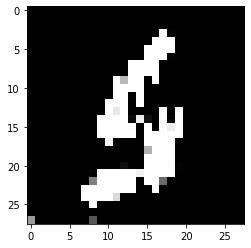

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


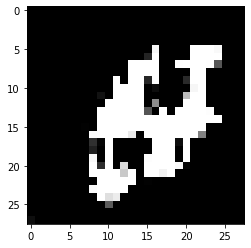

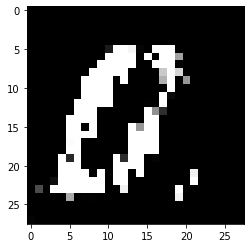

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


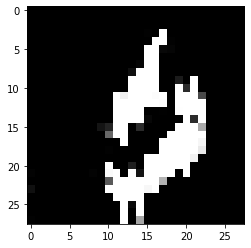

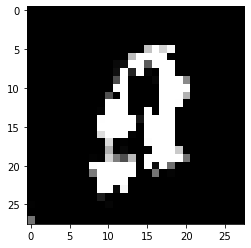

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


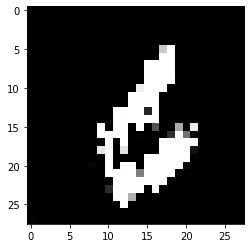

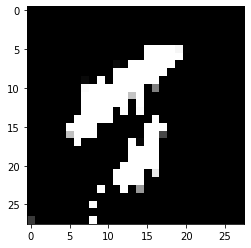

train discriminator:
True
True
4/4 [==============================] - 0s 7ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


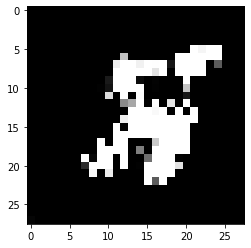

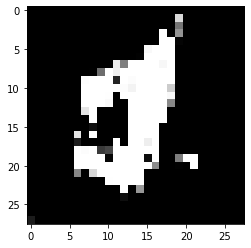

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


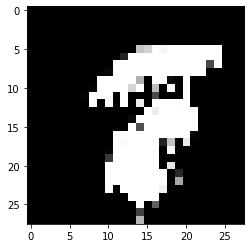

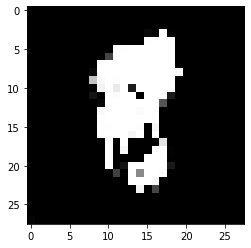

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 28ms/step


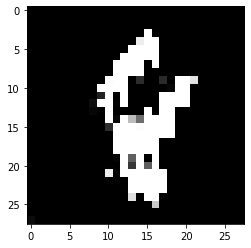

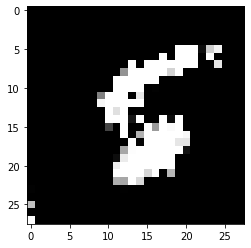

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


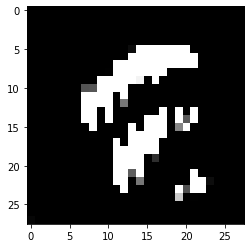

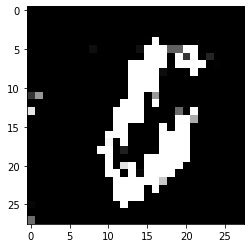

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


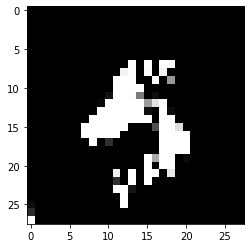

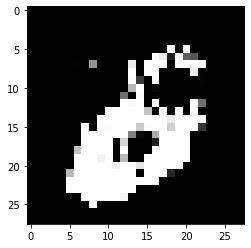

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


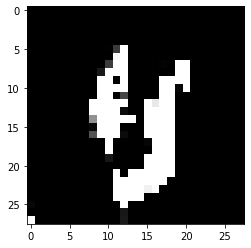

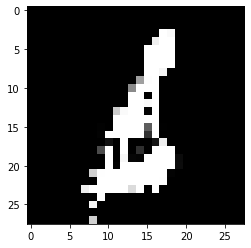

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


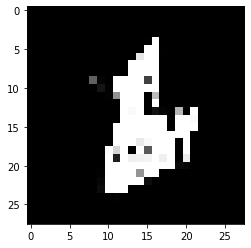

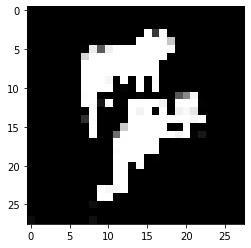

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


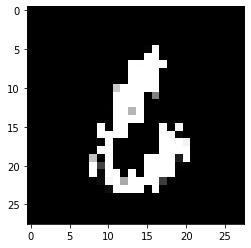

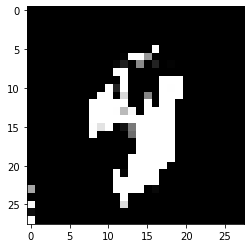

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


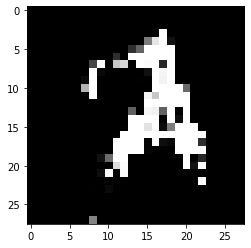

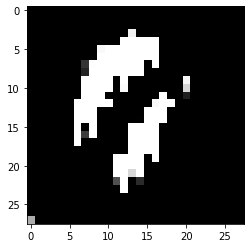

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


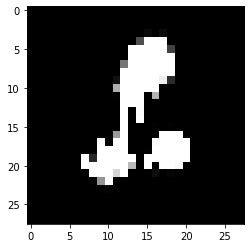

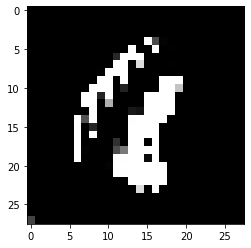

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


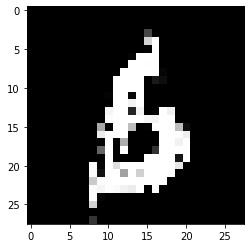

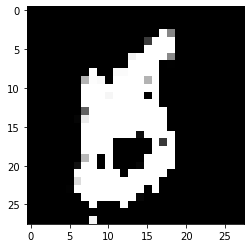

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


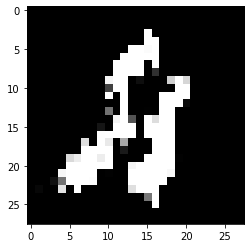

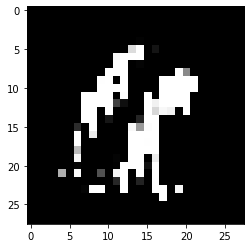

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


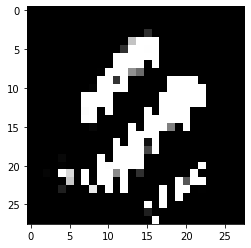

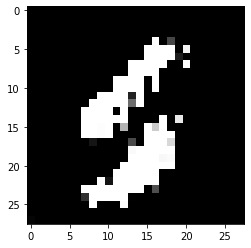

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


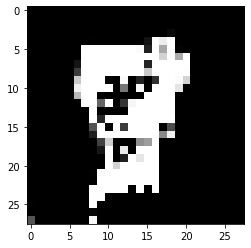

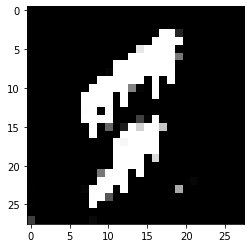

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


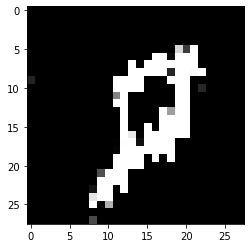

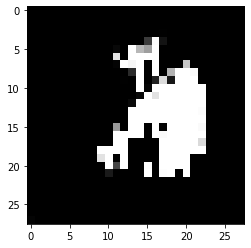

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


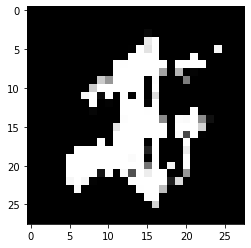

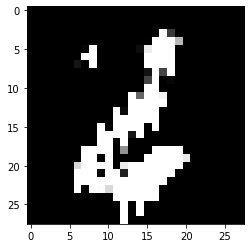

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


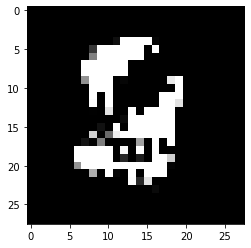

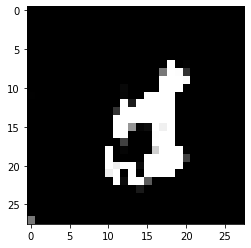

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


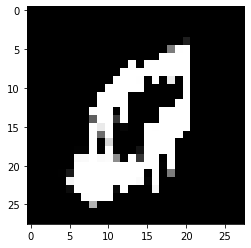

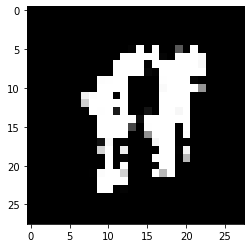

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


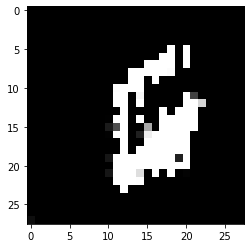

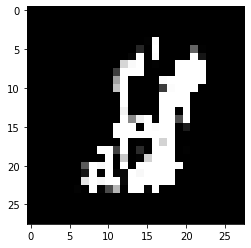

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


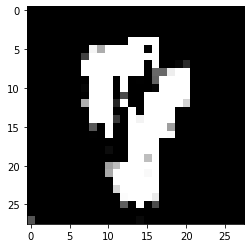

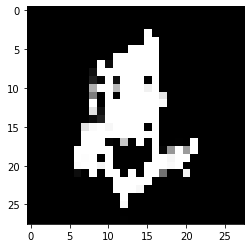

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


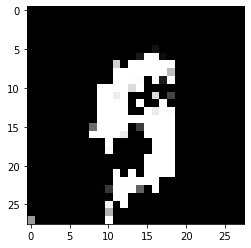

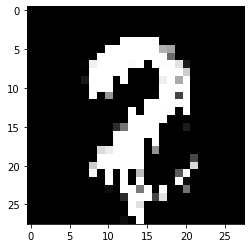

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


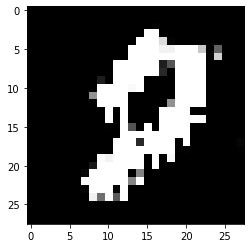

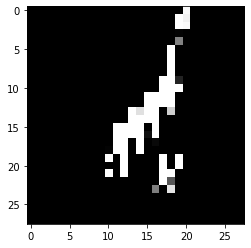

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


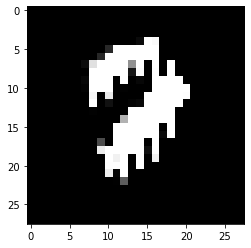

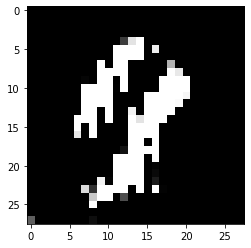

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


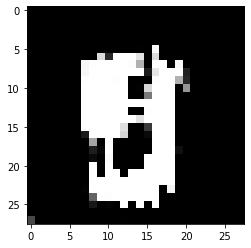

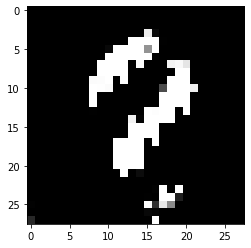

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


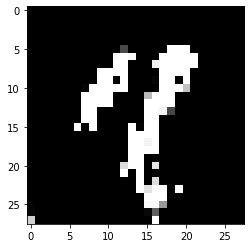

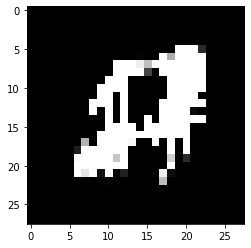

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


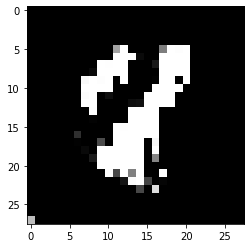

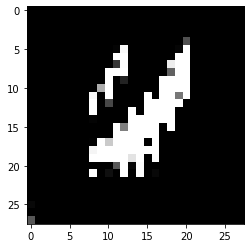

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


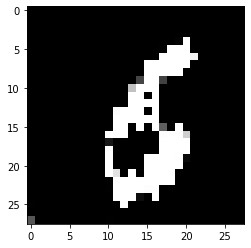

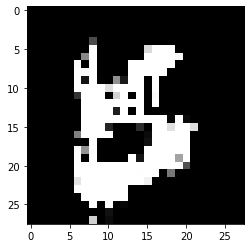

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


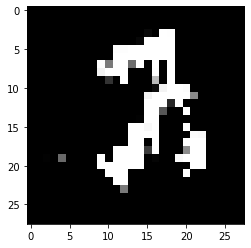

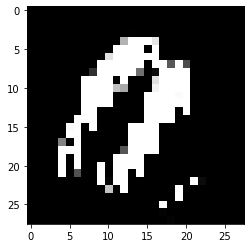

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 28ms/step


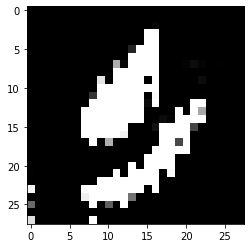

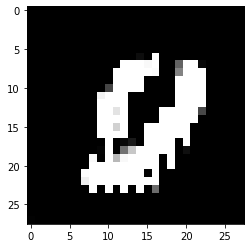

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


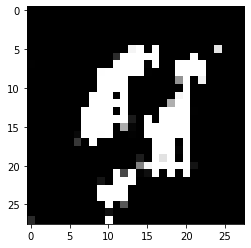

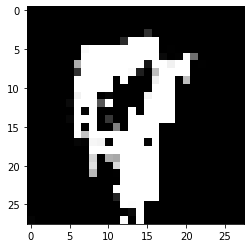

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


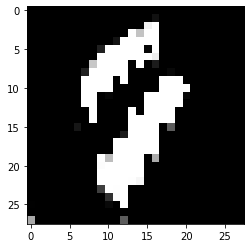

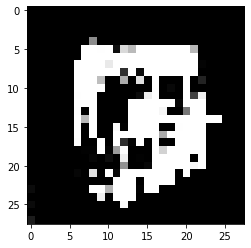

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


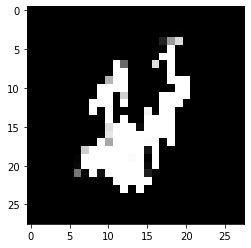

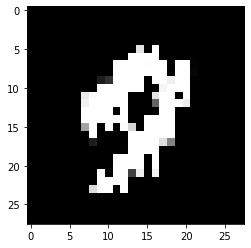

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


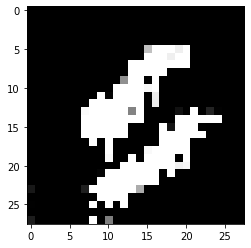

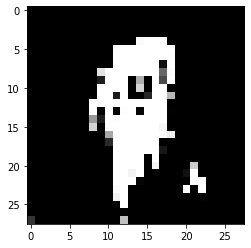

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


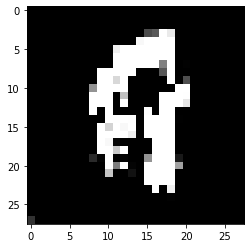

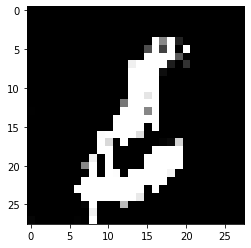

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


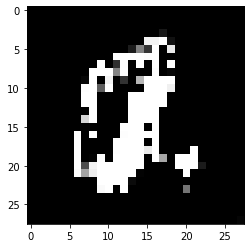

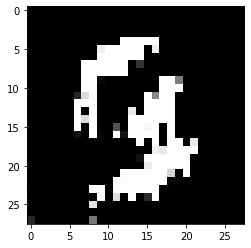

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


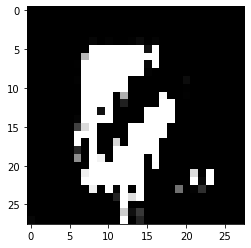

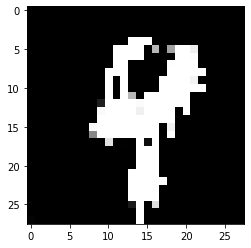

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


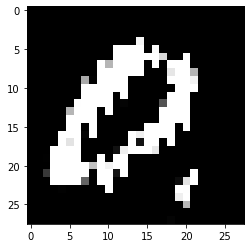

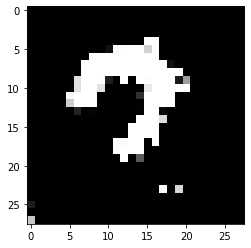

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


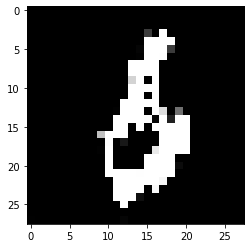

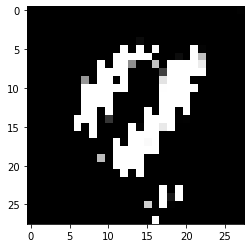

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


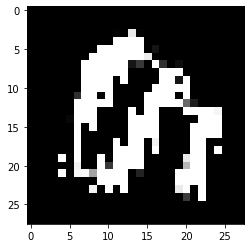

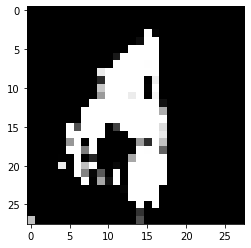

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


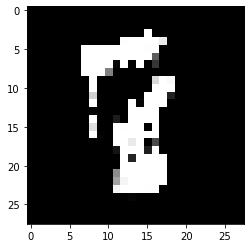

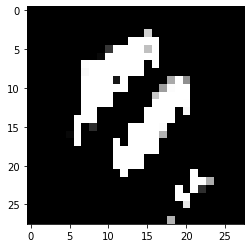

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


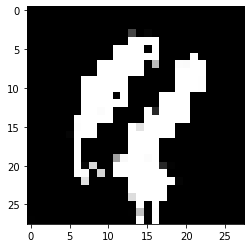

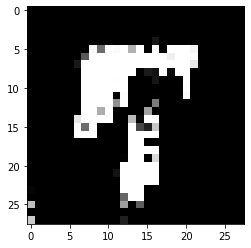

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


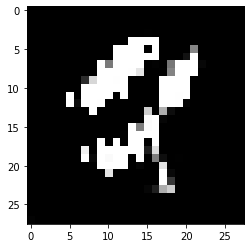

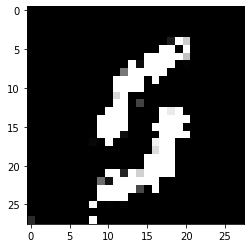

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


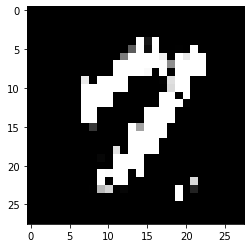

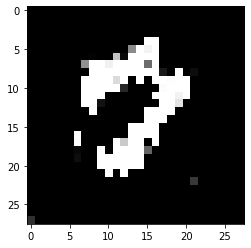

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


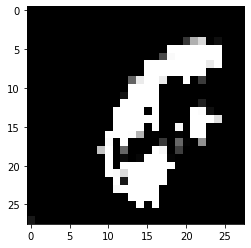

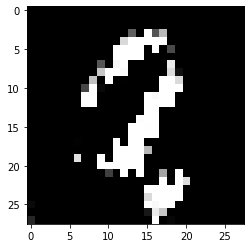

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


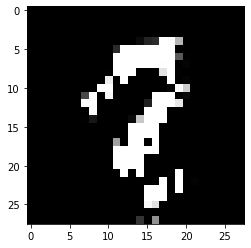

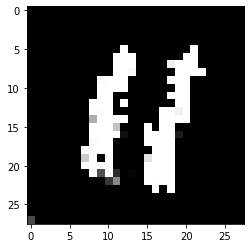

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


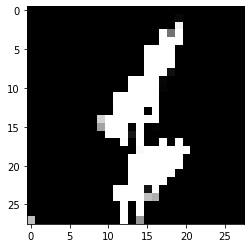

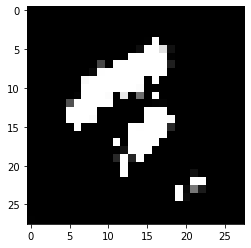

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


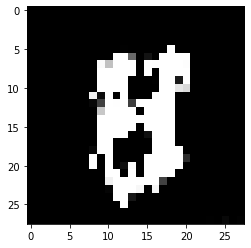

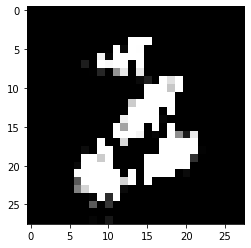

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


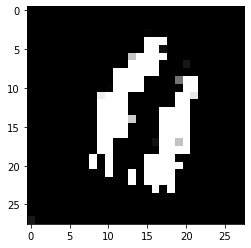

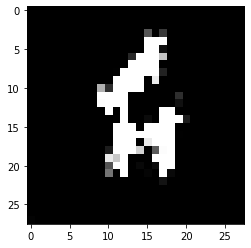

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


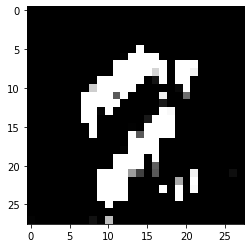

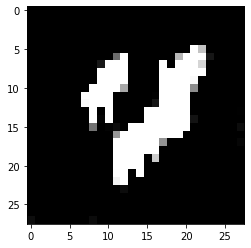

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


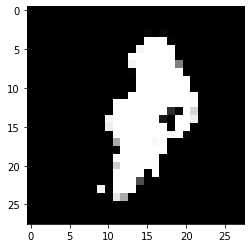

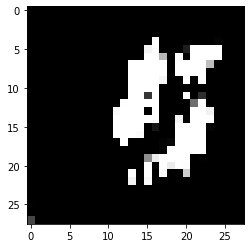

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


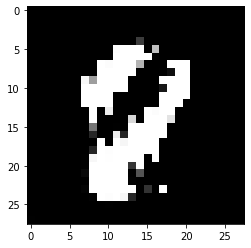

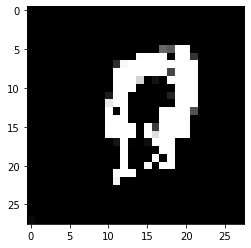

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 27ms/step


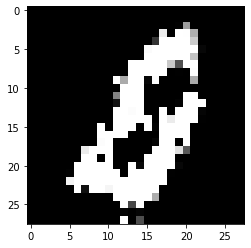

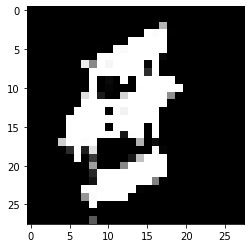

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


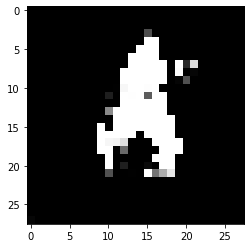

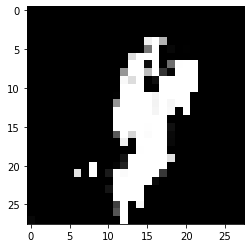

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


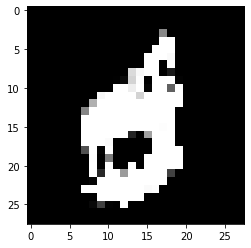

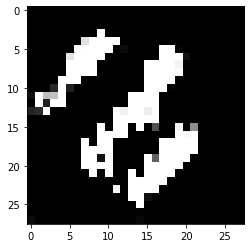

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 30ms/step


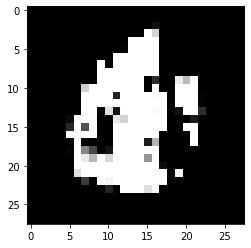

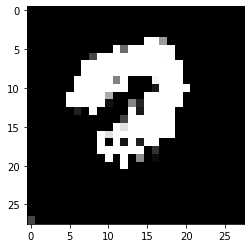

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 27ms/step


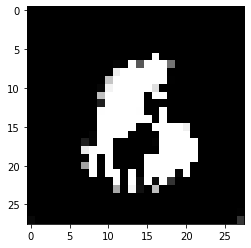

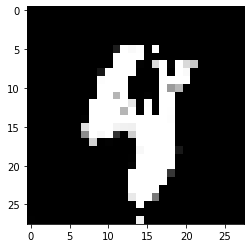

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


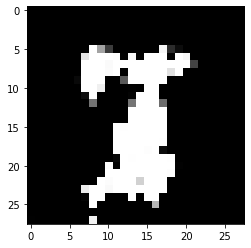

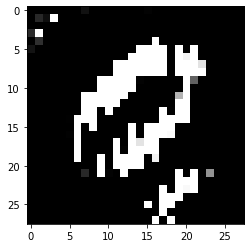

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


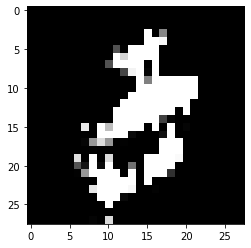

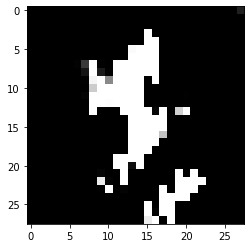

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


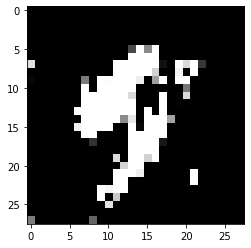

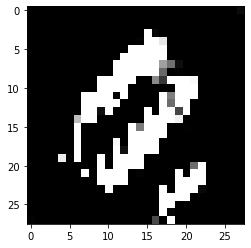

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


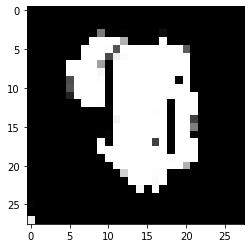

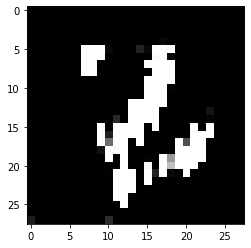

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 17ms/step


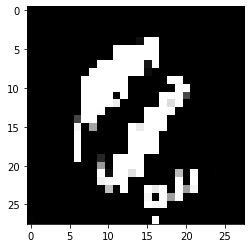

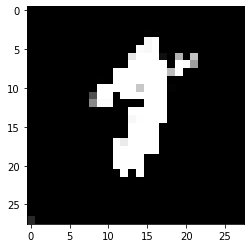

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


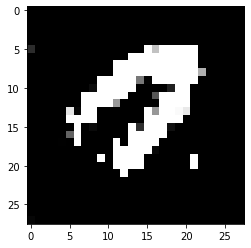

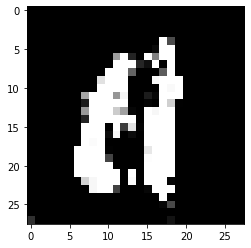

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


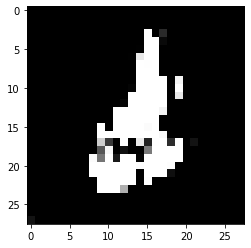

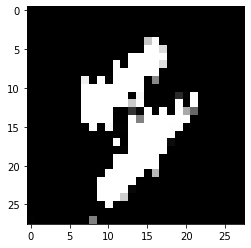

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


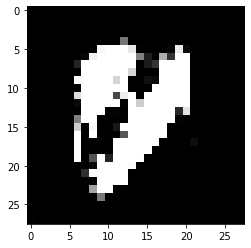

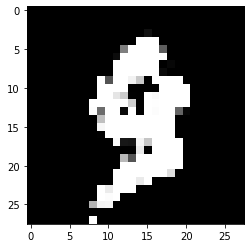

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


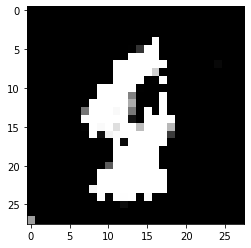

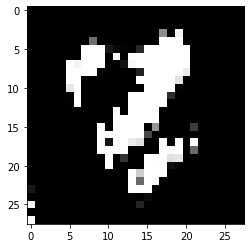

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


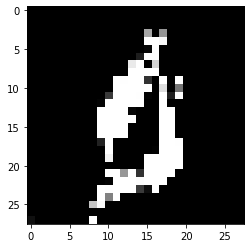

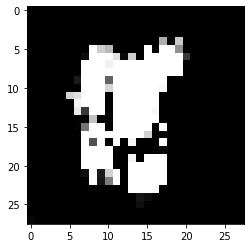

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


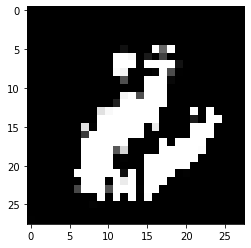

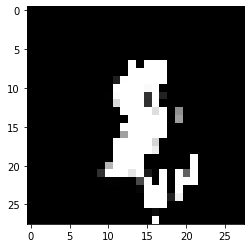

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


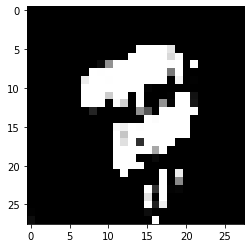

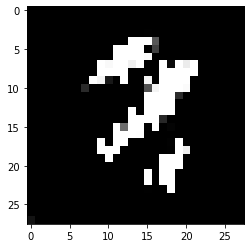

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


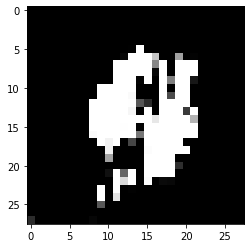

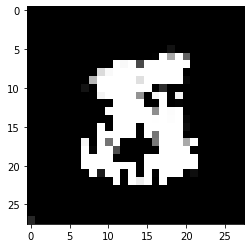

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


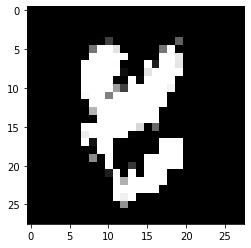

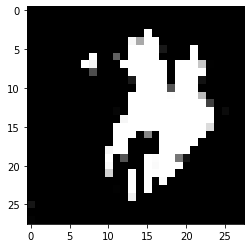

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


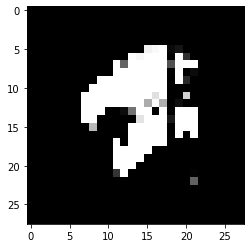

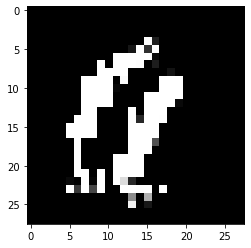

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


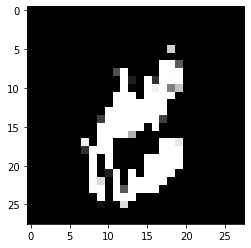

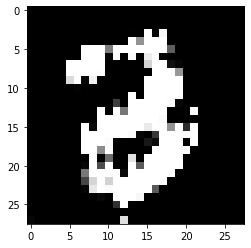

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


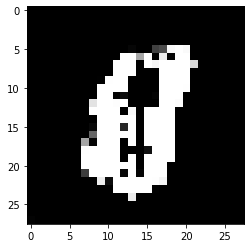

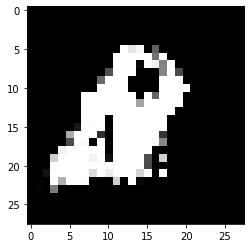

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


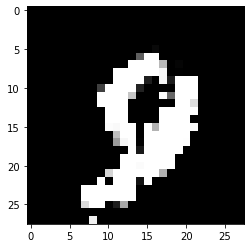

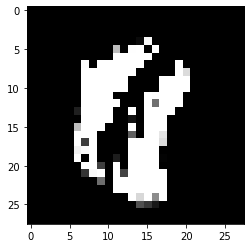

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


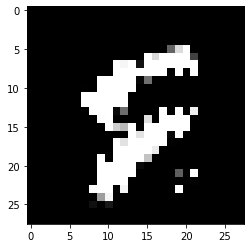

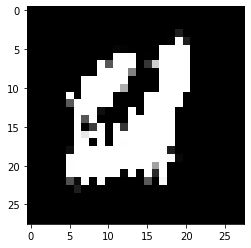

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


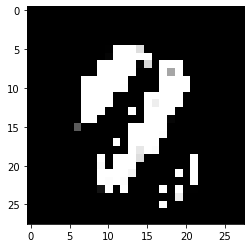

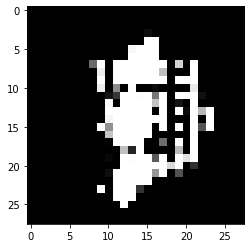

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


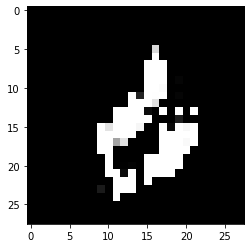

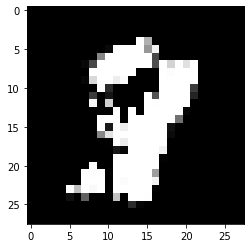

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


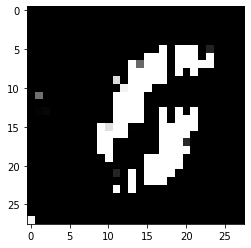

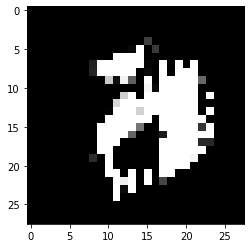

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


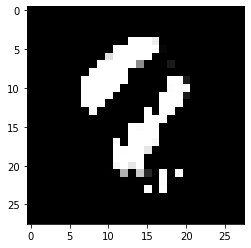

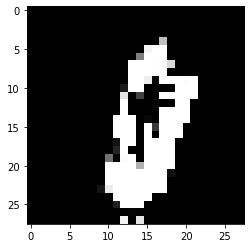

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


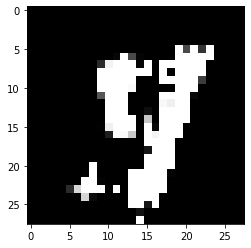

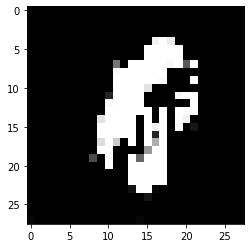

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


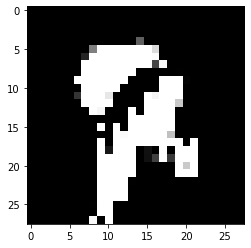

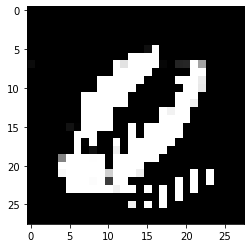

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


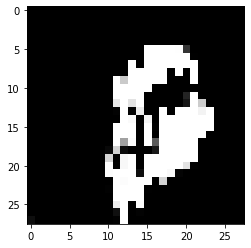

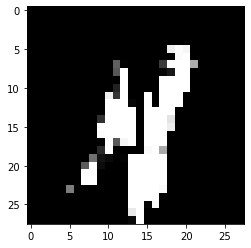

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 30ms/step


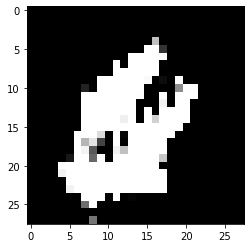

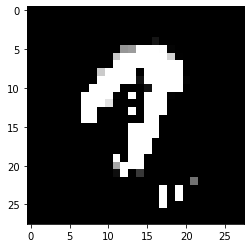

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


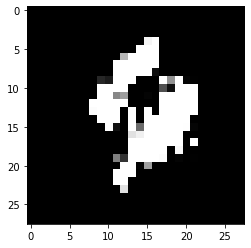

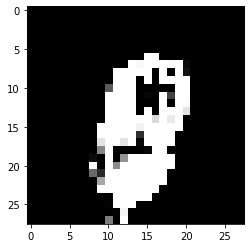

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


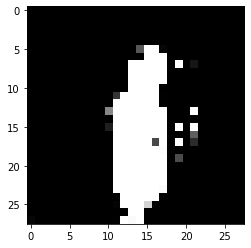

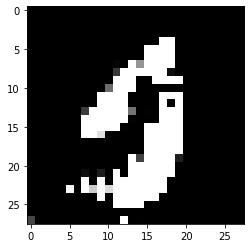

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


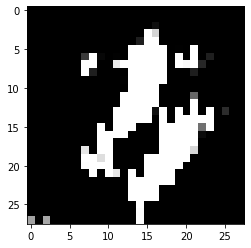

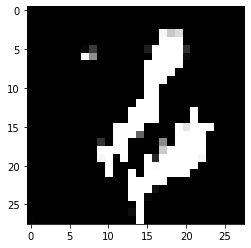

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


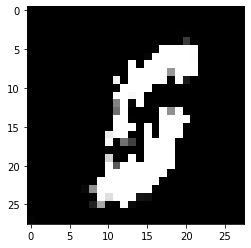

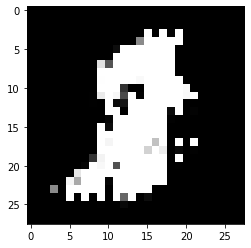

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


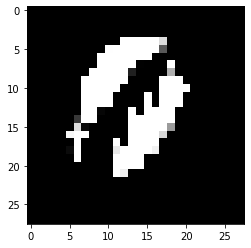

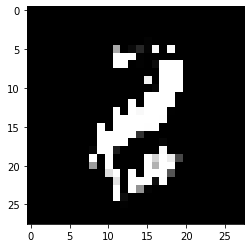

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


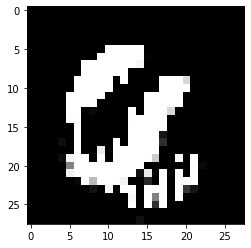

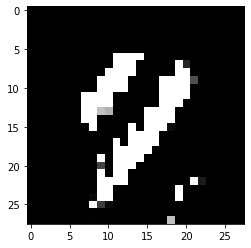

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


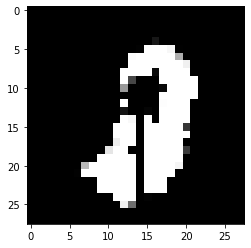

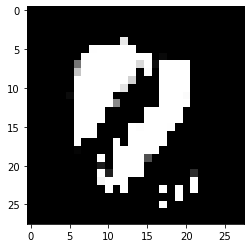

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


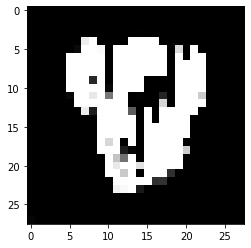

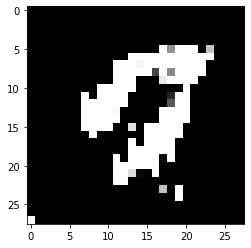

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


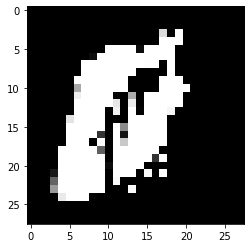

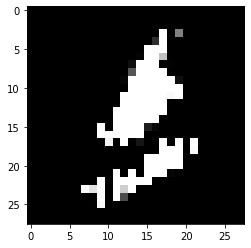

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


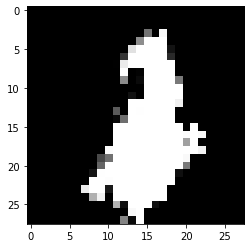

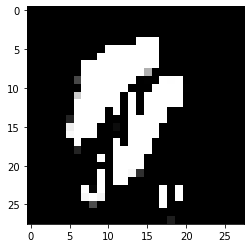

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


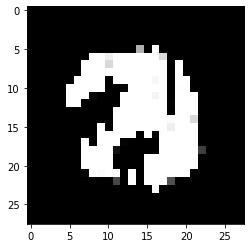

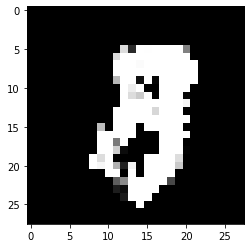

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


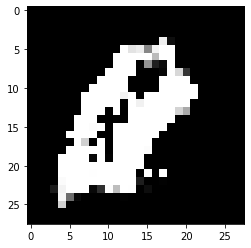

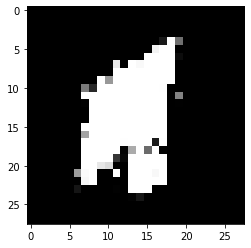

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


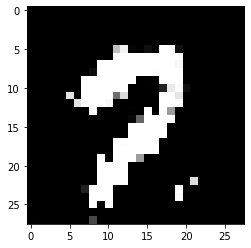

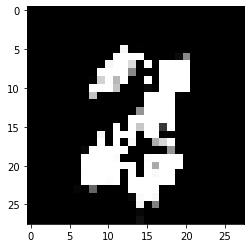

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


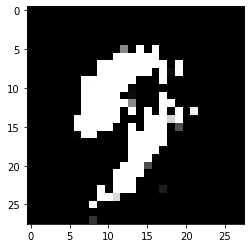

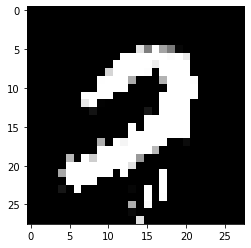

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


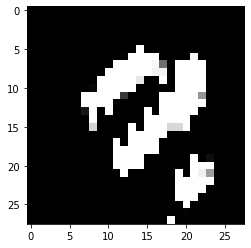

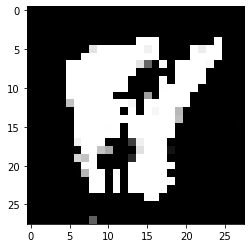

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


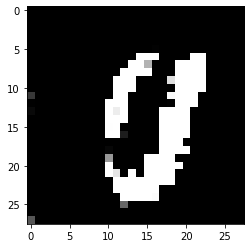

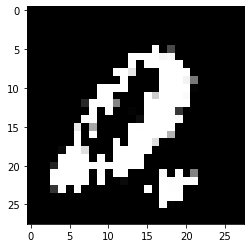

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


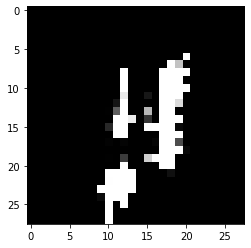

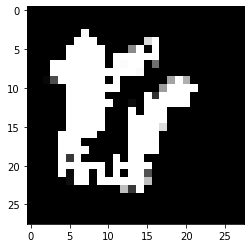

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


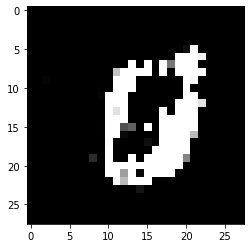

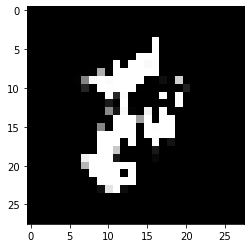

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


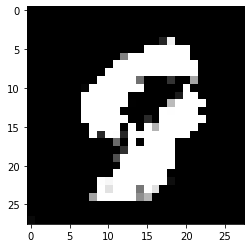

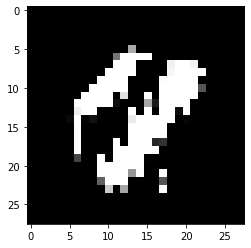

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


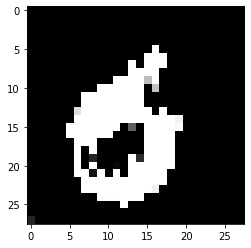

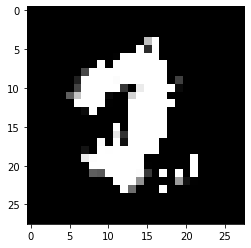

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


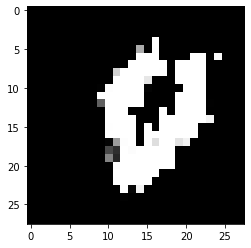

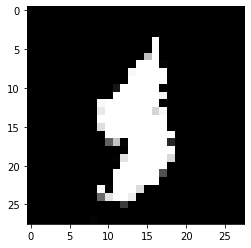

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


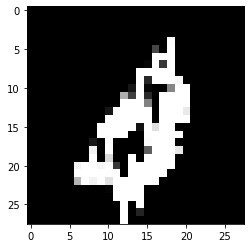

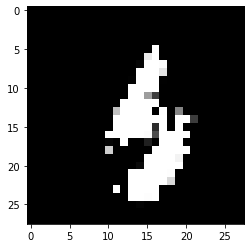

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


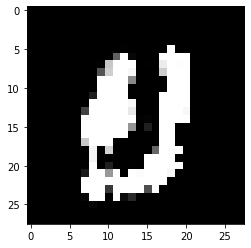

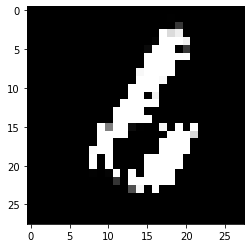

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


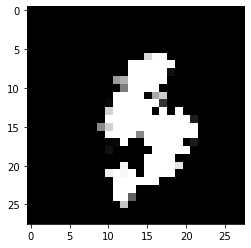

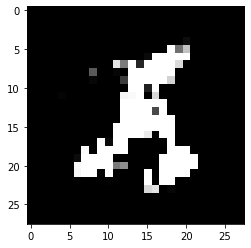

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 30ms/step


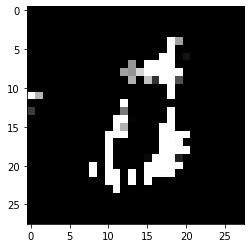

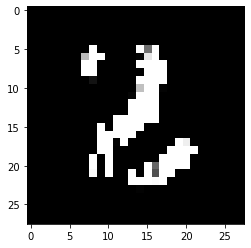

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


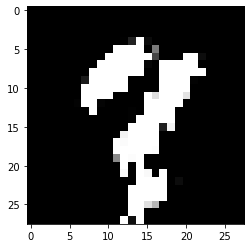

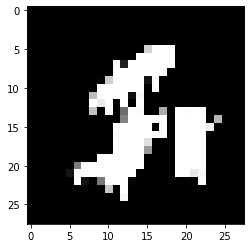

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 28ms/step


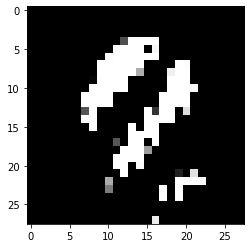

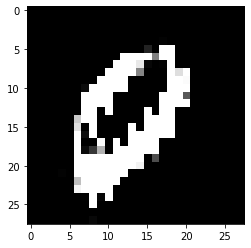

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


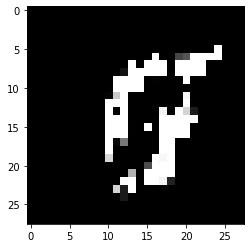

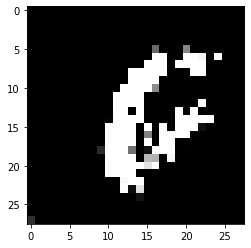

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


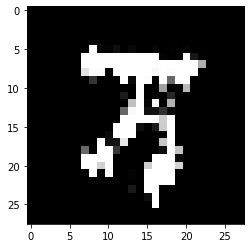

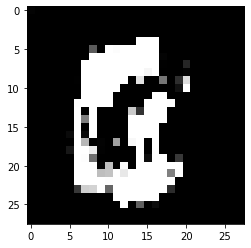

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


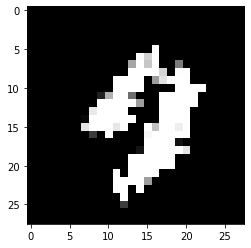

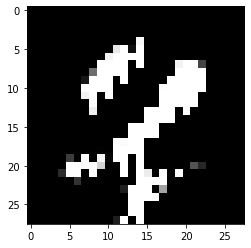

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


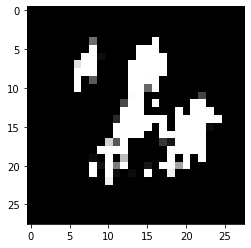

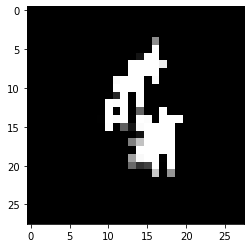

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


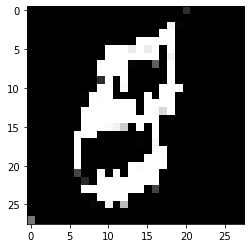

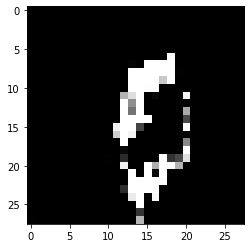

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


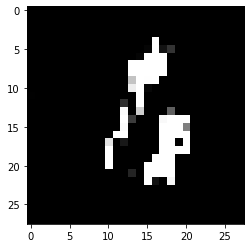

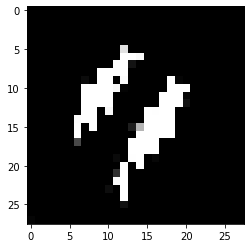

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


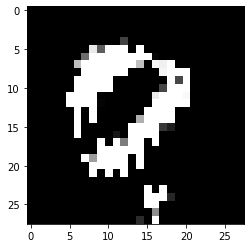

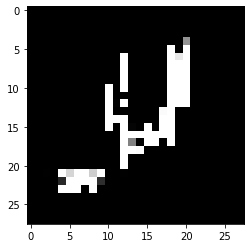

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


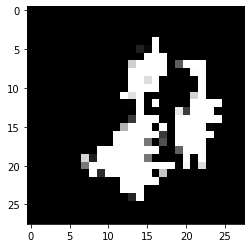

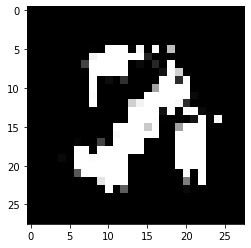

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


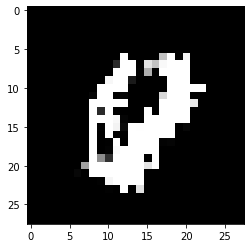

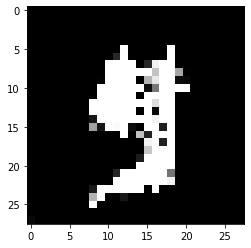

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


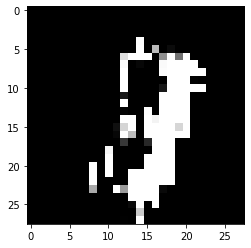

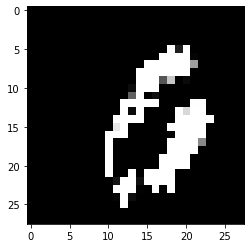

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


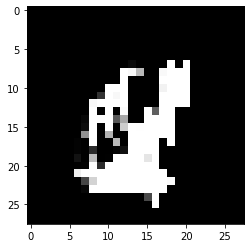

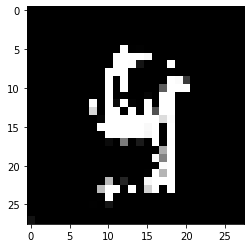

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


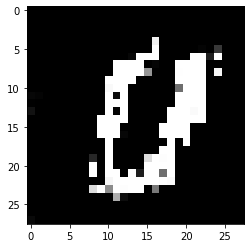

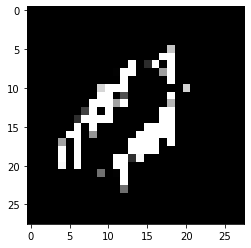

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


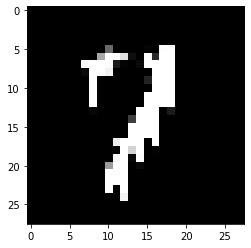

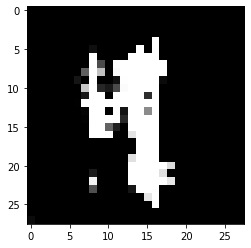

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


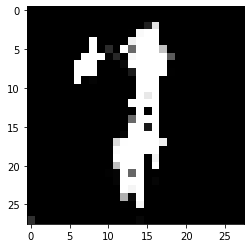

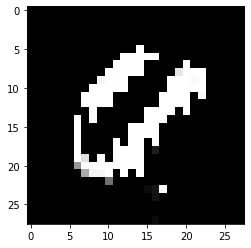

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


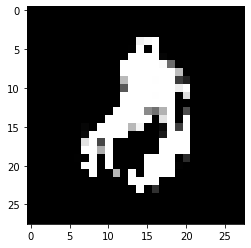

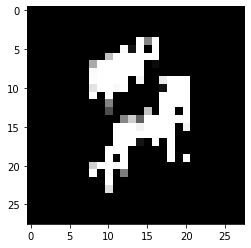

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


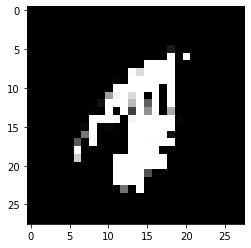

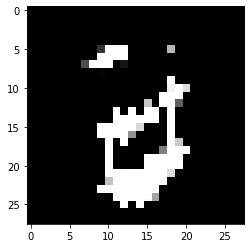

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


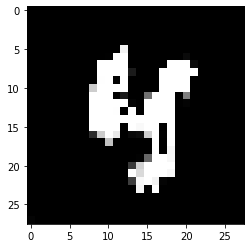

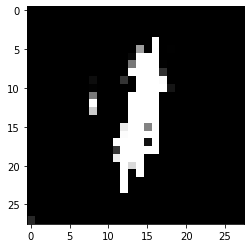

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


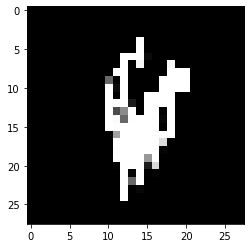

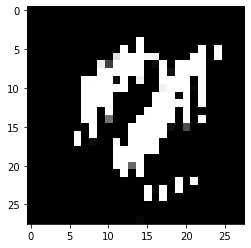

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


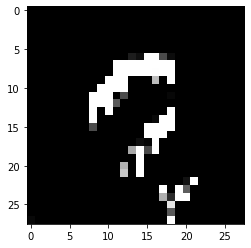

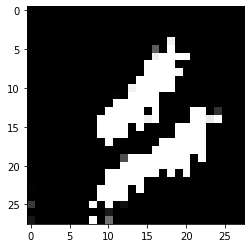

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


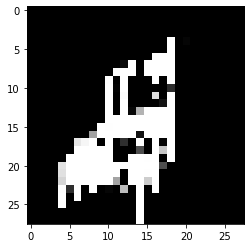

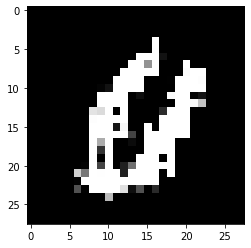

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


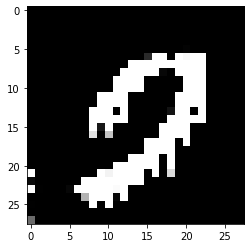

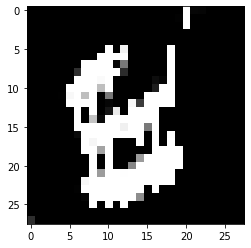

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


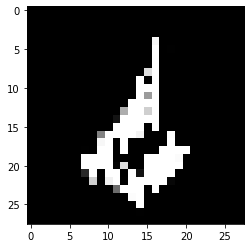

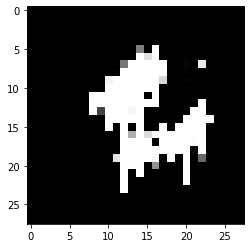

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


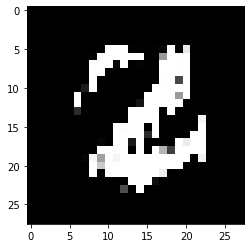

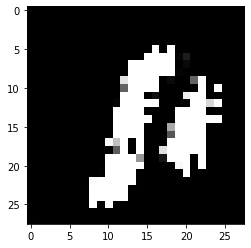

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


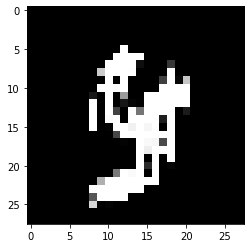

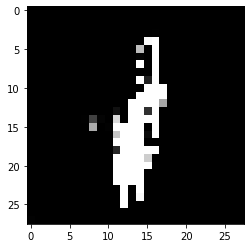

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


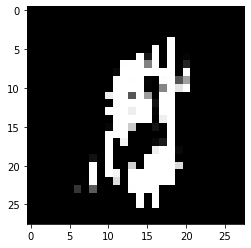

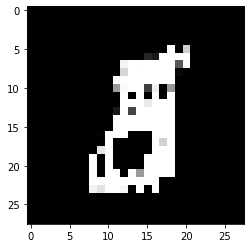

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


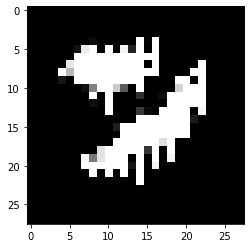

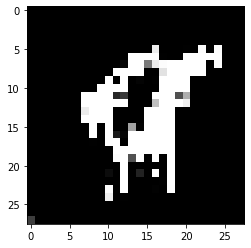

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


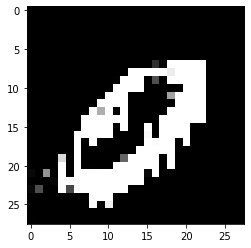

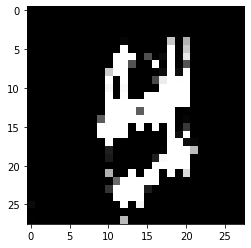

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


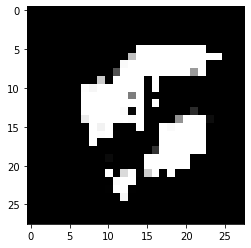

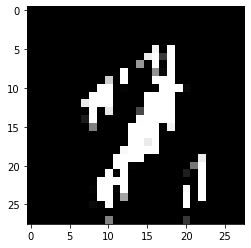

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


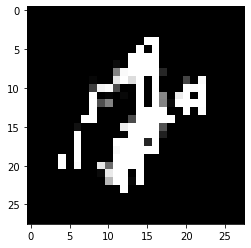

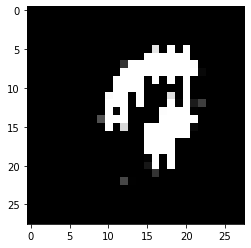

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


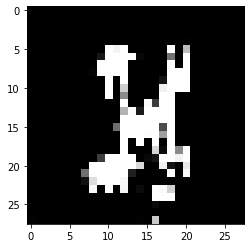

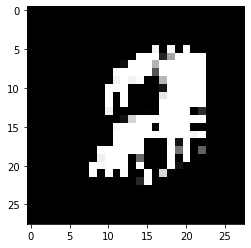

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


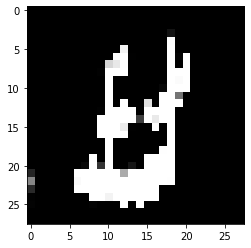

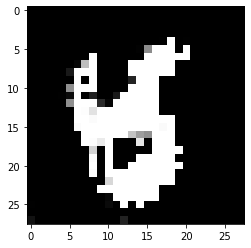

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


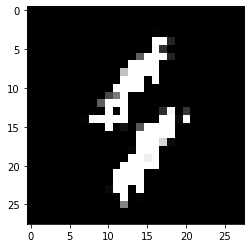

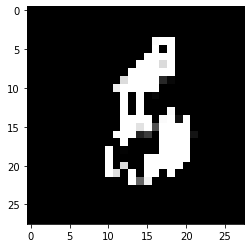

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


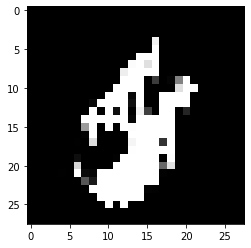

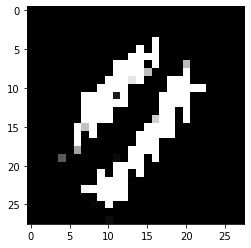

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


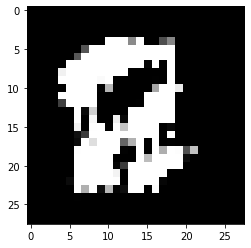

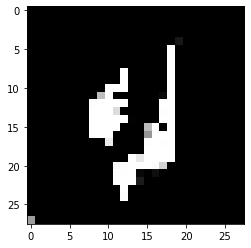

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


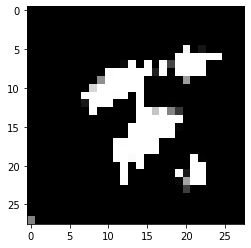

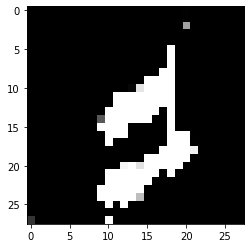

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


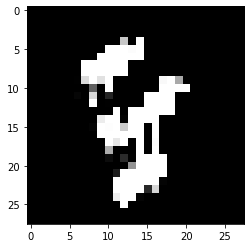

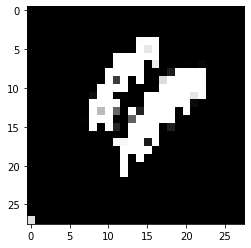

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


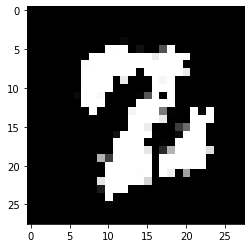

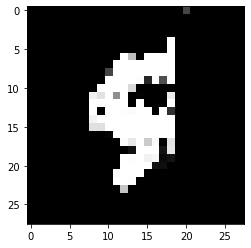

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


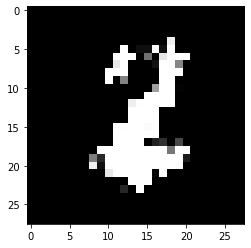

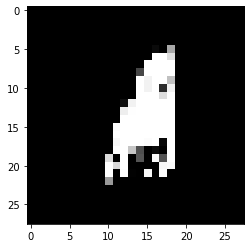

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


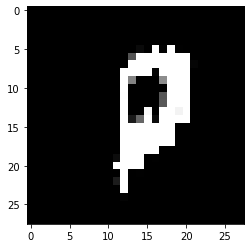

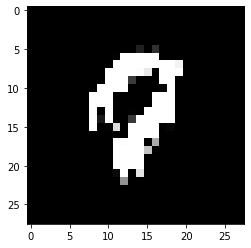

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


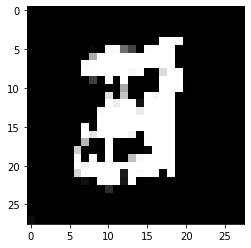

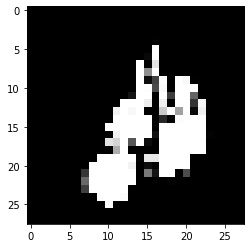

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


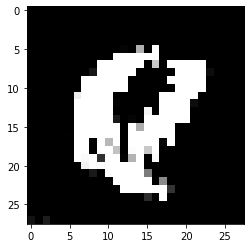

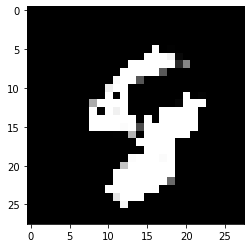

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


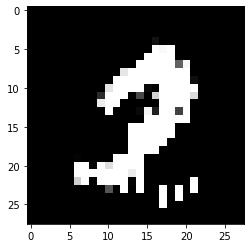

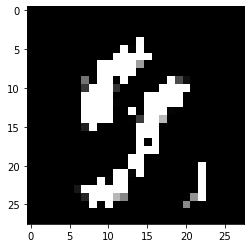

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


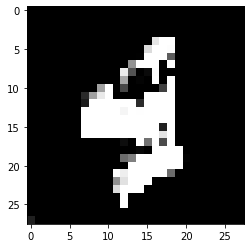

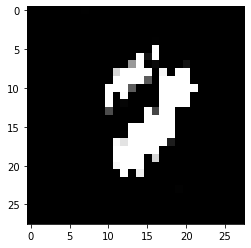

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


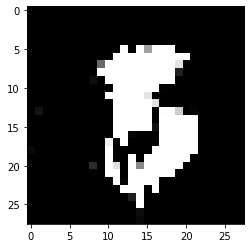

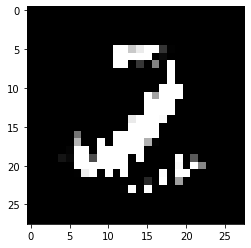

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


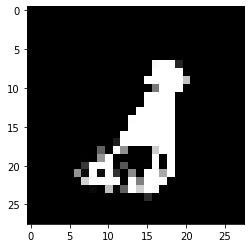

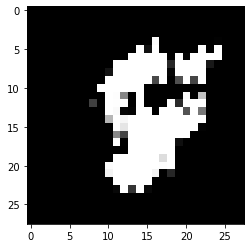

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


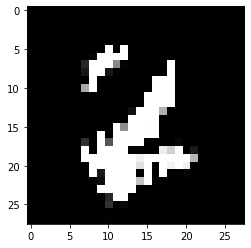

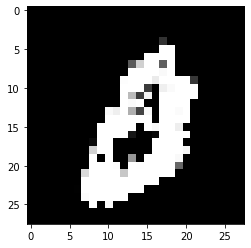

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


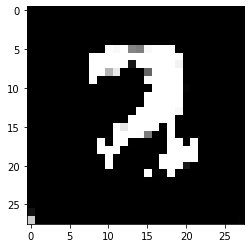

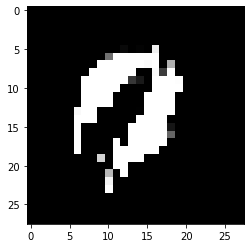

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


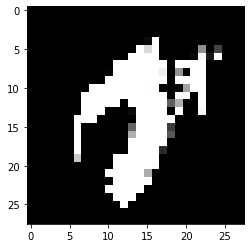

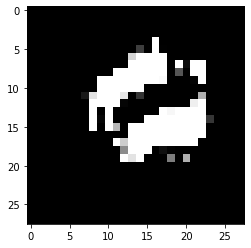

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 28ms/step


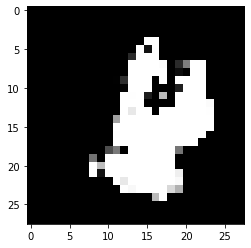

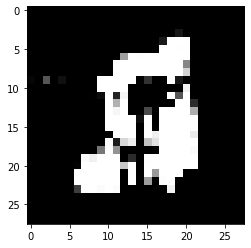

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


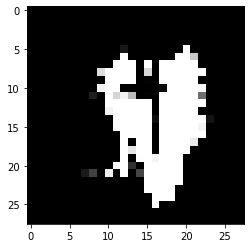

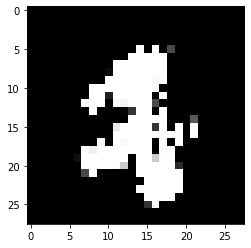

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


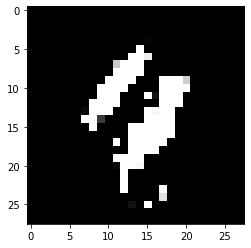

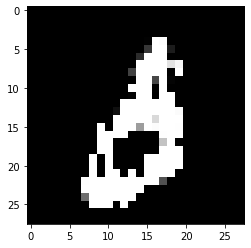

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


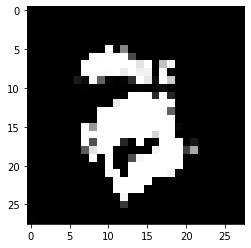

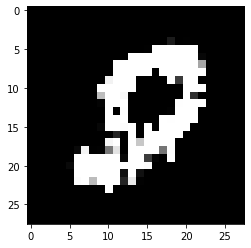

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


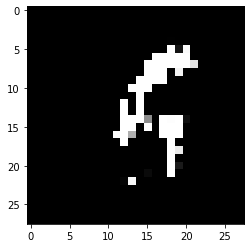

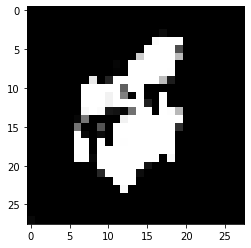

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


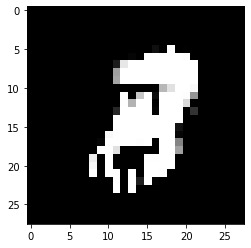

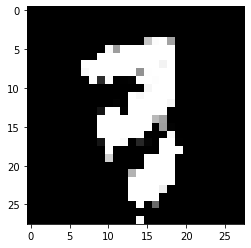

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


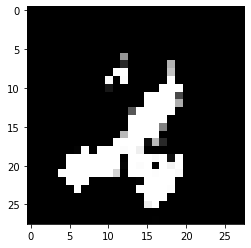

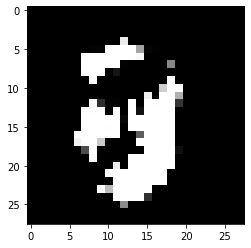

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


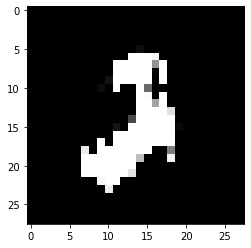

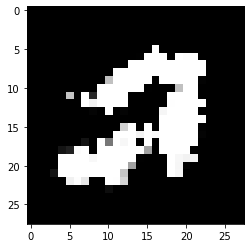

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


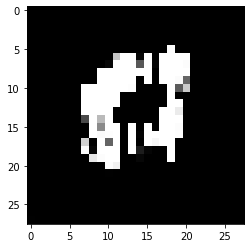

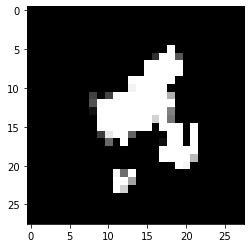

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


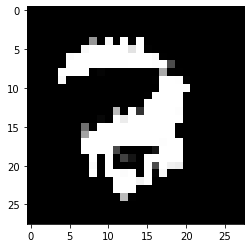

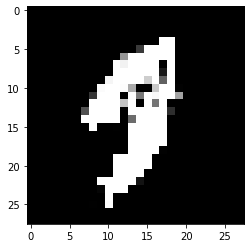

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


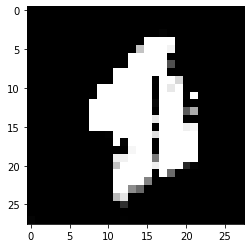

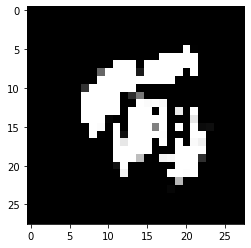

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


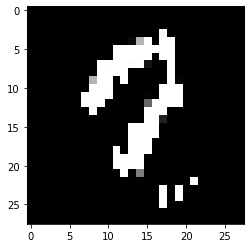

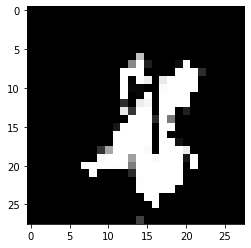

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


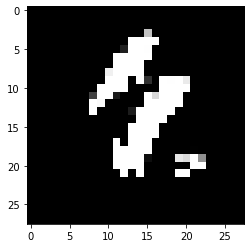

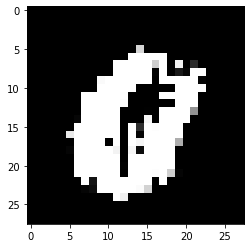

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


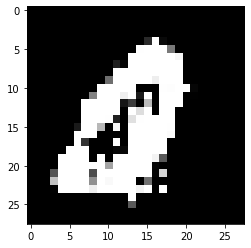

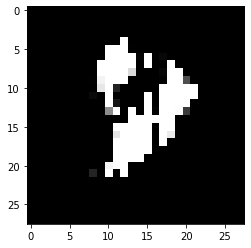

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


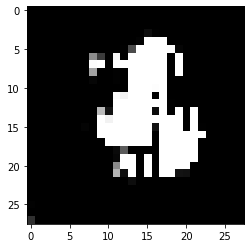

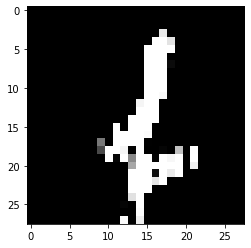

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


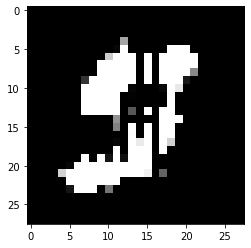

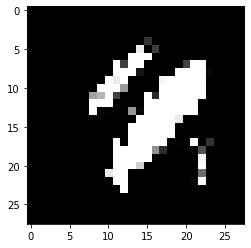

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


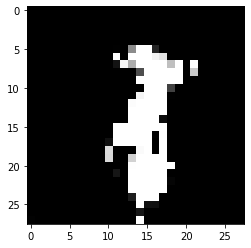

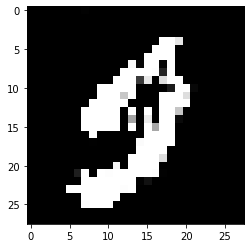

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


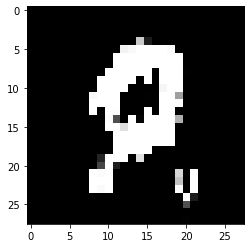

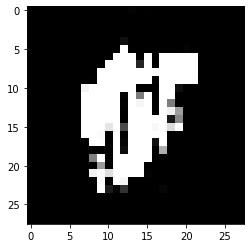

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


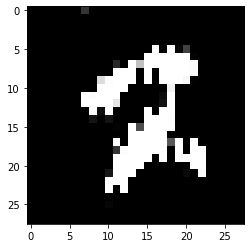

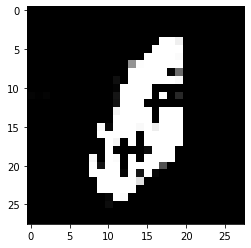

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


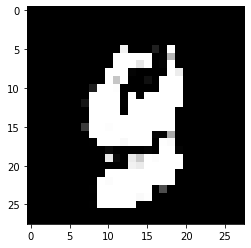

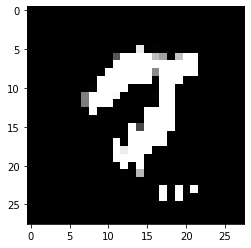

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 27ms/step


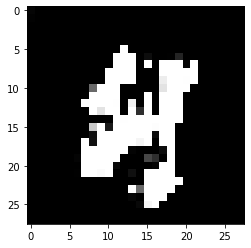

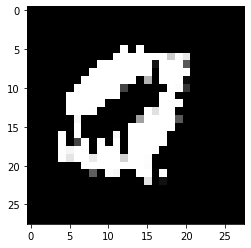

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


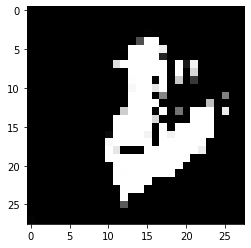

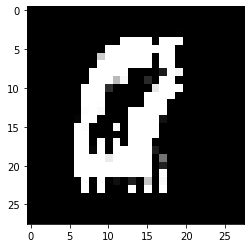

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


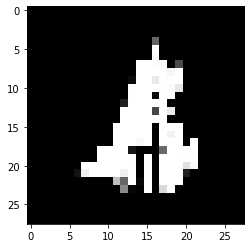

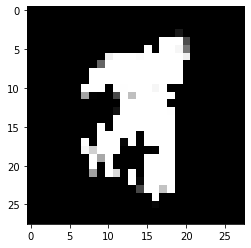

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


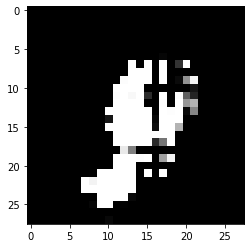

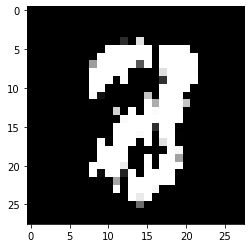

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


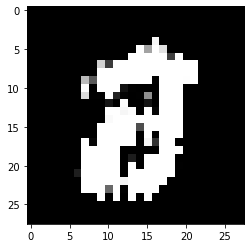

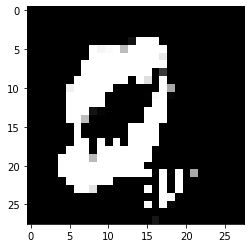

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 21ms/step


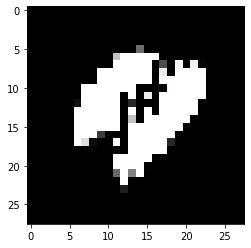

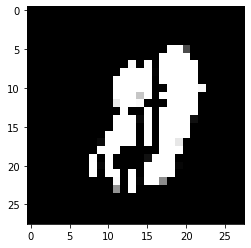

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


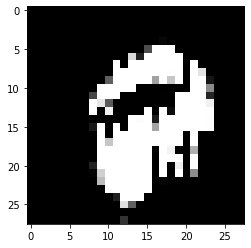

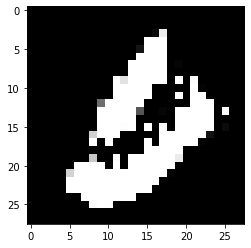

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


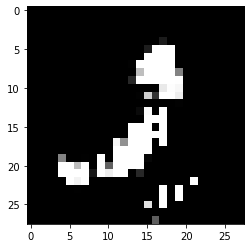

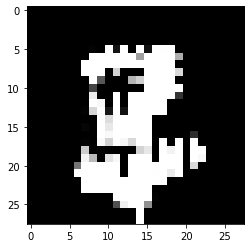

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 25ms/step


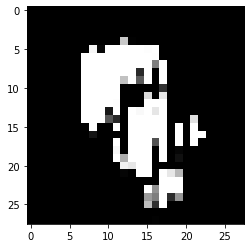

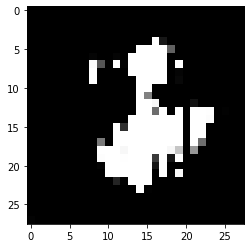

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


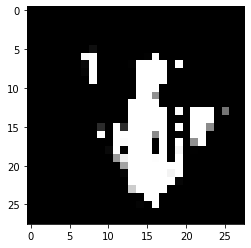

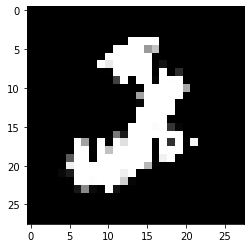

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 26ms/step


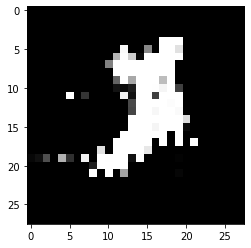

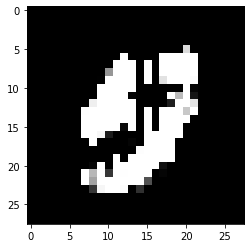

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


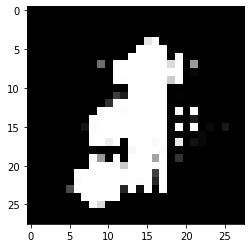

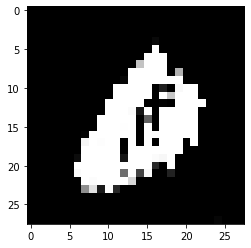

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


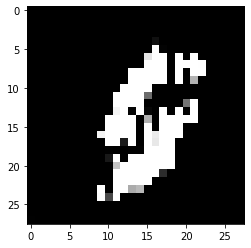

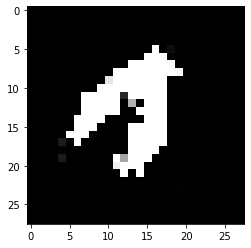

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


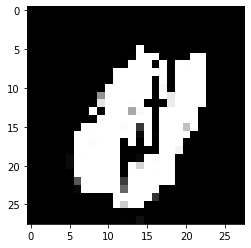

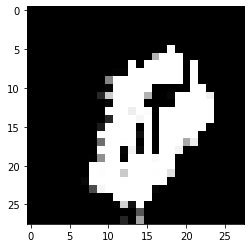

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


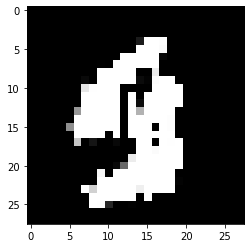

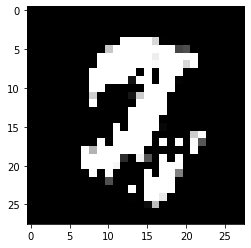

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


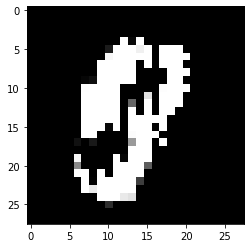

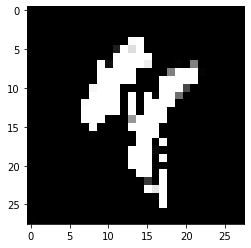

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


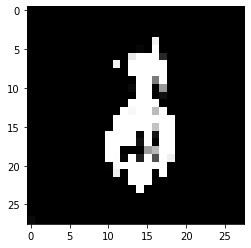

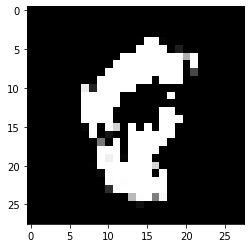

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


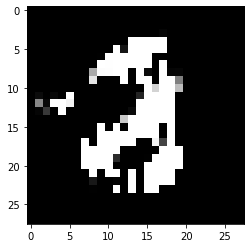

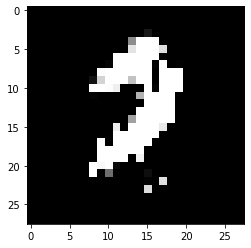

train discriminator:
True
True
4/4 [==============================] - 0s 5ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


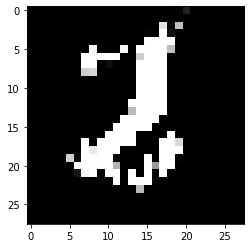

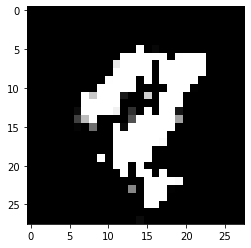

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 29ms/step


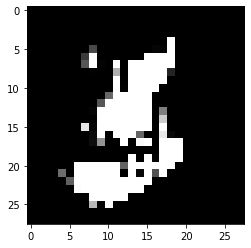

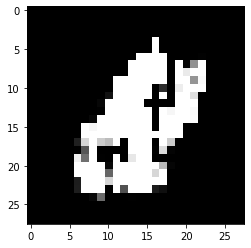

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


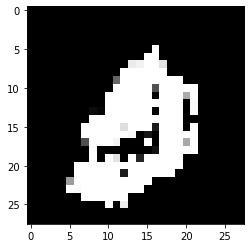

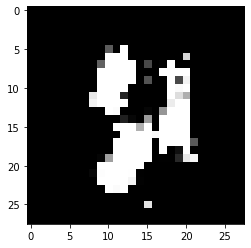

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 24ms/step


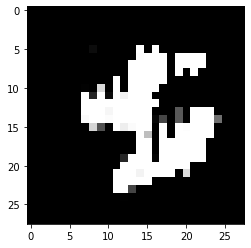

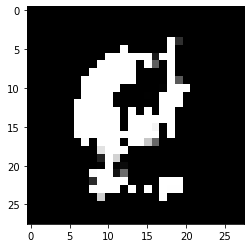

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


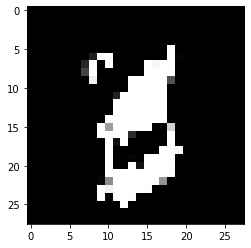

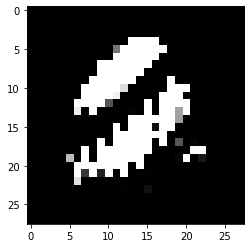

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 20ms/step


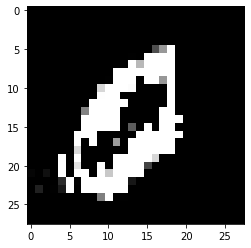

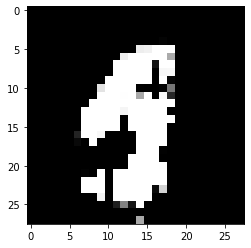

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 22ms/step


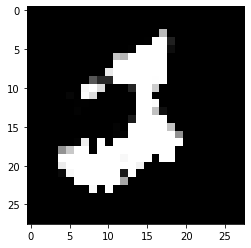

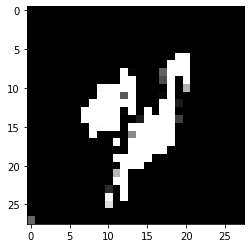

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 19ms/step


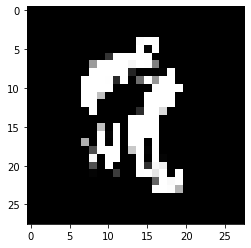

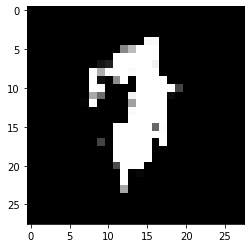

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


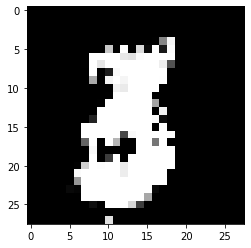

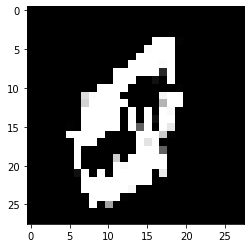

train discriminator:
True
True
4/4 [==============================] - 0s 3ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


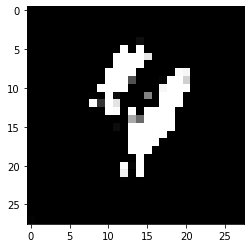

train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 23ms/step


train discriminator:
True
True
4/4 [==============================] - 0s 4ms/step
(256, 1)
(256, 28, 28, 1)
train generator:
False
False
1/1 [==============================] - 0s 18ms/step


In [ ]:
import keras.backend as K

def show(nono):
  test_count = 2
  test_gen = gen_model.predict(nono[:test_count])
  for i in range(test_count):
    plt.imshow(np.squeeze(test_gen[i]), cmap='gray')
    plt.show()

(x_train, y_train), (x_test, y_test) = mnist.load_data()

print(x_train.shape)
print(y_train.shape)

x_train = x_train / 255.0

'''
n_all = x_test.shape[0]
labels = K.reshape(np.array([0,1]*n_all), (n_all, 2))
print(labels.shape)
disc_model.fit(x_test, labels, epochs=5, batch_size=20)
'''

n_train = 128
n_gen = 256

batch_size = 4

d = 0.00

for i in range(1000):
  print('train discriminator:')
  print(disc_model.get_layer('disc_out').trainable)
  print(gen_dis_model.get_layer('xiaodai').trainable)

  ix = np.random.randint(0, x_train.shape[0], n_train)
  positive = x_train[ix]
  positive = np.expand_dims(positive, -1)
  noise = generate_latent_points(latent_dim, n_train)
  negative = gen_model.predict(noise)
  data = np.vstack([positive, negative])
  pos_label = np.ones((n_train, 1))
  neg_label = np.zeros((n_train, 1))
  labels = np.vstack([pos_label, neg_label])
  print(labels.shape)
  print(data.shape)
  #disc_model.fit(data, labels, epochs=1, batch_size=batch_size)
  disc_model.train_on_batch(data, labels)


  
  print('train generator:')
  new_noise = generate_latent_points(latent_dim, n_gen)
  gen_dis_model.get_layer('xiaodai').trainable = False
  print(disc_model.get_layer('disc_out').trainable)
  print(gen_dis_model.get_layer('xiaodai').trainable)
  labels_gen = np.ones((n_gen,1))
  #gen_dis_model.fit(new_noise, labels_gen, epochs = 1, batch_size=batch_size)
  gen_dis_model.train_on_batch(new_noise, labels_gen)
  gen_dis_model.get_layer('xiaodai').trainable = True

  show(new_noise)


In [ ]:
test_count = 5
noise = K.random_normal((test_count, latent_dim))
test_gen = gen_model.predict(noise)
for i in range(test_count):
  plt.imshow(np.squeeze(test_gen[i]), cmap='gray')
  plt.show()

In [ ]:
# example of training a gan on mnist
from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy import vstack
from numpy.random import randn
from numpy.random import randint
from keras.datasets.mnist import load_data
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout
from matplotlib import pyplot
 
# define the standalone discriminator model
def define_discriminator(in_shape=(28,28,1)):
 model = Sequential()
 model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same', input_shape=in_shape))
 model.add(LeakyReLU(alpha=0.2))
 model.add(Dropout(0.4))
 model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same'))
 model.add(LeakyReLU(alpha=0.2))
 model.add(Dropout(0.4))
 model.add(Flatten())
 model.add(Dense(1, activation='sigmoid'))
 # compile model
 opt = Adam(lr=0.0002, beta_1=0.5)
 model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
 return model
 
# define the standalone generator model
def define_generator(latent_dim):
 model = Sequential()
 # foundation for 7x7 image
 n_nodes = 128 * 7 * 7
 model.add(Dense(n_nodes, input_dim=latent_dim))
 model.add(LeakyReLU(alpha=0.2))
 model.add(Reshape((7, 7, 128)))
 # upsample to 14x14
 model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
 model.add(LeakyReLU(alpha=0.2))
 # upsample to 28x28
 model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
 model.add(LeakyReLU(alpha=0.2))
 model.add(Conv2D(1, (7,7), activation='sigmoid', padding='same'))
 return model
 
# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
 # make weights in the discriminator not trainable
 d_model.trainable = False
 # connect them
 model = Sequential()
 # add generator
 model.add(g_model)
 # add the discriminator
 model.add(d_model)
 # compile model
 opt = Adam(lr=0.0002, beta_1=0.5)
 model.compile(loss='binary_crossentropy', optimizer=opt)
 return model
 
# load and prepare mnist training images
def load_real_samples():
 # load mnist dataset
 (trainX, _), (_, _) = load_data()
 # expand to 3d, e.g. add channels dimension
 X = expand_dims(trainX, axis=-1)
 # convert from unsigned ints to floats
 X = X.astype('float32')
 # scale from [0,255] to [0,1]
 X = X / 255.0
 return X
 
# select real samples
def generate_real_samples(dataset, n_samples):
 # choose random instances
 ix = randint(0, dataset.shape[0], n_samples)
 # retrieve selected images
 X = dataset[ix]
 # generate 'real' class labels (1)
 y = ones((n_samples, 1))
 return X, y
 
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
 # generate points in the latent space
 x_input = randn(latent_dim * n_samples)
 # reshape into a batch of inputs for the network
 x_input = x_input.reshape(n_samples, latent_dim)
 return x_input
 
# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
 # generate points in latent space
 x_input = generate_latent_points(latent_dim, n_samples)
 # predict outputs
 X = g_model.predict(x_input)
 # create 'fake' class labels (0)
 y = zeros((n_samples, 1))
 return X, y
 
# create and save a plot of generated images (reversed grayscale)
def save_plot(examples, epoch, n=10):
 # plot images
 for i in range(n * n):
  # define subplot
  pyplot.subplot(n, n, 1 + i)
  # turn off axis
  pyplot.axis('off')
  # plot raw pixel data
  pyplot.imshow(examples[i, :, :, 0], cmap='gray_r')
  # save plot to file
  filename = 'generated_plot_e%03d.png' % (epoch+1)
  pyplot.savefig(filename)
  pyplot.close()
 
# evaluate the discriminator, plot generated images, save generator model
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=100):
 # prepare real samples
 X_real, y_real = generate_real_samples(dataset, n_samples)
 # evaluate discriminator on real examples
 _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
 # prepare fake examples
 x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
 # evaluate discriminator on fake examples
 _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
 # summarize discriminator performance
 print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))
 # save plot
 save_plot(x_fake, epoch)
 # save the generator model tile file
 filename = 'generator_model_%03d.h5' % (epoch + 1)
 g_model.save(filename)
 
# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=100, n_batch=256):
 bat_per_epo = int(dataset.shape[0] / n_batch)
 half_batch = int(n_batch / 2)
 # manually enumerate epochs
 for i in range(n_epochs):
 # enumerate batches over the training set
  for j in range(bat_per_epo):
    # get randomly selected 'real' samples
    X_real, y_real = generate_real_samples(dataset, half_batch)
    # generate 'fake' examples
    X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
    # create training set for the discriminator
    X, y = vstack((X_real, X_fake)), vstack((y_real, y_fake))
    # update discriminator model weights
    d_loss, _ = d_model.train_on_batch(X, y)
    # prepare points in latent space as input for the generator
    X_gan = generate_latent_points(latent_dim, n_batch)
    # create inverted labels for the fake samples
    y_gan = ones((n_batch, 1))
    # update the generator via the discriminator's error
    g_loss = gan_model.train_on_batch(X_gan, y_gan)
    # summarize loss on this batch
    print('>%d, %d/%d, d=%.3f, g=%.3f' % (i+1, j+1, bat_per_epo, d_loss, g_loss))
    # evaluate the model performance, sometimes
    if (i+1) % 10 == 0:
      summarize_performance(i, g_model, d_model, dataset, latent_dim)
 
# size of the latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# load image data
dataset = load_real_samples()
# train model
train(g_model, d_model, gan_model, dataset, latent_dim)

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


4/4 [==============================] - 1s 195ms/step
>1, 1/234, d=0.687, g=0.742
4/4 [==============================] - 1s 191ms/step
>1, 2/234, d=0.679, g=0.763
4/4 [==============================] - 1s 189ms/step
>1, 3/234, d=0.671, g=0.781
4/4 [==============================] - 1s 195ms/step
>1, 4/234, d=0.662, g=0.795
4/4 [==============================] - 1s 188ms/step
>1, 5/234, d=0.653, g=0.823
4/4 [==============================] - 1s 189ms/step
>1, 6/234, d=0.650, g=0.840
4/4 [==============================] - 1s 198ms/step


KeyboardInterrupt: ignored